In [1]:
import os

# Set the environment variable
os.environ['DATA_DIRECTORY'] = '/Users/liamk/research-project-erc20-governance/data'

# Now you can access it
path = os.environ['DATA_DIRECTORY']
print(f"The data directory is set to: {path}")

The data directory is set to: /Users/liamk/research-project-erc20-governance/data


In [2]:
import pandas as pd
import os
from dotenv import load_dotenv

# Load environment variables from .env file
load_dotenv()  

# Set the base data directory path from environment variable
data_directory = os.environ.get('DATA_DIRECTORY')

# Verify if the DATA_DIRECTORY environment variable is set
if not data_directory:
    raise EnvironmentError("DATA_DIRECTORY environment variable is not set.")

# Define file paths
snapshot_file_path = os.path.join(data_directory, 'snapshot_selection.csv')
token_file_path = os.path.join(data_directory, 'final_token_selection.csv')

# Check if the files exist
if not os.path.exists(snapshot_file_path):
    print(f"File does not exist: {snapshot_file_path}")
else:
    print(f"File exists: {snapshot_file_path}")

if not os.path.exists(token_file_path):
    print(f"File does not exist: {token_file_path}")
else:
    print(f"File exists: {token_file_path}")

# Read the snapshot selection CSV file
try:
    df_snapshots = pd.read_csv(snapshot_file_path)
    df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format
    print("Snapshot selection file loaded successfully. Here are the first few rows:")
    print(df_snapshots.head())
except Exception as e:
    print(f"Error reading snapshot selection file: {e}")

# Read the final token selection CSV file
try:
    df_tokens = pd.read_csv(token_file_path)
    print("Final token selection file loaded successfully. Here are the first few rows:")
    print(df_tokens.head())
except Exception as e:
    print(f"Error reading final token selection file: {e}")

# Convert DataFrame to a dictionary where keys are addresses and values are symbols
try:
    address_to_symbol = pd.Series(df_tokens['symbol'].values, index=df_tokens['address']).to_dict()
    print("Address to symbol dictionary created successfully.")
    print(list(address_to_symbol.items())[:5])  # Print the first 5 items
except Exception as e:
    print(f"Error creating address to symbol dictionary: {e}")

# Known burner addresses
known_burner_addresses = [
    '0x0000000000000000000000000000000000000000',
    '0x0000000000000000000000000000000000000001',
    '0x0000000000000000000000000000000000000002',
    '0x0000000000000000000000000000000000000003',
    '0x0000000000000000000000000000000000000004',
    '0x0000000000000000000000000000000000000005',
    '0x0000000000000000000000000000000000000006',
    '0x0000000000000000000000000000000000000007',
    '0x000000000000000000000000000000000000dead'
]

print("Known burner addresses list:")
print(known_burner_addresses)

/Users/liamk/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


File exists: /Users/liamk/research-project-erc20-governance/data/snapshot_selection.csv
File exists: /Users/liamk/research-project-erc20-governance/data/final_token_selection.csv
Snapshot selection file loaded successfully. Here are the first few rows:
   Nr.  Block Height       Date
0    1       7962629 2019-06-15
1    2       8155117 2019-07-15
2    3       8354625 2019-08-15
3    4       8553607 2019-09-15
4    5       8745378 2019-10-15
Final token selection file loaded successfully. Here are the first few rows:
      coingecko_id     name    VL    MC  \
0          uniswap  Uniswap  True  True   
1             aave     Aave  True  True   
2         lido-dao     Lido  True  True   
3            maker    Maker  True  True   
4  curve-dao-token    Curve  True  True   

                                      address symbol  
0  0x1f9840a85d5af5bf1d1762f925bdaddc4201f984    UNI  
1  0x7fc66500c84a76ad7e9c93437bfc5ac33e2ddae9   AAVE  
2  0x5a98fcbea516cf06857215779fd812ca3bef1b32    LDO  

In [3]:
import sys

current_dir = os.getcwd()
sys.path.append(os.path.abspath(os.path.join(current_dir, '..')))

from src.analysis.clique_analysis import * 
from src.visualisations.wallet_network_projections_visualisations import * 

In [4]:
import os
from os.path import join
from dotenv import load_dotenv
import dask.dataframe as dd
from tqdm import tqdm
import pandas as pd
import time
import numpy as np
import networkx as nx

from src.wallet_projection.wallet_projection_analysis import validate_wallet_links  # Adjust the import if necessary

load_dotenv()

path = os.environ['DATA_DIRECTORY']

# Constants
SNAPSHOT_CSV_PATH = '/Users/liamk/Desktop/DATA_DIRECTORY/data/snapshot_selection.csv'
ADDRESS_CSV_PATH = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
OUTPUT_PATH = join(path, '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs')
SUPPLY_THRESHOLD = 0.01 # 0.01  equal 1% of token supply

KNOWN_BURNER_ADDRESSES = set([
    '0x0000000000000000000000000000000000000000', '0x000000000000000000000000000000000000dead',
    '0x0000000000000000000000000000000000000001', '0x0000000000000000000000000000000000000002',
    '0x0000000000000000000000000000000000000003', '0x0000000000000000000000000000000000000004',
    '0x0000000000000000000000000000000000000005', '0x0000000000000000000000000000000000000006',
    '0x0000000000000000000000000000000000000007'
])

# Helper function to process each snapshot
def process_snapshot(snapshot, df_addresses):
    start_time = time.time()
    
    dtypes = {
        'label': 'object',  # Specify dtype for the label column
        # Add other columns with their expected dtypes if necessary
    }
    
    ddf = dd.read_csv(
        join(path, f'/Users/liamk/Desktop/DATA_DIRECTORY/data/snapshot_token_balance_tables_enriched/token_holder_snapshot_balance_labelled_{snapshot}.csv'),
        dtype=dtypes
    )   
    
    # Efficient filtering using Dask
    ddf = ddf[(ddf['value'] > 0) & 
              (ddf.pct_supply > SUPPLY_THRESHOLD) &
              (~ddf['address'].isin(KNOWN_BURNER_ADDRESSES)) & 
              (ddf['token_address'].isin(df_addresses['address']))]

    present_addresses = ddf['address'].unique().compute()
    pop_size = len(ddf['token_address'].unique().compute())

    # Validate wallet links in parallel
    validated_links = validate_wallet_links(present_addresses, ddf.compute(), pop_size)

    G = nx.Graph()
    G.add_edges_from(validated_links['combination'])

    # Store the graph with a name based on snapshot height
    nx.write_graphml(G, join(OUTPUT_PATH, f'validated_wallet_projection_graph_{snapshot}.graphml'))

    end_time = time.time()
    time_taken = end_time - start_time
    return snapshot, time_taken

# Main function to load, process data, and generate network graphs
def generate_network_graphs():
    df_snapshot = pd.read_csv(SNAPSHOT_CSV_PATH)
    df_addresses = pd.read_csv(ADDRESS_CSV_PATH)

    snapshots = df_snapshot[df_snapshot['Block Height'] >= 11659570]['Block Height']

    total_snapshots = len(snapshots)
    total_time = 0

    with tqdm(total=total_snapshots) as pbar:
        for snapshot in snapshots:
            snapshot, time_taken = process_snapshot(snapshot, df_addresses)
            total_time += time_taken
            avg_time_per_snapshot = total_time / (pbar.n + 1)
            estimated_total_time = avg_time_per_snapshot * total_snapshots
            remaining_time = estimated_total_time - total_time
            pbar.set_postfix({
                'Snapshot': snapshot,
                'Time per snapshot': f'{avg_time_per_snapshot:.2f}s',
                'Remaining time': f'{remaining_time:.2f}s'
            })
            pbar.update(1)

if __name__ == "__main__":
    generate_network_graphs()

Calculating p-values: 100%|████████████████| 6903/6903 [00:07<00:00, 971.16it/s]
  6%| | 1/18 [00:13<03:42, 13.08s/it, Snapshot=1.17e+7, Time per snapshot=13.08s
Calculating p-values: 100%|████████████████| 6441/6441 [00:06<00:00, 979.13it/s]
 11%| | 2/18 [00:25<03:27, 12.99s/it, Snapshot=1.19e+7, Time per snapshot=13.00s
Calculating p-values: 100%|████████████████| 6670/6670 [00:07<00:00, 885.79it/s]
 17%|▏| 3/18 [00:40<03:23, 13.54s/it, Snapshot=1.2e+7, Time per snapshot=13.40s,
Calculating p-values: 100%|████████████████| 6555/6555 [00:07<00:00, 887.09it/s]
 22%|▏| 4/18 [00:55<03:16, 14.07s/it, Snapshot=1.22e+7, Time per snapshot=13.77s
Calculating p-values: 100%|████████████████| 7140/7140 [00:07<00:00, 964.62it/s]
 28%|▎| 5/18 [01:10<03:09, 14.58s/it, Snapshot=1.24e+7, Time per snapshot=14.11s
Calculating p-values: 100%|████████████████| 8515/8515 [00:11<00:00, 772.84it/s]
 33%|▎| 6/18 [01:30<03:16, 16.40s/it, Snapshot=1.26e+7, Time per snapshot=15.08s
Calculating p-values: 100%|█

Calculating p-values: 100%|█████████████| 14706/14706 [00:13<00:00, 1050.48it/s]
 50%|▌| 9/18 [02:36<03:03, 20.41s/it, Snapshot=1.32e+7, Time per snapshot=17.44s
Calculating p-values: 100%|██████████████| 15931/15931 [00:20<00:00, 779.91it/s]
 56%|▌| 10/18 [03:07<03:07, 23.47s/it, Snapshot=1.34e+7, Time per snapshot=18.73
Calculating p-values: 100%|██████████████| 16290/16290 [00:18<00:00, 892.68it/s]
 61%|▌| 11/18 [03:39<03:03, 26.22s/it, Snapshot=1.36e+7, Time per snapshot=19.98
Calculating p-values: 100%|██████████████| 15051/15051 [00:19<00:00, 757.65it/s]
 67%|▋| 12/18 [04:10<02:45, 27.62s/it, Snapshot=1.38e+7, Time per snapshot=20.88
Calculating p-values: 100%|██████████████| 14878/14878 [00:20<00:00, 741.84it/s]
 72%|▋| 13/18 [04:42<02:23, 28.78s/it, Snapshot=1.4e+7, Time per snapshot=21.69s
Calculating p-values: 100%|██████████████| 15931/15931 [00:17<00:00, 899.47it/s]
 78%|▊| 14/18 [05:10<01:54, 28.73s/it, Snapshot=1.42e+7, Time per snapshot=22.19
Calculating p-values: 100%|█

In [8]:
import networkx as nx
from dotenv import load_dotenv

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
    
    return graphs, dates

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Print the loaded graphs for verification
print(f"Loaded {len(graphs)} graphs.")
for snapshot, graph in graphs.items():
    print(f"Snapshot: {snapshot}, Number of nodes: {len(graph.nodes)}, Number of edges: {len(graph.edges)}")

Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

Loaded graph for snapshot 14210564
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14391029.graphml
Loaded graph for snapshot 14391029
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14589816.graphml
Loaded graph for snapshot 14589816
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14779829.graphml
Loaded graph for snapshot 14779829
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14967365.graphml
Loaded graph for snapshot 14967365
Loaded 18 graphs.
Snapshot: 11659570, Number of nodes: 118, Number of edges: 883
Snapshot: 11861210, Number of nodes: 114, Number of edges: 817
Snapshot: 12043054, Number of nodes: 116, Number of edges: 864
Snapshot: 12244515, Number of nodes: 114, Number o

In [5]:
similarity_matrix, snapshot_list = calculate_similarity_matrix(graphs)

plot_similarity_heatmap(similarity_matrix, snapshot_list, dates, output_directory='../output/wallet_network_projections/')

NameError: name 'graphs' is not defined

In [39]:
import pandas as pd

def calculate_similarity_matrix(graphs):
    """
    Calculate the Jaccard Similarity matrix for a dictionary of graphs.

    Parameters:
    graphs (dict): A dictionary of graphs with snapshots as keys.

    Returns:
    np.ndarray: A 2D numpy array representing the similarity matrix.
    list: A sorted list of snapshot keys.
    """
    snapshot_list = sorted(graphs.keys())
    similarity_matrix = np.zeros((len(snapshot_list), len(snapshot_list)))

    for i, snapshot1 in enumerate(snapshot_list):
        for j, snapshot2 in enumerate(snapshot_list):
            if i <= j:
                similarity = jaccard_similarity(graphs[snapshot1], graphs[snapshot2])
                similarity_matrix[i, j] = similarity
                similarity_matrix[j, i] = similarity  # Symmetric matrix

    return similarity_matrix, snapshot_list

# Assuming 'graphs' is already defined in your environment
similarity_matrix, snapshot_list = calculate_similarity_matrix(graphs)

# Convert the similarity matrix to a pandas DataFrame for easier reading and analysis
similarity_df = pd.DataFrame(similarity_matrix, index=snapshot_list, columns=snapshot_list)

# Output the DataFrame to see the numerical values
print(similarity_df)

# Optionally, you can save the similarity matrix as a CSV file for further analysis
similarity_df.to_csv('similarity_matrix.csv')


          11659570  11861210  12043054  12244515  12438842  12638919  \
11659570  1.000000  0.342812  0.228551  0.208745  0.120077  0.174172   
11861210  0.342812  1.000000  0.239676  0.240030  0.167133  0.140281   
12043054  0.228551  0.239676  1.000000  0.293893  0.218750  0.192386   
12244515  0.208745  0.240030  0.293893  1.000000  0.204724  0.265441   
12438842  0.120077  0.167133  0.218750  0.204724  1.000000  0.217331   
12638919  0.174172  0.140281  0.192386  0.265441  0.217331  1.000000   
12831436  0.140023  0.150207  0.164912  0.183686  0.216216  0.318093   
13029639  0.137178  0.134527  0.151689  0.153263  0.172333  0.237401   
13230157  0.147287  0.115684  0.157272  0.157593  0.162301  0.241194   
13422506  0.112417  0.117522  0.138186  0.130921  0.168209  0.239501   
13620205  0.082238  0.095988  0.105817  0.125972  0.151181  0.197531   
13809597  0.099174  0.100908  0.107087  0.141286  0.123794  0.211691   
14009885  0.087862  0.096672  0.094330  0.102321  0.127671  0.16

# Tracking communities accross time using Lovain method and giving community Labels

In [10]:

input_directory = os.path.join(path, '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs')
graphs, dates = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTOR

In [11]:
import os
from os.path import join
from dotenv import load_dotenv
import dask.dataframe as dd
from tqdm import tqdm
import pandas as pd
import time
import numpy as np
import networkx as nx

from src.wallet_projection.wallet_projection_analysis import validate_wallet_links  # Adjust the import if necessary

load_dotenv()

path = os.environ['DATA_DIRECTORY']

# Constants
SNAPSHOT_CSV_PATH = '/Users/liamk/Desktop/DATA_DIRECTORY/data/snapshot_selection.csv'
ADDRESS_CSV_PATH = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = join(path, '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs')
SUPPLY_THRESHOLD = 0.01 # 0.01  equal 1% of token supply

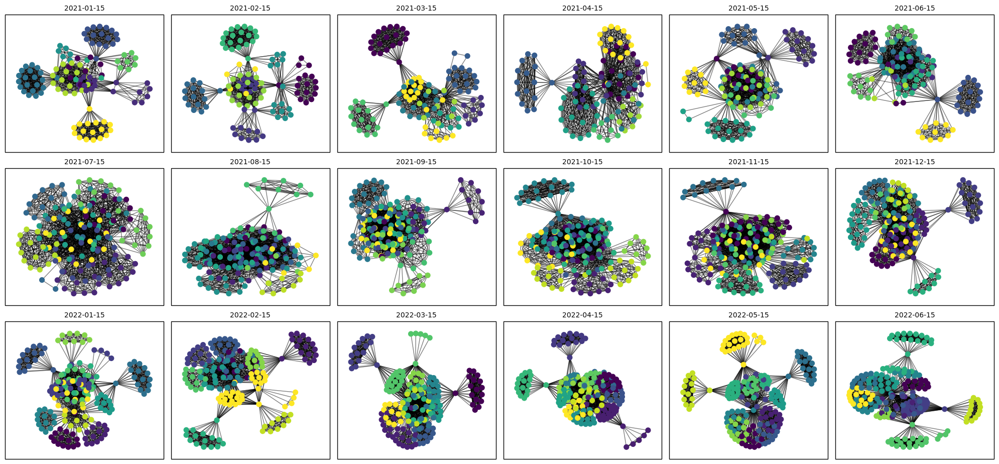

In [12]:
import os
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import community as community_louvain

def visualize_wallet_network_grid(graphs, dates, output_directory, layout=nx.kamada_kawai_layout):
    # Define the grid size
    rows, cols = 3, 6  # Adjust based on the number of graphs
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
    axes = axes.flatten()  # Flatten to iterate easily

    for ax, (snapshot, graph) in zip(axes, graphs.items()):
        # Perform community detection
        partition = community_louvain.best_partition(graph)

        # Compute layout
        pos = layout(graph)

        # Draw the graph with communities as detected
        nx.draw_networkx_nodes(graph, pos, node_size=50, cmap=plt.get_cmap('viridis'),
                               node_color=list(partition.values()), ax=ax)
        nx.draw_networkx_edges(graph, pos, alpha=0.5, ax=ax)
        ax.set_title(dates[snapshot], fontsize=10)
        ax.set_axis_off()  # Hide axis for clarity

        # Draw a rectangle around the plot area
        rect = patches.Rectangle((0, 0), 1, 1, linewidth=1, edgecolor='black', facecolor='none', transform=ax.transAxes, clip_on=False)
        ax.add_patch(rect)

    # Turn off any unused subplots
    for i in range(len(graphs), len(axes)):
        axes[i].set_axis_off()

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Adjust the top spacing to accommodate title if necessary
    plt.savefig(os.path.join(output_directory, 'wallet_network_grid.png'))
    plt.show()

# Visualize the wallet network grid
visualize_wallet_network_grid(graphs, dates, output_directory)




In [13]:
import networkx as nx
import pandas as pd

def calculate_graph_statistics(graphs_dict):
    data = {
        'Snapshot': [],
        'Nodes': [],
        'Edges': [],
        'Density': [],
        'AvgDegree': [],
        'NumComponents': [],
        'SizeLargestComponent': [],
        'AvgClusteringCoeff': [],

    }

    for snapshot, G in graphs_dict.items():
        num_nodes = len(G.nodes())
        num_edges = len(G.edges())
        density = nx.density(G)
        avg_degree = sum(dict(G.degree()).values()) / num_nodes if num_nodes > 0 else 0
        num_components = nx.number_connected_components(G)
        largest_component = max(nx.connected_components(G), key=len)
        size_largest_component = len(largest_component)
        avg_clustering = nx.average_clustering(G)
        
        
        data['Snapshot'].append(snapshot)
        data['Nodes'].append(num_nodes)
        data['Edges'].append(num_edges)
        data['Density'].append(density)
        data['AvgDegree'].append(avg_degree)
        data['NumComponents'].append(num_components)
        data['SizeLargestComponent'].append(size_largest_component)
        data['AvgClusteringCoeff'].append(avg_clustering)

    
    return pd.DataFrame(data)

# Example usage
# Assuming `graphs` is a dictionary of NetworkX graphs
graph_stats = calculate_graph_statistics(graphs)

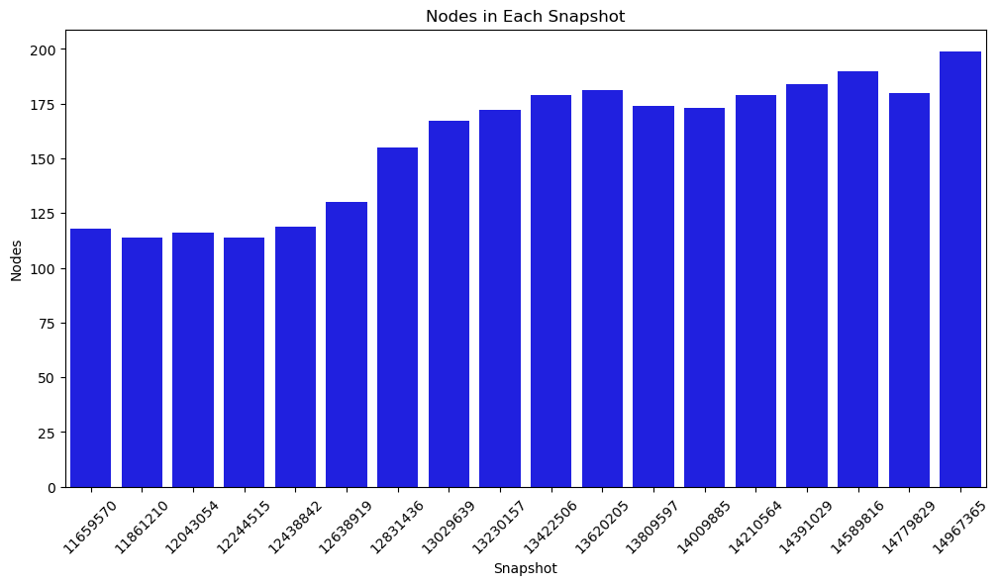

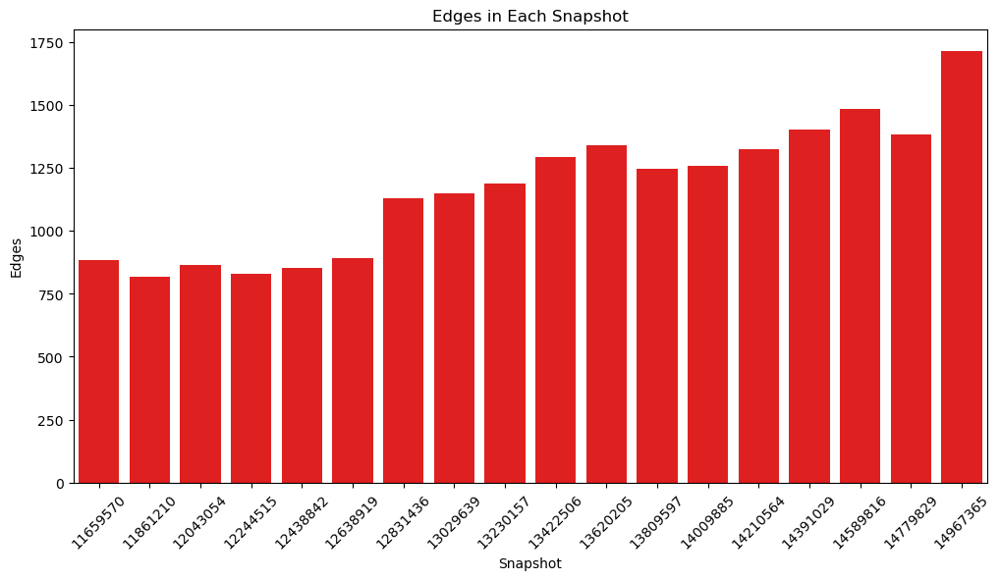

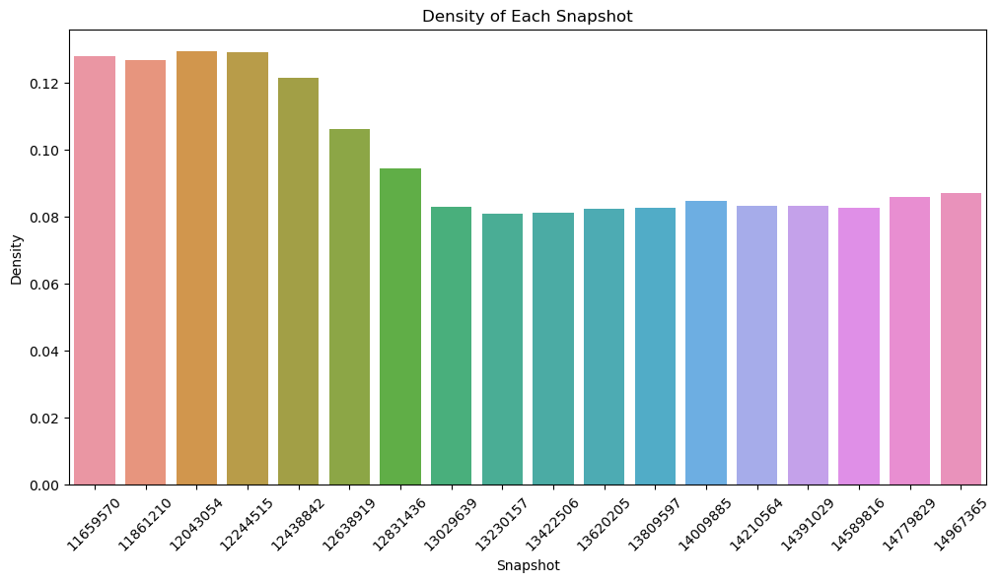

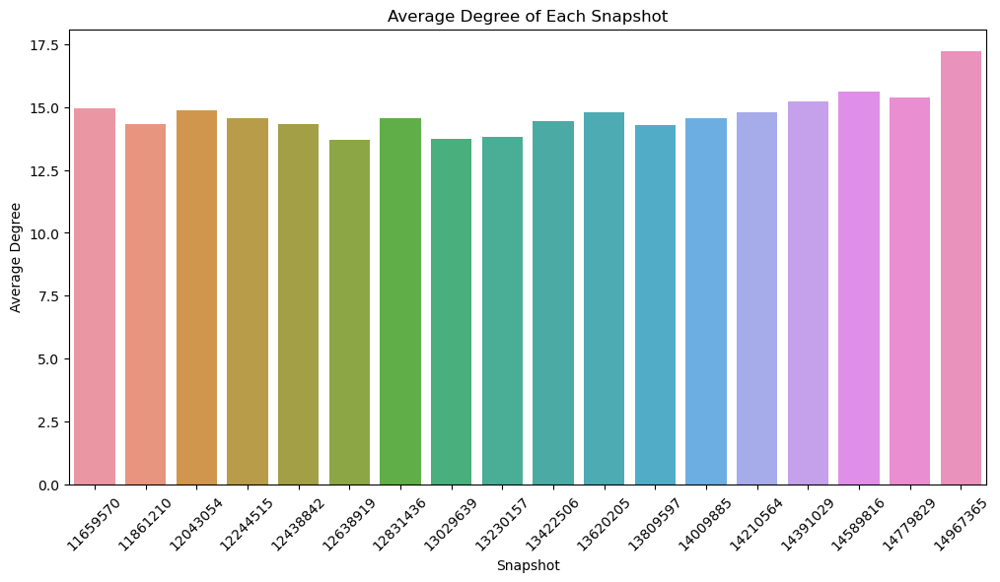

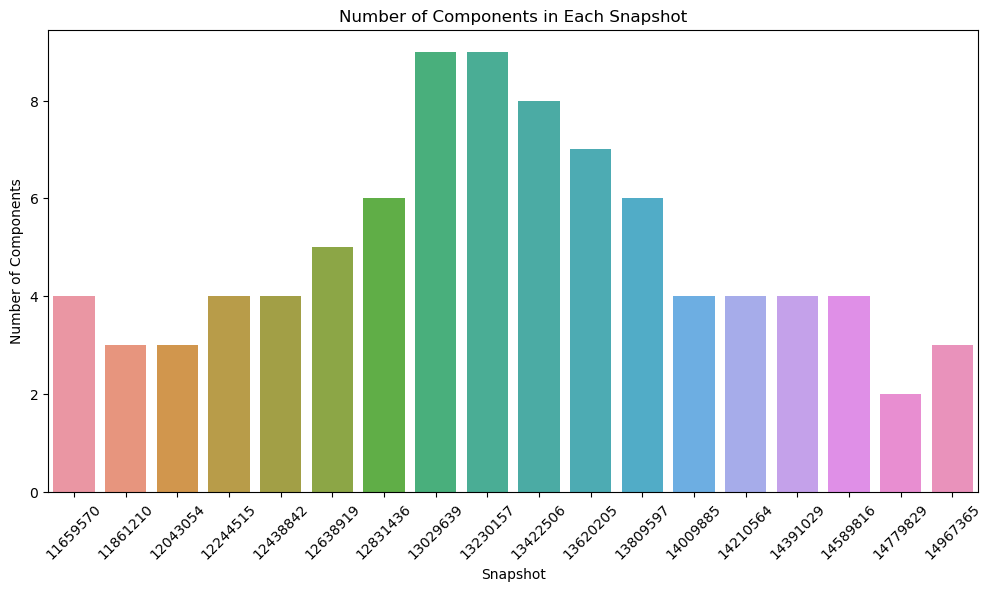

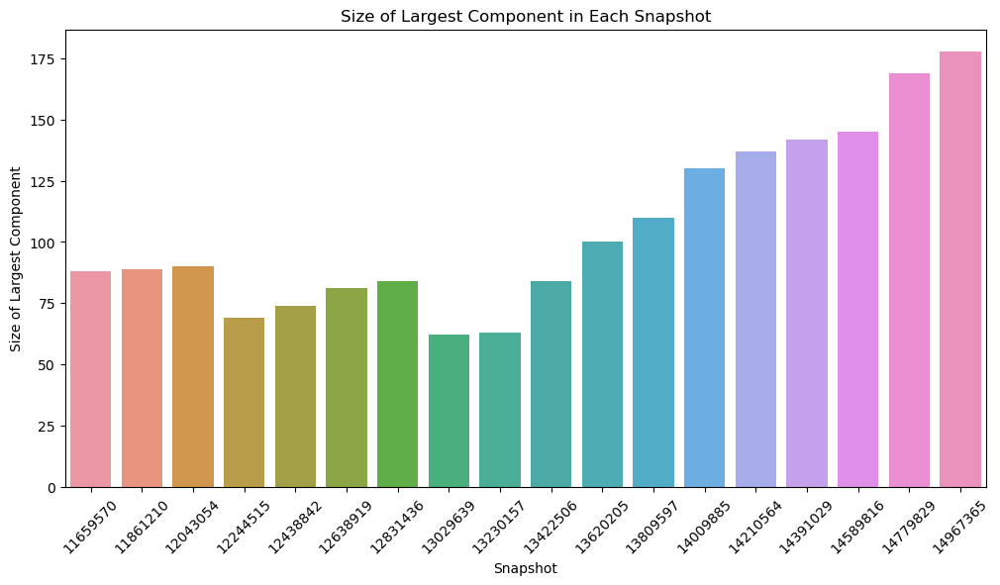

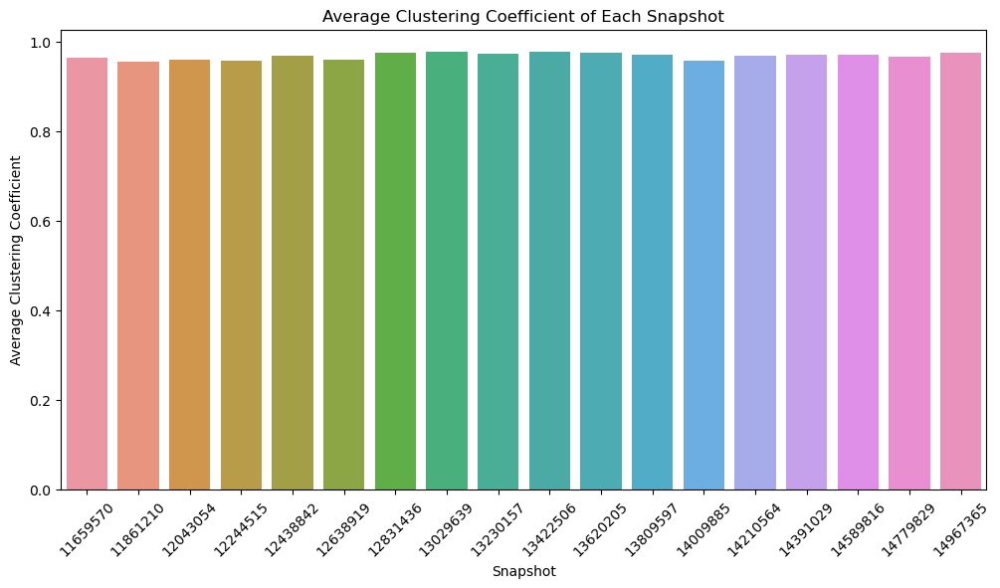

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plotting Nodes
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='Nodes', data=graph_stats, color='b')
plt.title('Nodes in Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Nodes')
plt.xticks(rotation=45)
plt.show()

# Plotting Edges
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='Edges', data=graph_stats, color='r')
plt.title('Edges in Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Edges')
plt.xticks(rotation=45)
plt.show()

# Plotting Density
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='Density', data=graph_stats)
plt.title('Density of Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Density')
plt.xticks(rotation=45)
plt.show()

# Plotting Average Degree
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='AvgDegree', data=graph_stats)
plt.title('Average Degree of Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Average Degree')
plt.xticks(rotation=45)
plt.show()

# Plotting Number of Components
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='NumComponents', data=graph_stats)
plt.title('Number of Components in Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Number of Components')
plt.xticks(rotation=45)
plt.show()

# Plotting Size of Largest Component
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='SizeLargestComponent', data=graph_stats)
plt.title('Size of Largest Component in Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Size of Largest Component')
plt.xticks(rotation=45)
plt.show()

# Plotting Average Clustering Coefficient
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='AvgClusteringCoeff', data=graph_stats)
plt.title('Average Clustering Coefficient of Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Average Clustering Coefficient')
plt.xticks(rotation=45)
plt.show()

In [41]:
# Assuming `graphs` is a dictionary of NetworkX graphs
graph_stats = calculate_graph_statistics(graphs)

# Print the DataFrame to see the numerical data
print(graph_stats)


    Snapshot  Nodes  Edges   Density  AvgDegree  NumComponents  \
0   11659570    118    883  0.127915  14.966102              4   
1   11861210    114    817  0.126844  14.333333              3   
2   12043054    116    864  0.129535  14.896552              3   
3   12244515    114    831  0.129017  14.578947              4   
4   12438842    119    852  0.121350  14.319328              4   
5   12638919    130    890  0.106142  13.692308              5   
6   12831436    155   1128  0.094512  14.554839              6   
7   13029639    167   1148  0.082822  13.748503              9   
8   13230157    172   1189  0.080851  13.825581              9   
9   13422506    179   1294  0.081225  14.458101              8   
10  13620205    181   1341  0.082320  14.817680              7   
11  13809597    174   1245  0.082719  14.310345              6   
12  14009885    173   1259  0.084622  14.554913              4   
13  14210564    179   1326  0.083234  14.815642              4   
14  143910

# The graphs

In [15]:
import os
import networkx as nx
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'

# Load a specific snapshot for comparison
snapshot = '11659570'  # Example snapshot number
normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

# Load graphs
normal_graph = nx.read_graphml(normal_graph_file)
enriched_graph = nx.read_graphml(enriched_graph_file)

# Get nodes from both graphs
normal_nodes = set(normal_graph.nodes())
enriched_nodes = set(enriched_graph.nodes())

# Compare nodes
matched_nodes = normal_nodes & enriched_nodes
unmatched_nodes = normal_nodes - enriched_nodes

print(f"Total nodes in normal graph: {len(normal_nodes)}")
print(f"Total nodes in enriched graph: {len(enriched_nodes)}")
print(f"Matched nodes: {len(matched_nodes)}")
print(f"Unmatched nodes: {len(unmatched_nodes)}")

# Output some examples of unmatched nodes if any
if unmatched_nodes:
    print("Examples of unmatched nodes:", list(unmatched_nodes)[:10])


Total nodes in normal graph: 118
Total nodes in enriched graph: 118
Matched nodes: 118
Unmatched nodes: 0


In [16]:
import os
import networkx as nx
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Load token information
token_info = pd.read_csv(token_info_path)
token_info['address'] = token_info['address'].str.lower()
token_map = token_info.set_index('address')['name'].to_dict()

# Load a specific snapshot for comparison
snapshot = '11659570'  # Example snapshot number
normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

# Load graphs
normal_graph = nx.read_graphml(normal_graph_file)
enriched_graph = nx.read_graphml(enriched_graph_file)

# Extract token addresses from the enriched graph and map to token names
for node in normal_graph.nodes():
    if 'token_address' in enriched_graph.nodes[node]:
        token_address = enriched_graph.nodes[node]['token_address'].lower()
        token_name = token_map.get(token_address, 'Unknown Token')
        normal_graph.nodes[node]['token_name'] = token_name
    else:
        normal_graph.nodes[node]['token_name'] = 'Unknown Token'

# Verify the token names in the normal graph
token_names = nx.get_node_attributes(normal_graph, 'token_name')
print("Token names associated with nodes:")
for node, token_name in token_names.items():
    print(f"Node: {node}, Token: {token_name}")

# Optionally, save the graph with token names for further analysis
output_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_with_tokens_{snapshot}.graphml')
nx.write_graphml(normal_graph, output_graph_file)


Token names associated with nodes:
Node: 0x22400f33726f0c62ecbac8ee0ba47c117ce5d429, Token: Balancer
Node: 0x9dde0b1d39d0d2c6589cde1bfed3542d2a3c5b11, Token: Balancer
Node: 0x2fdbadf3c4d5a8666bc06645b8358ab803996e28, Token: Yearn Finance
Node: 0xbe0eb53f46cd790cd13851d5eff43d12404d33e8, Token: Curve
Node: 0x0248374df0bf742386a278430cdf2cf8a95d6dd9, Token: Maker
Node: 0xd6868b23905009d859cc232f7c008c13bc527702, Token: Maker
Node: 0x25f2226b597e8f9514b3f68f00f494cf4f286491, Token: Aave
Node: 0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3, Token: Maker
Node: 0xf977814e90da44bfa03b6295a0616a897441acec, Token: Yearn Finance
Node: 0x0a3f6849f78076aefadf113f5bed87720274ddc0, Token: Maker
Node: 0x26732399f47e00739d2b4b0451acc3f93f7e3a14, Token: Maker
Node: 0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10, Token: Maker
Node: 0x0ef1b8a0e726fc3948e15b23993015eb1627f210, Token: 1Inch
Node: 0x5e89f8d81c74e311458277ea1be3d3247c7cd7d1, Token: 1Inch
Node: 0xca8d6f69d8f32516a109df68b623452cc9f5e64d, Token: Maker

In [17]:
import os
import networkx as nx
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'

# Load a specific snapshot for comparison
snapshot = '14210564'  # Example snapshot number
normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

# Load graphs
normal_graph = nx.read_graphml(normal_graph_file)
enriched_graph = nx.read_graphml(enriched_graph_file)

# Normalize node identifiers (addresses) to lowercase
normal_nodes = {node.lower() for node in normal_graph.nodes()}
enriched_nodes = {node.lower() for node in enriched_graph.nodes()}

# Compare nodes
matched_nodes = normal_nodes & enriched_nodes
unmatched_nodes = normal_nodes - enriched_nodes

print(f"Total nodes in normal graph: {len(normal_nodes)}")
print(f"Total nodes in enriched graph: {len(enriched_nodes)}")
print(f"Matched nodes: {len(matched_nodes)}")
print(f"Unmatched nodes: {len(unmatched_nodes)}")

# If unmatched, output some examples
if unmatched_nodes:
    print("Examples of unmatched nodes:", list(unmatched_nodes)[:10])

# Let's try matching nodes and retrieving token information
token_info = {}
for node in normal_graph.nodes():
    normalized_node = node.lower()
    if normalized_node in enriched_graph:
        token_info[node] = enriched_graph.nodes[normalized_node].get('token_name', 'Unknown Token')
    else:
        token_info[node] = 'Unknown Token'

# Print a sample of the results
for node, token in list(token_info.items())[:10]:
    print(f"Node: {node}, Token: {token}")



Total nodes in normal graph: 179
Total nodes in enriched graph: 179
Matched nodes: 179
Unmatched nodes: 0
Node: 0x000be27f560fef0253cac4da8411611184356549, Token: Unknown Token
Node: 0x0a3f6849f78076aefadf113f5bed87720274ddc0, Token: Unknown Token
Node: 0x69076e44a9c70a67d5b79d95795aba299083c275, Token: Unknown Token
Node: 0x07f7fe30eaeac132fa0f4223e84568e422da91cf, Token: Unknown Token
Node: 0xc1cd3d0913f4633b43fcddbcd7342bc9b71c676f, Token: Unknown Token
Node: 0x08a90fe0741b7def03fb290cc7b273f1855767d8, Token: Unknown Token
Node: 0xd7ec2398980102d2e1994263777333491536ccee, Token: Unknown Token
Node: 0x0ac6ff4dbde9ceedc6d4c08b14ced9ff19a013ab, Token: Unknown Token
Node: 0x4942b20750163675ddf004476ffe46626652dfd0, Token: Unknown Token
Node: 0x090d4613473dee047c3f2706764f49e0821d256e, Token: Unknown Token


In [18]:
import os
import networkx as nx
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'

# Load a specific snapshot for comparison
snapshot = '14589816'  # Example snapshot number
normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

# Load graphs
normal_graph = nx.read_graphml(normal_graph_file)
enriched_graph = nx.read_graphml(enriched_graph_file)

# Normalize node identifiers (addresses) to lowercase
normal_nodes = {node.lower() for node in normal_graph.nodes()}
enriched_nodes = {node.lower() for node in enriched_graph.nodes()}

# Print out some node attributes in the enriched graph
print("Sample node attributes from the enriched graph:")
for node in list(enriched_graph.nodes())[:10]:  # Print attributes for the first 10 nodes
    print(f"Node: {node}, Attributes: {enriched_graph.nodes[node]}")

# Compare nodes
matched_nodes = normal_nodes & enriched_nodes
unmatched_nodes = normal_nodes - enriched_nodes

print(f"Total nodes in normal graph: {len(normal_nodes)}")
print(f"Total nodes in enriched graph: {len(enriched_nodes)}")
print(f"Matched nodes: {len(matched_nodes)}")
print(f"Unmatched nodes: {len(unmatched_nodes)}")

# If unmatched, output some examples
if unmatched_nodes:
    print("Examples of unmatched nodes:", list(unmatched_nodes)[:10])

# Let's try matching nodes and retrieving token information
token_info = {}
for node in normal_graph.nodes():
    normalized_node = node.lower()
    if normalized_node in enriched_graph:
        token_info[node] = enriched_graph.nodes[normalized_node].get('token_name', 'Unknown Token')
    else:
        token_info[node] = 'Unknown Token'

# Print a sample of the results
for node, token in list(token_info.items())[:10]:
    print(f"Node: {node}, Token: {token}")


Sample node attributes from the enriched graph:
Node: 0x000be27f560fef0253cac4da8411611184356549, Attributes: {'token_address': '0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2'}
Node: 0x02c2e03c5f241794909d953f5b8fa630856f172c, Attributes: {'token_address': '0x1a4b46696b2bb4794eb3d4c26f1c55f9170fa4c5'}
Node: 0x0437ac6109e8a366a1f4816edf312a36952db856, Attributes: {'token_address': '0x6b3595068778dd592e39a122f4f5a5cf09c90fe2'}
Node: 0x06a77eb094ef4e0ca19729770b6b115b57e188f8, Attributes: {'token_address': '0x111111111117dc0aa78b770fa6a738034120c302'}
Node: 0x07eb0d3f42024b5608a9048c5b51b2903e1320b4, Attributes: {'token_address': '0x111111111117dc0aa78b770fa6a738034120c302'}
Node: 0x07f7fe30eaeac132fa0f4223e84568e422da91cf, Attributes: {'token_address': '0x6f40d4a6237c257fff2db00fa0510deeecd303eb'}
Node: 0x08a90fe0741b7def03fb290cc7b273f1855767d8, Attributes: {'token_address': '0x92d6c1e31e14520e676a687f0a93788b716beff5'}
Node: 0x090d4613473dee047c3f2706764f49e0821d256e, Attributes: {'token_

In [23]:
import os
import networkx as nx
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'  # Path to the uploaded CSV file

# Load the token information CSV
df_tokens = pd.read_csv(token_info_path)
token_map = df_tokens.set_index('address')['name'].to_dict()

# Load a specific snapshot for comparison
snapshot = '14589816'  # Example snapshot number
normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

# Load graphs
normal_graph = nx.read_graphml(normal_graph_file)
enriched_graph = nx.read_graphml(enriched_graph_file)

# Normalize node identifiers (addresses) to lowercase
normal_nodes = {node.lower() for node in normal_graph.nodes()}
enriched_nodes = {node.lower() for node in enriched_graph.nodes()}

# Replace token_address with token_name in the enriched graph
for node in enriched_graph.nodes():
    token_address = enriched_graph.nodes[node].get('token_address', None)
    if token_address:
        enriched_graph.nodes[node]['token_name'] = token_map.get(token_address, 'Unknown Token')

# Compare nodes and retrieve token names
token_info = {}
for node in normal_graph.nodes():
    normalized_node = node.lower()
    if normalized_node in enriched_graph:
        token_info[node] = enriched_graph.nodes[normalized_node].get('token_name', 'Unknown Token')
    else:
        token_info[node] = 'Unknown Token'

# Print a sample of the results
for node, token in list(token_info.items())[:10]:
    print(f"Node: {node}, Token: {token}")


Node: 0x1c30bc98984af21b4b8ea6cc1109e2fac3987905, Token: 1Inch
Node: 0x4942b20750163675ddf004476ffe46626652dfd0, Token: 1Inch
Node: 0x5165d24277cd063f5ac44efd447b27025e888f37, Token: Yearn Finance
Node: 0x675938d86a6a4651b6dbba7529117fb0b557ccf2, Token: Yearn Finance
Node: 0x3329fbcda16f15c4ed1d6847bf18e9d045ee941f, Token: Bitdao
Node: 0xe1ab8c08294f8ee707d4efa458eab8bbeeb09215, Token: Bitdao
Node: 0x4314db4f60c9fe246c9a241b9748f5cf16c68045, Token: 1Inch
Node: 0x34a4c5d747f54d5e3a3f66eb6ef3f697f474fd90, Token: Yearn Finance
Node: 0xee5b5b923ffce93a870b3104b7ca09c3db80047a, Token: Bitdao
Node: 0x47ac0fb4f2d84898e4d9e7b4dab3c24507a6d503, Token: Aave


In [24]:
import pandas as pd

# Load the token information CSV
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
df_tokens = pd.read_csv(token_info_path)
token_map = df_tokens.set_index('address')['name'].to_dict()

# Verify the token map
print("Token Map Sample:")
for token_address, token_name in list(token_map.items())[:10]:
    print(f"Token Address: {token_address}, Token Name: {token_name}")

# Count known tokens in the enriched graph
known_tokens_count = sum(1 for node in enriched_graph.nodes() if enriched_graph.nodes[node].get('token_name') != 'Unknown Token')
unknown_tokens_count = sum(1 for node in enriched_graph.nodes() if enriched_graph.nodes[node].get('token_name') == 'Unknown Token')

print(f"Known tokens in enriched graph: {known_tokens_count}")
print(f"Unknown tokens in enriched graph: {unknown_tokens_count}")

# Manually verify a few nodes
sample_nodes = list(normal_graph.nodes())[:5]  # Change to specific nodes if needed
print("Manual Verification of Token Names:")
for node in sample_nodes:
    normalized_node = node.lower()
    if normalized_node in enriched_graph:
        token_name = enriched_graph.nodes[normalized_node].get('token_name', 'Unknown Token')
        token_address = enriched_graph.nodes[normalized_node].get('token_address', 'Unknown Address')
        print(f"Node: {node}, Token Address: {token_address}, Token Name: {token_name}")

# Cross-reference between the two graphs for a specific node
specific_node = '0x000860d59c35f02dbbafb651cc1d8d66d8f3b5e8'  # Replace with a node you want to check
if specific_node in normal_graph and specific_node in enriched_graph:
    normal_token_name = token_info.get(specific_node, 'Unknown Token')
    enriched_token_name = enriched_graph.nodes[specific_node].get('token_name', 'Unknown Token')
    print(f"Cross-Reference for Node: {specific_node}")
    print(f"Normal Graph Token: {normal_token_name}")
    print(f"Enriched Graph Token: {enriched_token_name}")


Token Map Sample:
Token Address: 0x1f9840a85d5af5bf1d1762f925bdaddc4201f984, Token Name: Uniswap
Token Address: 0x7fc66500c84a76ad7e9c93437bfc5ac33e2ddae9, Token Name: Aave
Token Address: 0x5a98fcbea516cf06857215779fd812ca3bef1b32, Token Name: Lido
Token Address: 0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2, Token Name: Maker
Token Address: 0xd533a949740bb3306d119cc777fa900ba034cd52, Token Name: Curve
Token Address: 0x111111111117dc0aa78b770fa6a738034120c302, Token Name: 1Inch
Token Address: 0x1a4b46696b2bb4794eb3d4c26f1c55f9170fa4c5, Token Name: Bitdao
Token Address: 0x4e3fbd56cd56c3e72c1403e103b45db9da5b9d2b, Token Name: Convex
Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Token Address: 0x92d6c1e31e14520e676a687f0a93788b716beff5, Token Name: Dydx
Known tokens in enriched graph: 190
Unknown tokens in enriched graph: 0
Manual Verification of Token Names:
Node: 0x1c30bc98984af21b4b8ea6cc1109e2fac3987905, Token Address: 0x111111111117dc0aa78b770fa6a738034

In [21]:
import os
import networkx as nx
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Load the token information CSV
df_tokens = pd.read_csv(token_info_path)
token_map = df_tokens.set_index('address')['name'].to_dict()

# Load snapshots
snapshots = sorted([f.split('_')[-1].replace('.graphml', '') for f in os.listdir(normal_graph_path) if f.endswith('.graphml')])

# Process each snapshot
for snapshot in snapshots:
    print(f"\nProcessing snapshot {snapshot}...")

    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    # Load graphs
    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Compare nodes
    matched_nodes = set(normal_graph.nodes()) & set(enriched_graph.nodes())
    unmatched_nodes = set(normal_graph.nodes()) - set(enriched_graph.nodes())

    known_tokens_count = 0
    unknown_tokens_count = 0

    print(f"Total nodes in normal graph: {len(normal_graph.nodes())}")
    print(f"Total nodes in enriched graph: {len(enriched_graph.nodes())}")
    print(f"Matched nodes: {len(matched_nodes)}")
    print(f"Unmatched nodes: {len(unmatched_nodes)}")

    # Check token names for matched nodes
    for node in matched_nodes:
        token_address = enriched_graph.nodes[node].get('token_address', 'Unknown Address')
        token_name = token_map.get(token_address, 'Unknown Token')

        if token_name == 'Unknown Token':
            unknown_tokens_count += 1
        else:
            known_tokens_count += 1

        # Print out a few examples
        if known_tokens_count + unknown_tokens_count <= 10:  # Limit output for readability
            print(f"Node: {node}, Token Address: {token_address}, Token Name: {token_name}")

    print(f"Known tokens in snapshot {snapshot}: {known_tokens_count}")
    print(f"Unknown tokens in snapshot {snapshot}: {unknown_tokens_count}")



Processing snapshot 11659570...
Total nodes in normal graph: 118
Total nodes in enriched graph: 118
Matched nodes: 118
Unmatched nodes: 0
Node: 0x11577a8a5baf1e25b9a2d89f39670f447d75c3cd, Token Address: 0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2, Token Name: Maker
Node: 0x34112c83e77a3234f2ce320b05f758f9b17f93c8, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0x5608169973d639649196a84ee4085a708bcbf397, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0x7587caefc8096f5f40acb83a09df031a018c66ec, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0x0f50d31b3eaefd65236dd3736b863cffa4c63c4e, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0x695c388153bea0fbe3e1c049c149bad3bc917740, Token Address: 0x5a98fcbea516cf06857215779fd812ca3bef1b32, Token Name: Lido
Node: 0xd6868b23905009d859cc232f7c008c13bc527702, Token Address: 0x9f8f72aa9304c8b593d55

Total nodes in normal graph: 167
Total nodes in enriched graph: 167
Matched nodes: 167
Unmatched nodes: 0
Node: 0x11577a8a5baf1e25b9a2d89f39670f447d75c3cd, Token Address: 0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2, Token Name: Maker
Node: 0x7a16ff8270133f063aab6c9977183d9e72835428, Token Address: 0xd533a949740bb3306d119cc777fa900ba034cd52, Token Name: Curve
Node: 0x28849d2b63fa8d361e5fc15cb8abb13019884d09, Token Address: 0x6f40d4a6237c257fff2db00fa0510deeecd303eb, Token Name: Instadapp
Node: 0x34112c83e77a3234f2ce320b05f758f9b17f93c8, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0x5608169973d639649196a84ee4085a708bcbf397, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0x9f3c7bce4af4ca2d60b7c4d44df12fc7e64d10de, Token Address: 0x111111111117dc0aa78b770fa6a738034120c302, Token Name: 1Inch
Node: 0x7587caefc8096f5f40acb83a09df031a018c66ec, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: C

Total nodes in normal graph: 174
Total nodes in enriched graph: 174
Matched nodes: 174
Unmatched nodes: 0
Node: 0x11577a8a5baf1e25b9a2d89f39670f447d75c3cd, Token Address: 0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2, Token Name: Maker
Node: 0x7a16ff8270133f063aab6c9977183d9e72835428, Token Address: 0xd533a949740bb3306d119cc777fa900ba034cd52, Token Name: Curve
Node: 0x28849d2b63fa8d361e5fc15cb8abb13019884d09, Token Address: 0x6f40d4a6237c257fff2db00fa0510deeecd303eb, Token Name: Instadapp
Node: 0x34112c83e77a3234f2ce320b05f758f9b17f93c8, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0xd9b311d6678edb14ada24829cd9ae09fcc0f0704, Token Address: 0x111111111117dc0aa78b770fa6a738034120c302, Token Name: 1Inch
Node: 0x5608169973d639649196a84ee4085a708bcbf397, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0x0ac6ff4dbde9ceedc6d4c08b14ced9ff19a013ab, Token Address: 0x111111111117dc0aa78b770fa6a738034120c302, Token Name: 1

Total nodes in normal graph: 184
Total nodes in enriched graph: 184
Matched nodes: 184
Unmatched nodes: 0
Node: 0x11577a8a5baf1e25b9a2d89f39670f447d75c3cd, Token Address: 0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2, Token Name: Maker
Node: 0xc564ee9f21ed8a2d8e7e76c085740d5e4c5fafbe, Token Address: 0x0bc529c00c6401aef6d220be8c6ea1667f6ad93e, Token Name: Yearn Finance
Node: 0x7a16ff8270133f063aab6c9977183d9e72835428, Token Address: 0xd533a949740bb3306d119cc777fa900ba034cd52, Token Name: Curve
Node: 0x28849d2b63fa8d361e5fc15cb8abb13019884d09, Token Address: 0x6f40d4a6237c257fff2db00fa0510deeecd303eb, Token Name: Instadapp
Node: 0xd9b311d6678edb14ada24829cd9ae09fcc0f0704, Token Address: 0x111111111117dc0aa78b770fa6a738034120c302, Token Name: 1Inch
Node: 0x5608169973d639649196a84ee4085a708bcbf397, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0x0ac6ff4dbde9ceedc6d4c08b14ced9ff19a013ab, Token Address: 0x111111111117dc0aa78b770fa6a738034120c302, Token Na

In [6]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def generate_token_statistics(normal_graph_path, enriched_graph_path, token_info_path, output_directory):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    token_statistics = []

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_path)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_file = join(normal_graph_path, filename)
            enriched_graph_file = join(enriched_graph_path, filename)  # Use the same filename for enriched graphs

            if not os.path.exists(enriched_graph_file):
                print(f"Enriched graph file not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection on the normal graph
            partition = community_louvain.best_partition(G)
            nx.set_node_attributes(G, partition, 'community')

            # Compile token statistics per community using enriched graph for labeling
            community_stats = defaultdict(lambda: defaultdict(int))
            for node, data in G.nodes(data=True):
                community = data['community']
                if node in enriched_G.nodes():
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                    community_stats[community][token_name] += 1

            # Format data for this graph into a list of dictionaries
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for community, tokens in community_stats.items():
                for token_name, count in tokens.items():
                    token_statistics.append({
                        'Snapshot': snapshot_time,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

    # Convert to DataFrame for better display and analysis
    token_stats_df = pd.DataFrame(token_statistics)

    # Save the results as a CSV file
    output_file = join(output_directory, 'token_statistics.csv')
    token_stats_df.to_csv(output_file, index=False)
    print(f"Token statistics saved to {output_file}")

    return token_stats_df

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output'

# Generate and save token statistics
token_stats_df = generate_token_statistics(normal_graph_path, enriched_graph_path, token_info_path, output_directory)

# Display the token statistics
print(token_stats_df.head())  # Display the first few rows of the statistics




NameError: name 'community_louvain' is not defined

In [46]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def generate_overall_token_statistics(normal_graph_path, enriched_graph_path, token_info_path, output_directory):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    overall_token_statistics = []

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_path)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_file = join(normal_graph_path, filename)
            enriched_graph_file = join(enriched_graph_path, filename)  # Use the same filename for enriched graphs

            if not os.path.exists(enriched_graph_file):
                print(f"Enriched graph file not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Compile token statistics using enriched graph for labeling
            token_stats = defaultdict(int)
            for node in G.nodes():
                if node in enriched_G.nodes():
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                    token_stats[token_name] += 1

            # Format data for this graph into a list of dictionaries
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for token_name, count in token_stats.items():
                overall_token_statistics.append({
                    'Snapshot': snapshot_time,
                    'Token Name': token_name,
                    'Count': count
                })

    # Convert to DataFrame for better display and analysis
    overall_token_stats_df = pd.DataFrame(overall_token_statistics)

    # Save the results as a CSV file
    output_file = join(output_directory, 'overall_token_statistics.csv')
    overall_token_stats_df.to_csv(output_file, index=False)
    print(f"Overall token statistics saved to {output_file}")

    return overall_token_stats_df

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output'

# Generate and save overall token statistics
overall_token_stats_df = generate_overall_token_statistics(normal_graph_path, enriched_graph_path, token_info_path, output_directory)

# Display the overall token statistics
print(overall_token_stats_df.head())  # Display the first few rows of the statistics


Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11659570.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11861210.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12043054.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12244515.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12438842.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graph

In [47]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def generate_overall_token_statistics(normal_graph_path, enriched_graph_path, token_info_path, output_directory):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    overall_token_statistics = defaultdict(int)

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_path)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_file = join(normal_graph_path, filename)
            enriched_graph_file = join(enriched_graph_path, filename)  # Use the same filename for enriched graphs

            if not os.path.exists(enriched_graph_file):
                print(f"Enriched graph file not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Compile token statistics using enriched graph for labeling
            for node in G.nodes():
                if node in enriched_G.nodes():
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                    overall_token_statistics[token_name] += 1

    # Convert to DataFrame for better display and analysis
    overall_token_stats_df = pd.DataFrame(list(overall_token_statistics.items()), columns=['Token Name', 'Count'])

    # Save the results as a CSV file
    output_file = join(output_directory, 'overall_token_statistics_across_snapshots.csv')
    overall_token_stats_df.to_csv(output_file, index=False)
    print(f"Overall token statistics across all snapshots saved to {output_file}")

    return overall_token_stats_df

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output'

# Generate and save overall token statistics across all snapshots
overall_token_stats_df = generate_overall_token_statistics(normal_graph_path, enriched_graph_path, token_info_path, output_directory)

# Display the overall token statistics
print(overall_token_stats_df.head())  # Display the first few rows of the statistics


Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11659570.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11861210.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12043054.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12244515.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12438842.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graph

In [48]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def generate_overall_token_statistics(normal_graph_path, enriched_graph_path, token_info_path, output_directory):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    overall_token_statistics = defaultdict(int)

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_path)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_file = join(normal_graph_path, filename)
            enriched_graph_file = join(enriched_graph_path, filename)  # Use the same filename for enriched graphs

            if not os.path.exists(enriched_graph_file):
                print(f"Enriched graph file not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Compile token statistics using enriched graph for labeling
            for node in G.nodes():
                if node in enriched_G.nodes():
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                    overall_token_statistics[token_name] += 1

    # Convert to DataFrame for better display and analysis
    overall_token_stats_df = pd.DataFrame(list(overall_token_statistics.items()), columns=['Token Name', 'Count'])

    # Sort the DataFrame by 'Count' in descending order
    overall_token_stats_df = overall_token_stats_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

    # Save the results as a CSV file
    output_file = join(output_directory, 'overall_token_statistics_across_snapshots.csv')
    overall_token_stats_df.to_csv(output_file, index=False)
    print(f"Overall token statistics across all snapshots saved to {output_file}")

    return overall_token_stats_df

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output'

# Generate and save overall token statistics across all snapshots
overall_token_stats_df = generate_overall_token_statistics(normal_graph_path, enriched_graph_path, token_info_path, output_directory)

# Display the overall token statistics
print(overall_token_stats_df.head())  # Display the first few rows of the statistics


Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11659570.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11861210.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12043054.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12244515.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12438842.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graph

In [25]:
import os
import pandas as pd
import networkx as nx
from os.path import join

# Paths
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Load the token information CSV
df_tokens = pd.read_csv(token_info_path)
token_map = df_tokens.set_index('address')['name'].to_dict()

# Function to check token mapping
def check_token_mapping():
    all_token_addresses = set()
    unmatched_token_addresses = set()

    # Process each enriched graph file
    for filename in os.listdir(enriched_graph_path):
        if filename.endswith('.graphml'):
            graph_file = join(enriched_graph_path, filename)
            graph = nx.read_graphml(graph_file)
            
            # Collect all token addresses used in the graph
            for node in graph.nodes():
                token_address = graph.nodes[node].get('token_address', None)
                if token_address:
                    all_token_addresses.add(token_address)
                    # Check if token address is in the token map
                    if token_address not in token_map:
                        unmatched_token_addresses.add(token_address)
    
    # Report findings
    print(f"Total unique token addresses in enriched graphs: {len(all_token_addresses)}")
    print(f"Total unmatched token addresses: {len(unmatched_token_addresses)}")
    
    if unmatched_token_addresses:
        print("\nUnmatched token addresses:")
        for address in unmatched_token_addresses:
            print(address)
    else:
        print("All token addresses are matched correctly.")

# Run the token mapping check
check_token_mapping()



Total unique token addresses in enriched graphs: 15
Total unmatched token addresses: 0
All token addresses are matched correctly.


In [21]:
import os
import networkx as nx
import pandas as pd
from os.path import join

# Paths
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'  # Path to the uploaded CSV

# Load the token mapping
df_tokens = pd.read_csv(token_info_path)
df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
token_map = df_tokens.set_index('address')['name'].to_dict()

# Function to check for unmatched token addresses
def check_unmatched_token_addresses(enriched_graph_path, token_map):
    unmatched_addresses = set()
    
    # Iterate over all enriched graph files in the directory
    for filename in sorted(os.listdir(enriched_graph_path)):
        if filename.endswith('.graphml'):
            graph_path = join(enriched_graph_path, filename)
            G = nx.read_graphml(graph_path)

            # Extract token addresses from the enriched graph
            for node, data in G.nodes(data=True):
                token_address = data.get('token_address', '').lower()
                
                # Check if the token address is in the token map
                if token_address and token_address not in token_map:
                    unmatched_addresses.add(token_address)

    return unmatched_addresses

# Run the check
unmatched_addresses = check_unmatched_token_addresses(enriched_graph_path, token_map)

# Output the results
if unmatched_addresses:
    print(f"Unmatched token addresses found: {len(unmatched_addresses)}")
    print("Examples of unmatched token addresses:", list(unmatched_addresses)[:10])
else:
    print("All token addresses are matched successfully.")



All token addresses are matched successfully.


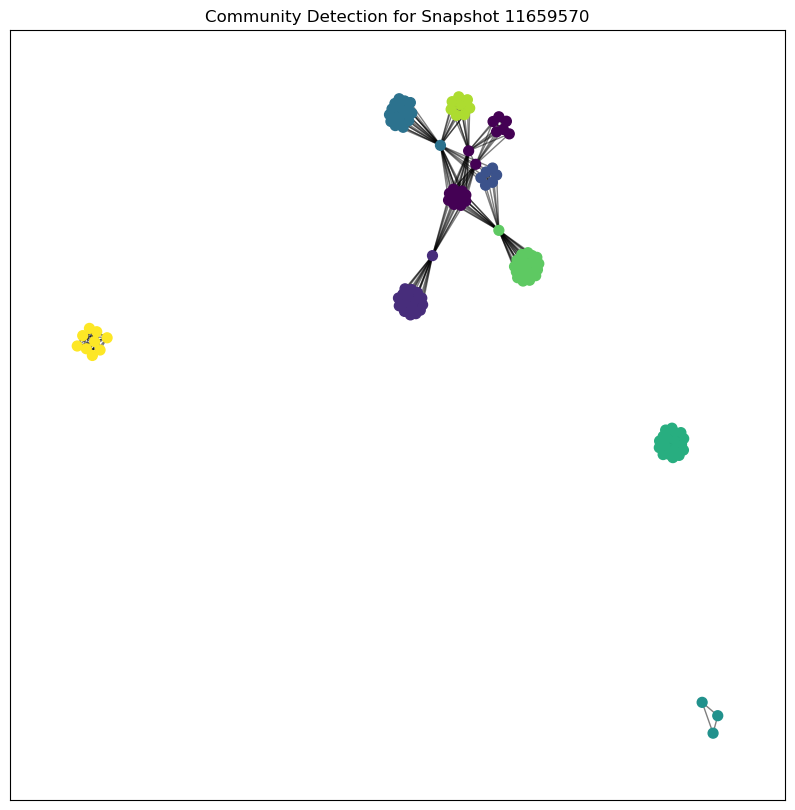

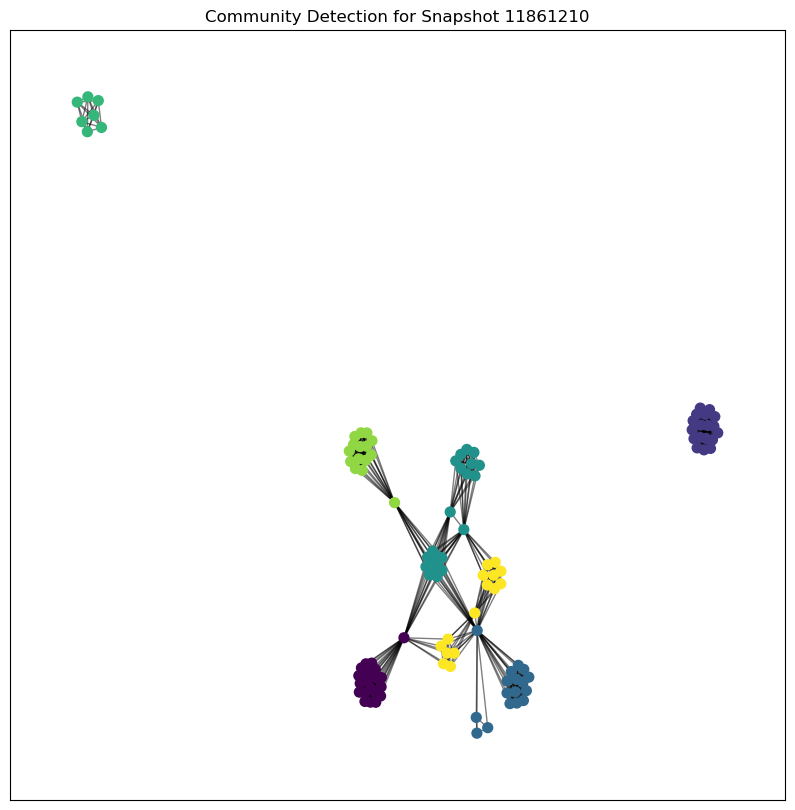

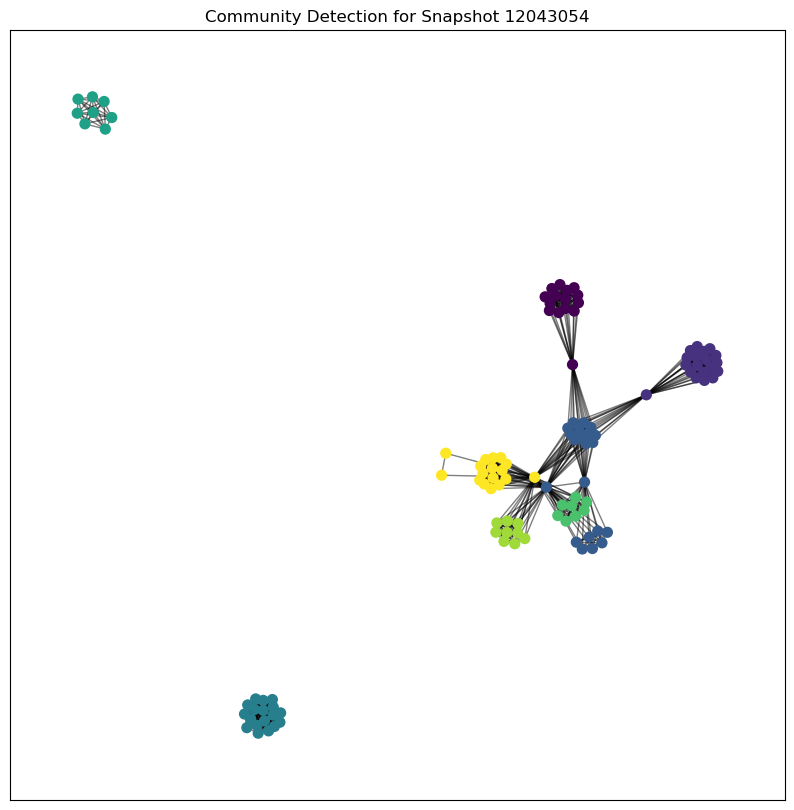

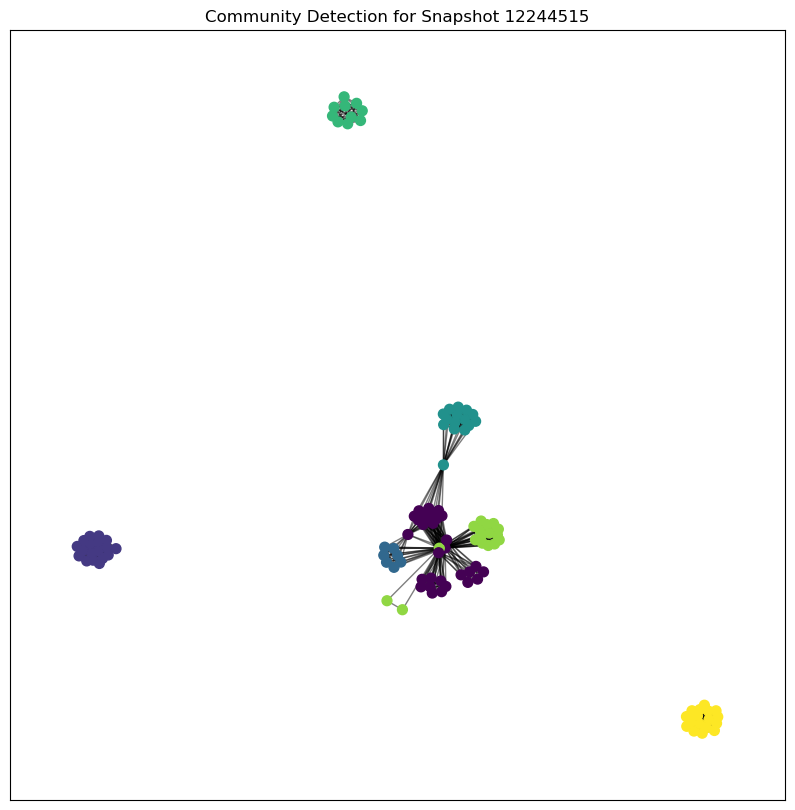

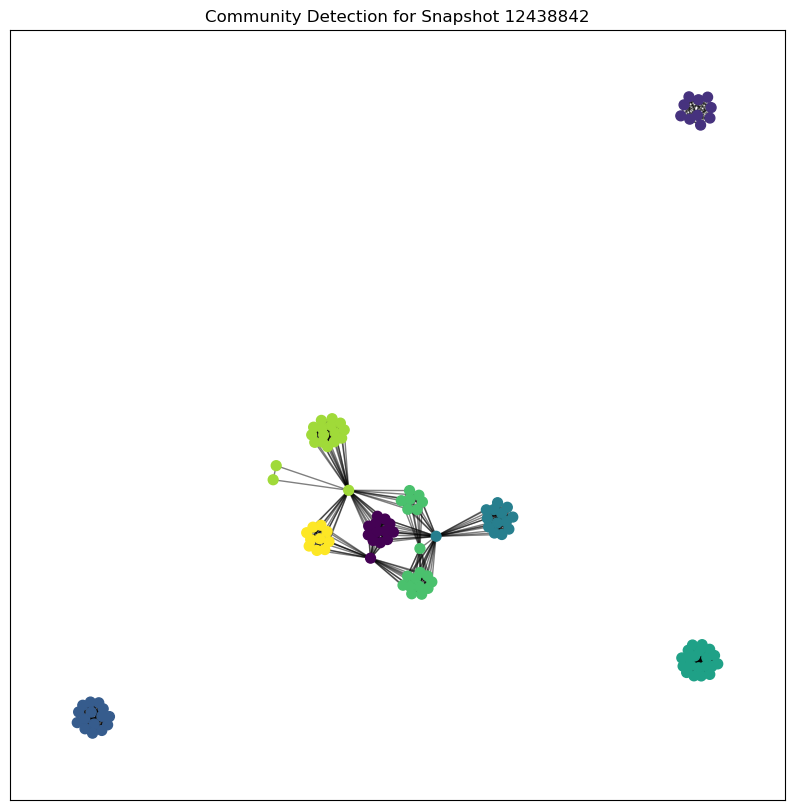

...

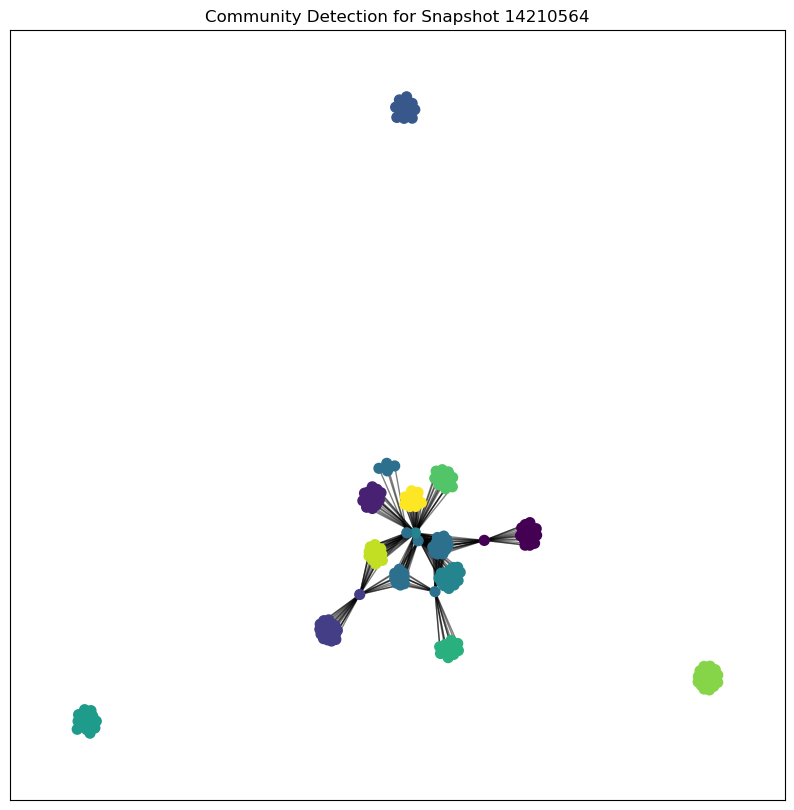

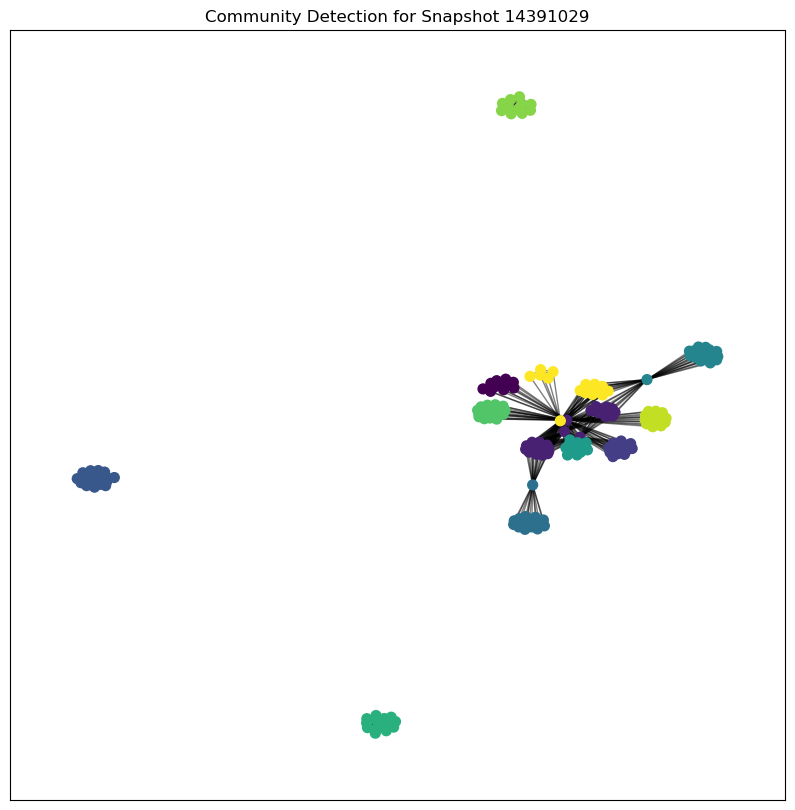

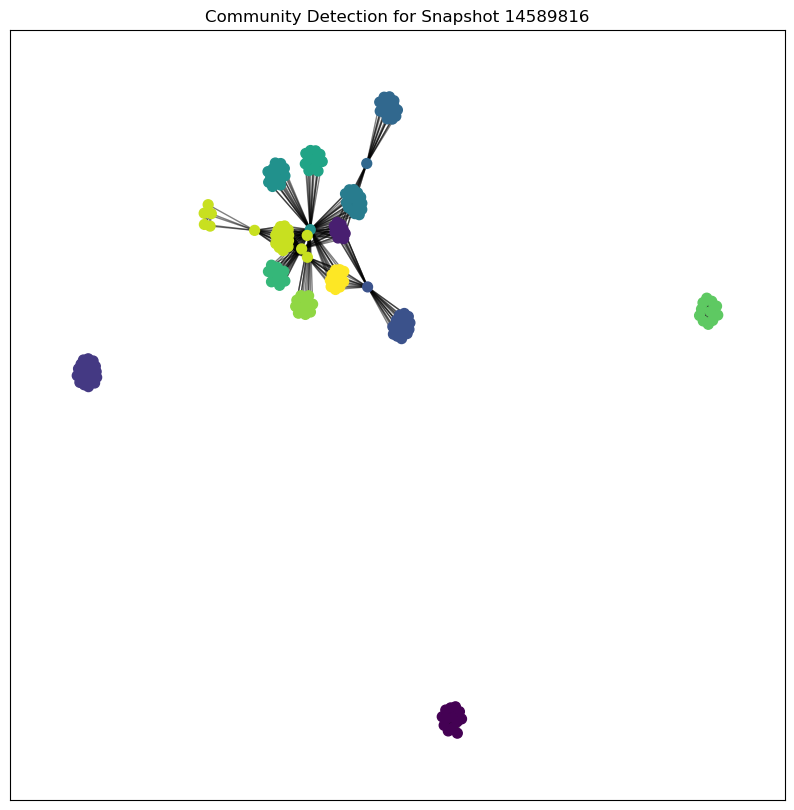

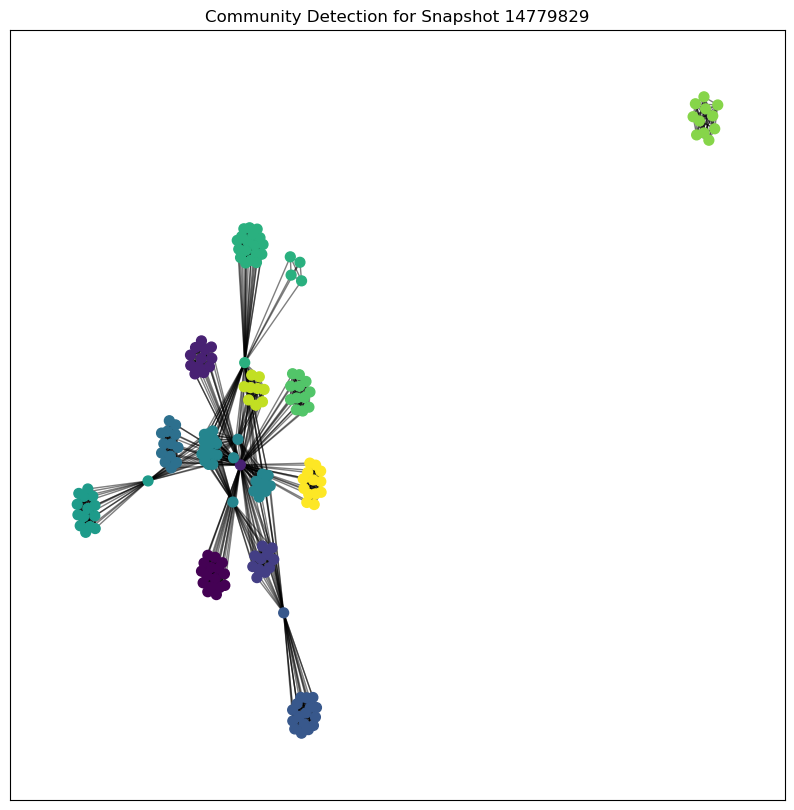

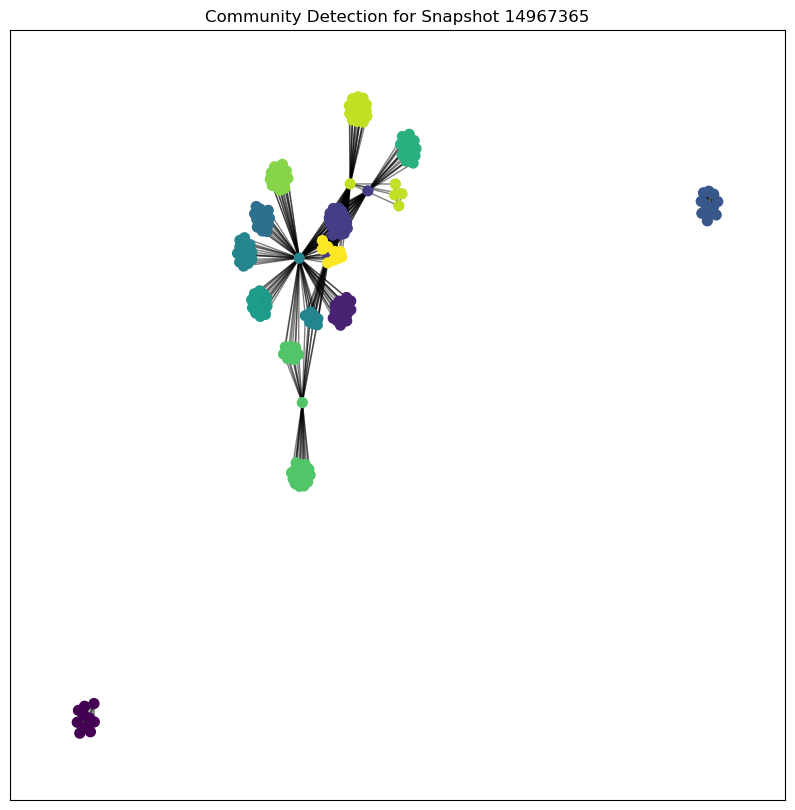

In [30]:
import os
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
from os.path import join

# Step 1: Load the Graph Data
def load_graphs(graph_directory):
    graphs = {}
    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            graphs[snapshot_time] = G
    return graphs

# Step 2: Apply Louvain Method for Community Detection
def detect_communities(graphs):
    communities = {}
    for snapshot_time, G in graphs.items():
        partition = community_louvain.best_partition(G)
        communities[snapshot_time] = partition
        # Set the community as an attribute for each node
        nx.set_node_attributes(G, partition, 'community')
    return communities

# Step 3: Visualize the Communities
def visualize_communities(graphs, communities):
    for snapshot_time, G in graphs.items():
        partition = communities[snapshot_time]
        pos = nx.spring_layout(G)
        plt.figure(figsize=(10, 10))
        cmap = plt.get_cmap('viridis')
        nx.draw_networkx_nodes(G, pos, node_size=50, cmap=cmap, node_color=list(partition.values()))
        nx.draw_networkx_edges(G, pos, alpha=0.5)
        plt.title(f"Community Detection for Snapshot {snapshot_time}")
        plt.show()

# Path setup
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Load the graphs
graphs = load_graphs(graph_directory)

# Detect communities using Louvain method
communities = detect_communities(graphs)

# Visualize the communities
visualize_communities(graphs, communities)


In [22]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_label_tokens(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Label the normal graph with token names using the enriched graph
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            normal_graph.nodes[node]['token_name'] = token_name
            normal_graph.nodes[node]['community'] = partition[node]
        else:
            normal_graph.nodes[node]['token_name'] = 'Unknown Token'
            normal_graph.nodes[node]['community'] = partition[node]

    # Print out the nodes with their community and token names
    node_data = []
    for node, data in normal_graph.nodes(data=True):
        node_data.append({
            'Address': node,
            'Community': data['community'],
            'Token Name': data['token_name']
        })

    node_df = pd.DataFrame(node_data)
    print(f"Snapshot: {snapshot}")
    print(node_df)
    print("\n")

# Example snapshots to process
snapshots = ['11659570', '11861210', '12043054']  # Add more snapshot IDs as needed

for snapshot in snapshots:
    detect_communities_and_label_tokens(snapshot)



Snapshot: 11659570
                                        Address  Community Token Name
0    0x7e88dc82b0a9ee4dc04abf88c7c449804df3f375          0    Uniswap
1    0x9f41cecc435101045ea9f41d4ee8c5353f77e5d5          0    Uniswap
2    0x8b1674a617f103897fb82ec6b8eb749ba0b9765b          1       Lido
3    0x945755de7eac99008c8c57bda96772d50872168b          1       Lido
4    0x91715128a71c9c734cdc20e5edeeea02e72e428e          1       Lido
..                                          ...        ...        ...
113  0x5e89f8d81c74e311458277ea1be3d3247c7cd7d1          3      1Inch
114  0xa0446d8804611944f1b527ecd37d7dcbe442caba          3      1Inch
115  0x41df5d28c7e801c4df0ab33421e2ed6ce52d2567          6      Curve
116  0x25f2226b597e8f9514b3f68f00f494cf4f286491          4       Aave
117  0x0ef1b8a0e726fc3948e15b23993015eb1627f210          3      1Inch

[118 rows x 3 columns]


Snapshot: 11861210
                                        Address  Community     Token Name
0    0x4b4e140d1f131fd

In [23]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_label_tokens(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Label the normal graph with token names using the enriched graph
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            normal_graph.nodes[node]['token_name'] = token_name
            normal_graph.nodes[node]['community'] = partition[node]
        else:
            normal_graph.nodes[node]['token_name'] = 'Unknown Token'
            normal_graph.nodes[node]['community'] = partition[node]

    # Create a DataFrame to hold the community and token information
    node_data = []
    for node, data in normal_graph.nodes(data=True):
        node_data.append({
            'Address': node,
            'Community': data['community'],
            'Token Name': data['token_name']
        })

    node_df = pd.DataFrame(node_data)

    # Associate snapshot date
    snapshot_date = snapshot_dates.get(snapshot, 'Unknown Date')
    print(f"Snapshot: {snapshot} ({snapshot_date})")
    print(node_df)
    print("\n")

# Example snapshots to process
snapshots = list(snapshot_dates.keys())

for snapshot in snapshots:
    detect_communities_and_label_tokens(snapshot)



Snapshot: 11659570 (2021-06)
                                        Address  Community Token Name
0    0x7e88dc82b0a9ee4dc04abf88c7c449804df3f375          0    Uniswap
1    0x9f41cecc435101045ea9f41d4ee8c5353f77e5d5          0    Uniswap
2    0x8b1674a617f103897fb82ec6b8eb749ba0b9765b          1       Lido
3    0x945755de7eac99008c8c57bda96772d50872168b          1       Lido
4    0x91715128a71c9c734cdc20e5edeeea02e72e428e          1       Lido
..                                          ...        ...        ...
113  0x5e89f8d81c74e311458277ea1be3d3247c7cd7d1          2      1Inch
114  0xa0446d8804611944f1b527ecd37d7dcbe442caba          2      1Inch
115  0x41df5d28c7e801c4df0ab33421e2ed6ce52d2567          6      Curve
116  0x25f2226b597e8f9514b3f68f00f494cf4f286491          4       Aave
117  0x0ef1b8a0e726fc3948e15b23993015eb1627f210          2      1Inch

[118 rows x 3 columns]


Snapshot: 11861210 (2021-07)
                                        Address  Community     Token Name
0 

                                        Address  Community     Token Name
0    0x991a91681f80cb890338b89c1a72be719a902d8b          0         Bitdao
1    0xee5b5b923ffce93a870b3104b7ca09c3db80047a          0         Bitdao
2    0x34a4c5d747f54d5e3a3f66eb6ef3f697f474fd90          6  Yearn Finance
3    0xbe0eb53f46cd790cd13851d5eff43d12404d33e8          6          Curve
4    0x11577a8a5baf1e25b9a2d89f39670f447d75c3cd          2          Maker
..                                          ...        ...            ...
174  0xc697051d1c6296c24ae3bcef39aca743861d9a81         11           Aave
175  0x12c61427d694b57434927b51708efdad866a3c45          5           Dydx
176  0x6d19b2bf3a36a61530909ae65445a906d98a2fa8         11       Balancer
177  0x05767d9ef41dc40689678ffca0608878fb3de906         10         Convex
178  0x0248374df0bf742386a278430cdf2cf8a95d6dd9          2          Maker

[179 rows x 3 columns]


Snapshot: 13620205 (2022-04)
                                        Address  Communit

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_1034/349913063.py:98: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=combined_distribution_df, x='Community', y='Count', hue='Token Name', ci=None)


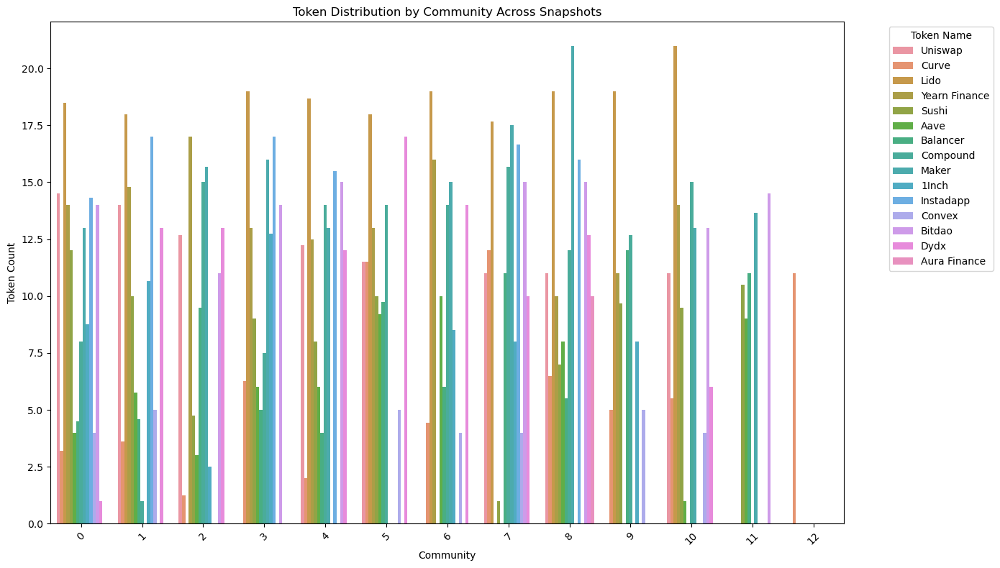

In [24]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_analyze_token_distribution(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Initialize data structures to hold token distribution information
    community_token_counts = defaultdict(lambda: defaultdict(int))

    # Label the normal graph with token names using the enriched graph and calculate token distribution
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            normal_graph.nodes[node]['token_name'] = token_name
            normal_graph.nodes[node]['community'] = partition[node]
            # Increment token count for the community
            community_token_counts[partition[node]][token_name] += 1

    # Convert to DataFrame for better visualization
    distribution_data = []
    for community, tokens in community_token_counts.items():
        for token_name, count in tokens.items():
            distribution_data.append({
                'Community': community,
                'Token Name': token_name,
                'Count': count
            })
    distribution_df = pd.DataFrame(distribution_data)

    # Associate snapshot date
    snapshot_date = snapshot_dates.get(snapshot, 'Unknown Date')
    distribution_df['Snapshot'] = snapshot_date

    return distribution_df

# Process each snapshot and combine the results
all_distributions = []

for snapshot in snapshot_dates.keys():
    distribution_df = detect_communities_and_analyze_token_distribution(snapshot)
    all_distributions.append(distribution_df)

# Combine all distributions into a single DataFrame
combined_distribution_df = pd.concat(all_distributions, ignore_index=True)

# Visualize the distribution of tokens by community over time
plt.figure(figsize=(14, 8))
sns.barplot(data=combined_distribution_df, x='Community', y='Count', hue='Token Name', ci=None)
plt.title('Token Distribution by Community Across Snapshots')
plt.xlabel('Community')
plt.ylabel('Token Count')
plt.legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Optional: Save the combined distribution data to a CSV file for further analysis
combined_distribution_df.to_csv('community_token_distribution.csv', index=False)


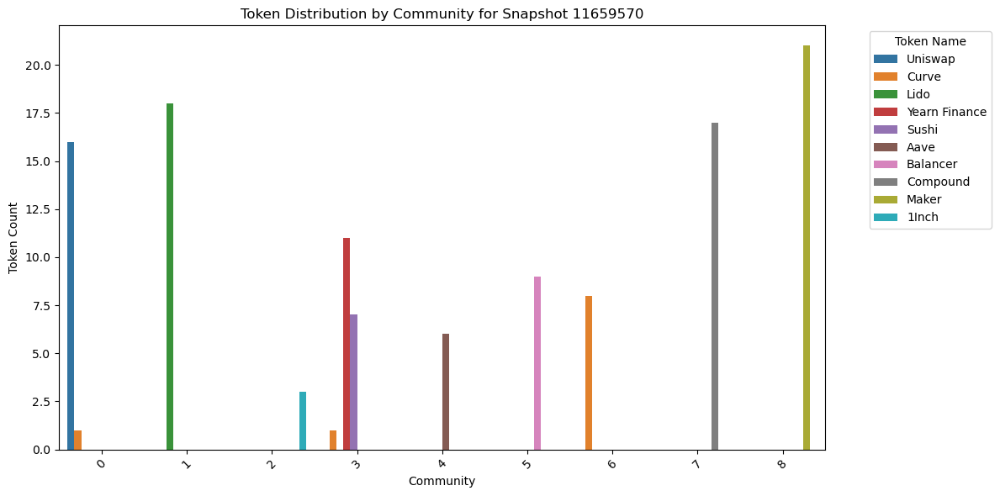

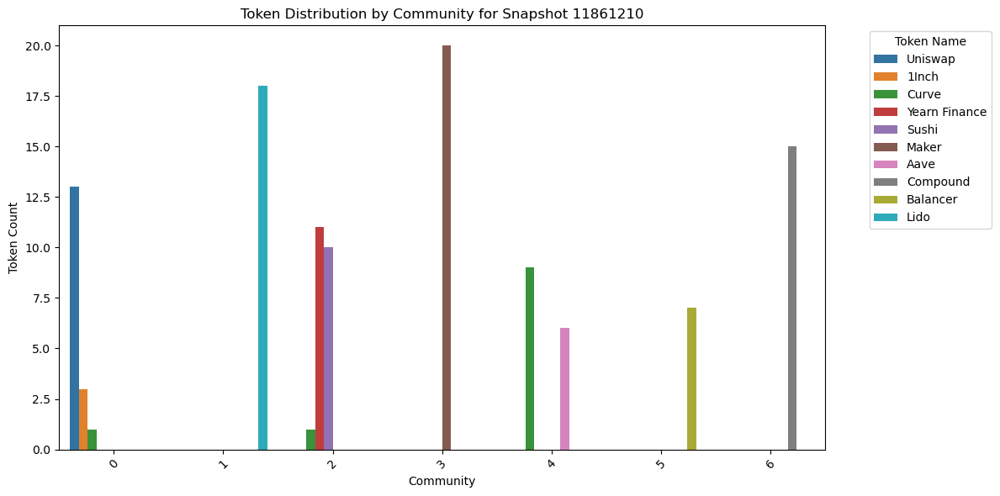

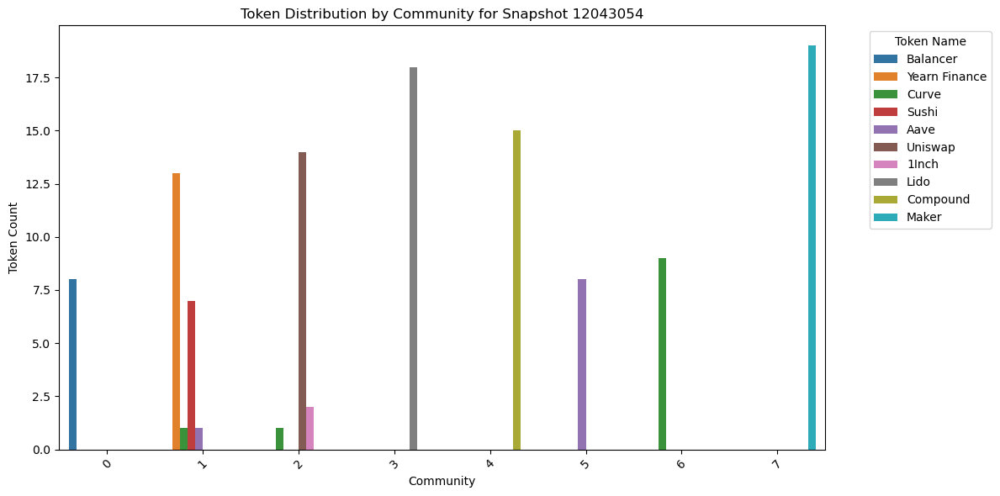

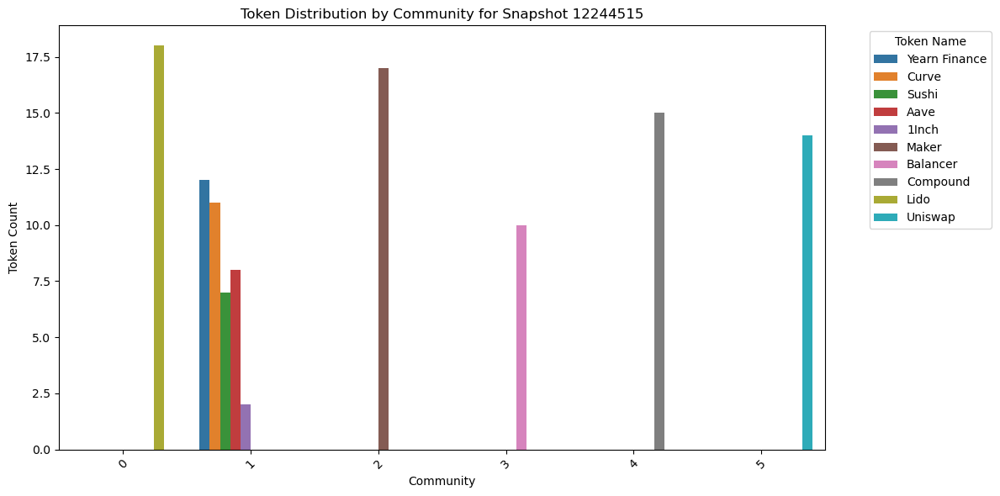

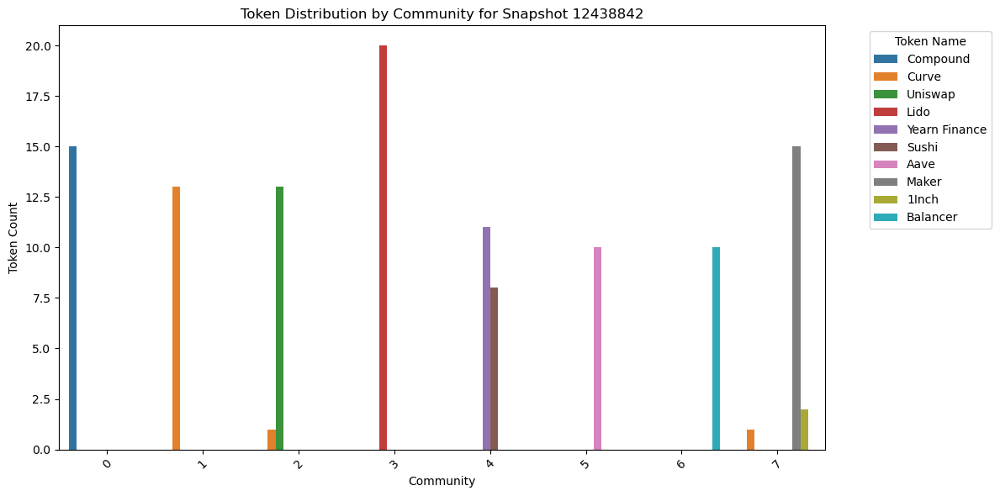

...

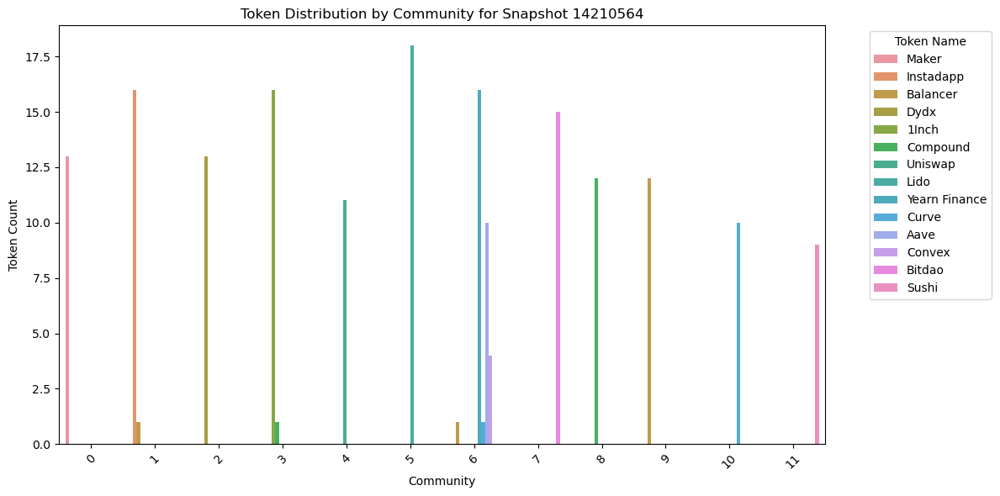

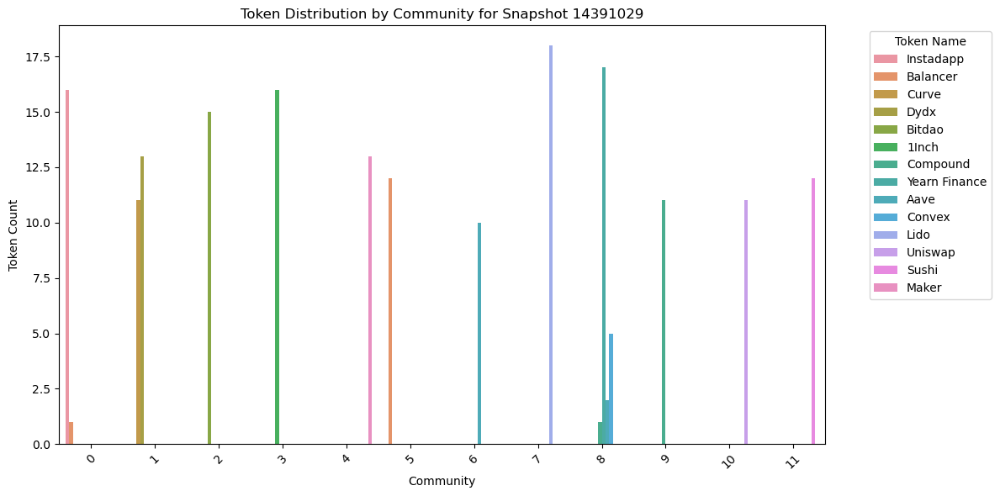

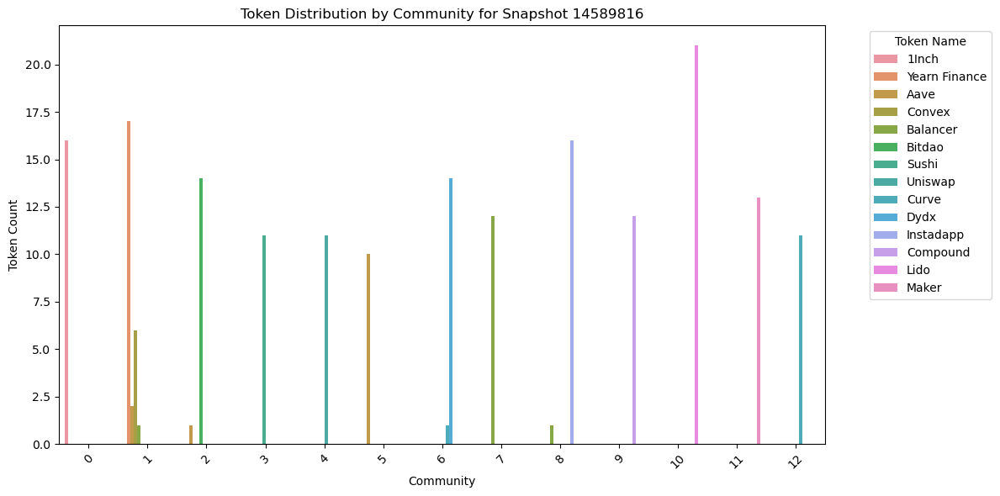

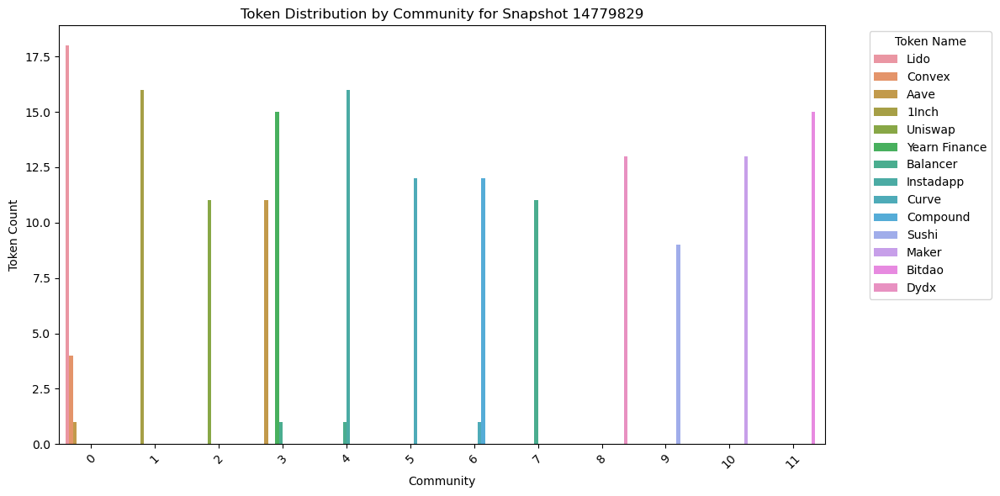

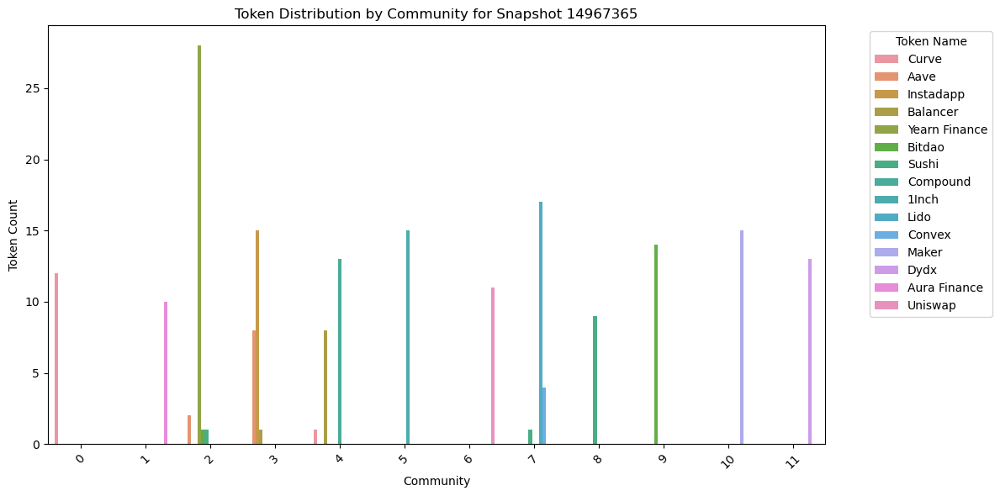

In [26]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_label_tokens(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Label the normal graph with token names using the enriched graph
    community_token_distribution = defaultdict(lambda: defaultdict(int))
    
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            community = partition[node]
            community_token_distribution[community][token_name] += 1

    return community_token_distribution

def plot_token_distribution(snapshot, community_token_distribution):
    # Convert to DataFrame for easier plotting
    plot_data = []
    for community, tokens in community_token_distribution.items():
        for token_name, count in tokens.items():
            plot_data.append({
                'Community': community,
                'Token Name': token_name,
                'Count': count
            })

    df = pd.DataFrame(plot_data)
    
    # Create bar plot
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Community', y='Count', hue='Token Name', data=df)
    plt.title(f'Token Distribution by Community for Snapshot {snapshot}')
    plt.xlabel('Community')
    plt.ylabel('Token Count')
    plt.xticks(rotation=45)
    plt.legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Example snapshots to process
snapshots = list(snapshot_dates.keys())

for snapshot in snapshots:
    community_token_distribution = detect_communities_and_label_tokens(snapshot)
    plot_token_distribution(snapshot, community_token_distribution)


In [27]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
from os.path import join
from collections import defaultdict

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_label_tokens(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Label the normal graph with token names using the enriched graph
    community_token_distribution = defaultdict(lambda: defaultdict(int))
    
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            community = partition[node]
            community_token_distribution[community][token_name] += 1

    return community_token_distribution

def create_token_distribution_table(snapshot, community_token_distribution):
    # Convert to DataFrame for easier display
    df = pd.DataFrame(community_token_distribution).fillna(0).astype(int)
    
    # Transpose to have communities as rows and tokens as columns
    df = df.T

    # Display the table
    snapshot_date = snapshot_dates.get(snapshot, 'Unknown Date')
    print(f"\nToken Distribution by Community for Snapshot {snapshot} ({snapshot_date}):")
    print(df)
    print("\n")

# Example snapshots to process
snapshots = list(snapshot_dates.keys())

for snapshot in snapshots:
    community_token_distribution = detect_communities_and_label_tokens(snapshot)
    create_token_distribution_table(snapshot, community_token_distribution)



Token Distribution by Community for Snapshot 11659570 (2021-06):
   Uniswap  Curve  Lido  Yearn Finance  Sushi  Aave  Balancer  Compound  \
0       16      1     0              0      0     0         0         0   
1        0      0    18              0      0     0         0         0   
2        0      1     0             11      7     0         0         0   
4        0      0     0              0      0     6         0         0   
5        0      0     0              0      0     0         9         0   
6        0      8     0              0      0     0         0         0   
7        0      0     0              0      0     0         0        17   
8        0      0     0              0      0     0         0         0   
3        0      0     0              0      0     0         0         0   

   Maker  1Inch  
0      0      0  
1      0      0  
2      0      0  
4      0      0  
5      0      0  
6      0      0  
7      0      0  
8     21      0  
3      0      3  






Token Distribution by Community for Snapshot 13422506 (2022-03):
    Bitdao  Yearn Finance  Curve  Sushi  Maker  Lido  Dydx  Instadapp  \
0       14              0      0      0      0     0     0          0   
1        0             13     13     13      0     0     0          0   
2        0              0      0      0     16     0     0          0   
4        0              0      0      0      0    19     0          0   
5        0              0      0      0      0     0    17          0   
7        0              0      0      0      0     0     0         16   
8        0              0      0      0      0     0     0          0   
9        0              0      0      0      0     0     0          0   
10       0              0      0      0      0     0     0          0   
3        0              0      0      0      0     0     0          0   
6        0              0      0      0      0     0     0          0   

    Uniswap  1Inch  Balancer  Aave  Compound  Convex  
0 


Token Distribution by Community for Snapshot 14391029 (2022-08):
    Instadapp  Balancer  Curve  Dydx  Bitdao  1Inch  Compound  Yearn Finance  \
0          16         1      0     0       0      0         0              0   
1           0         0     11    13       0      0         0              0   
2           0         0      0     0      15      0         0              0   
3           0         0      0     0       0     16         0              0   
8           0         0      0     0       0      0         1             17   
5           0        12      0     0       0      0         0              0   
6           0         0      0     0       0      0         0              0   
7           0         0      0     0       0      0         0              0   
9           0         0      0     0       0      0        11              0   
10          0         0      0     0       0      0         0              0   
11          0         0      0     0       0      0   

In [28]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
from os.path import join
from collections import defaultdict

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_label_tokens(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Label the normal graph with token names using the enriched graph
    community_token_distribution = defaultdict(lambda: defaultdict(int))
    
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            community = partition[node]
            community_token_distribution[community][token_name] += 1

    return community_token_distribution

def create_token_distribution_table(snapshot, community_token_distribution):
    # Print detailed token distribution by community
    snapshot_date = snapshot_dates.get(snapshot, 'Unknown Date')
    print(f"\nToken Distribution by Community for Snapshot {snapshot} ({snapshot_date}):")

    for community, token_distribution in community_token_distribution.items():
        df = pd.DataFrame.from_dict(token_distribution, orient='index', columns=['Count']).sort_values(by='Count', ascending=False)
        print(f"\nCommunity {community}:")
        print(df)
        print("\n" + "-" * 50)

# Example snapshots to process
snapshots = list(snapshot_dates.keys())

for snapshot in snapshots:
    community_token_distribution = detect_communities_and_label_tokens(snapshot)
    create_token_distribution_table(snapshot, community_token_distribution)



Token Distribution by Community for Snapshot 11659570 (2021-06):

Community 0:
         Count
Uniswap     16
Curve        1

--------------------------------------------------

Community 1:
      Count
Lido     18

--------------------------------------------------

Community 3:
               Count
Yearn Finance     11
Sushi              7
Curve              1

--------------------------------------------------

Community 4:
      Count
Aave      6

--------------------------------------------------

Community 5:
          Count
Balancer      9

--------------------------------------------------

Community 6:
       Count
Curve      8

--------------------------------------------------

Community 7:
          Count
Compound     17

--------------------------------------------------

Community 8:
       Count
Maker     21

--------------------------------------------------

Community 2:
       Count
1Inch      3

--------------------------------------------------

Token Distribution b


Token Distribution by Community for Snapshot 13422506 (2022-03):

Community 0:
        Count
Bitdao     14

--------------------------------------------------

Community 1:
               Count
Yearn Finance     13
Sushi             13
Curve              2

--------------------------------------------------

Community 2:
       Count
Maker     16

--------------------------------------------------

Community 3:
       Count
Curve     11

--------------------------------------------------

Community 5:
      Count
Lido     19

--------------------------------------------------

Community 6:
      Count
Dydx     17

--------------------------------------------------

Community 7:
           Count
Instadapp     16

--------------------------------------------------

Community 8:
         Count
Uniswap     11

--------------------------------------------------

Community 9:
       Count
1Inch      8

--------------------------------------------------

Community 10:
          Count
Balance


Token Distribution by Community for Snapshot 14967365 (2022-11):

Community 0:
       Count
Curve     12

--------------------------------------------------

Community 1:
          Count
Compound     13
Aave          8
Curve         1

--------------------------------------------------

Community 2:
               Count
Yearn Finance     28
Aave               2
Bitdao             1
Sushi              1

--------------------------------------------------

Community 6:
           Count
Instadapp     15
Balancer       9

--------------------------------------------------

Community 5:
       Count
1Inch     15

--------------------------------------------------

Community 7:
        Count
Lido       17
Convex      4
Sushi       1

--------------------------------------------------

Community 8:
       Count
Sushi      9

--------------------------------------------------

Community 9:
        Count
Bitdao     14

--------------------------------------------------

Community 10:
       Co

In [32]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_label_tokens(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Label the normal graph with token names using the enriched graph
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            normal_graph.nodes[node]['token_name'] = token_name
            normal_graph.nodes[node]['community'] = partition[node]
        else:
            normal_graph.nodes[node]['token_name'] = 'Unknown Token'
            normal_graph.nodes[node]['community'] = partition[node]

    # Create a DataFrame to hold the community and token information
    node_data = []
    for node, data in normal_graph.nodes(data=True):
        node_data.append({
            'Address': node,
            'Community': data['community'],
            'Token Name': data['token_name']
        })

    node_df = pd.DataFrame(node_data)

    # Create a pivot table to summarize token distribution by community
    pivot_table = node_df.pivot_table(index='Community', columns='Token Name', aggfunc='size', fill_value=0)

    # Associate snapshot date
    snapshot_date = snapshot_dates.get(snapshot, 'Unknown Date')
    
    print(f"Token Distribution by Community for Snapshot {snapshot} ({snapshot_date})")
    display(pivot_table)
    print("\n")

# Example snapshots to process
snapshots = list(snapshot_dates.keys())

for snapshot in snapshots:
    detect_communities_and_label_tokens(snapshot)


Token Distribution by Community for Snapshot 11659570 (2021-06)


Token Name,1Inch,Aave,Balancer,Compound,Curve,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,
0,0,0,0,0,1,0,0,0,16,0
1,0,0,0,0,0,18,0,0,0,0
2,0,0,0,0,1,0,0,7,0,11
3,3,0,0,0,0,0,0,0,0,0
4,0,6,0,0,0,0,0,0,0,0
5,0,0,9,0,0,0,0,0,0,0
6,0,0,0,0,8,0,0,0,0,0
7,0,0,0,17,0,0,0,0,0,0
8,0,0,0,0,0,0,21,0,0,0




Token Distribution by Community for Snapshot 11861210 (2021-07)


Token Name,1Inch,Aave,Balancer,Compound,Curve,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,
0,3,0,0,0,1,0,0,0,13,0
1,0,6,0,0,9,0,0,0,0,0
2,0,0,0,0,0,18,0,0,0,0
3,0,0,0,0,0,0,20,0,0,0
4,0,0,7,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,10,0,11
6,0,0,0,15,0,0,0,0,0,0




Token Distribution by Community for Snapshot 12043054 (2021-08)


Token Name,1Inch,Aave,Balancer,Compound,Curve,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,
0,0,0,8,0,0,0,0,0,0,0
1,0,1,0,0,1,0,0,7,0,13
2,2,0,0,0,1,0,0,0,14,0
3,0,0,0,0,0,18,0,0,0,0
4,0,0,0,15,0,0,0,0,0,0
5,0,8,0,0,0,0,0,0,0,0
6,0,0,0,0,9,0,0,0,0,0
7,0,0,0,0,0,0,19,0,0,0




Token Distribution by Community for Snapshot 12244515 (2021-09)


Token Name,1Inch,Aave,Balancer,Compound,Curve,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,
0,0,7,0,0,0,0,0,0,0,0
1,2,0,0,0,1,0,0,0,14,0
2,0,1,0,0,2,0,0,7,0,12
3,0,0,0,0,0,0,17,0,0,0
4,0,0,10,0,0,0,0,0,0,0
5,0,0,0,15,0,0,0,0,0,0
6,0,0,0,0,8,0,0,0,0,0
7,0,0,0,0,0,18,0,0,0,0




Token Distribution by Community for Snapshot 12438842 (2021-10)


Token Name,1Inch,Aave,Balancer,Compound,Curve,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,
0,0,0,0,15,0,0,0,0,0,0
1,0,0,0,0,13,0,0,0,0,0
2,0,0,0,0,1,0,0,0,13,0
3,0,0,0,0,0,20,0,0,0,0
4,0,0,0,0,0,0,0,8,0,11
5,0,10,0,0,0,0,0,0,0,0
6,2,0,0,0,1,0,15,0,0,0
7,0,0,10,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 12638919 (2021-11)


Token Name,1Inch,Aave,Balancer,Compound,Convex,Curve,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,
0,0,0,0,0,0,0,11,0,0,0,0,0
1,0,9,0,0,0,10,0,0,0,0,0,0
2,0,0,10,0,0,0,0,0,0,0,0,0
3,2,0,0,0,0,1,0,0,14,0,0,0
4,0,0,0,0,0,0,0,0,0,0,14,0
5,0,0,0,0,5,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,19,0,0,0,0
7,0,0,0,16,0,0,0,0,0,0,0,0
8,0,0,0,0,0,2,0,0,0,7,0,10




Token Distribution by Community for Snapshot 12831436 (2021-12)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,
0,0,0,0,0,0,0,1,0,0,0,11,0,11
1,0,0,0,0,0,0,0,0,0,0,0,14,0
2,0,0,0,0,15,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,12,0,0,0,0,0,0
4,0,0,0,15,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,5,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,19,0,0,0,0
7,0,0,0,0,0,0,0,18,0,0,0,0,0
8,0,8,10,0,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 13029639 (2022-01)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,19,0,0,0,0
1,0,0,0,0,0,0,0,0,18,0,0,0,0,0
2,0,8,9,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,14,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,13,0
5,0,0,0,0,0,4,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,14,0,0,0,0,10,0,13
7,0,0,0,0,0,0,0,0,0,0,16,0,0,0
8,0,0,0,15,0,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 13230157 (2022-02)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,
0,0,0,0,0,0,0,2,0,0,0,0,8,0,14
1,0,0,0,0,0,4,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,16,0,0,0
3,0,0,0,0,0,0,0,0,19,0,0,0,0,0
4,8,0,0,0,0,0,12,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,12,0
6,0,0,0,0,0,0,0,0,0,19,0,0,0,0
7,0,0,0,0,0,0,0,12,0,0,0,0,0,0
8,0,9,10,0,0,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 13422506 (2022-03)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,
0,0,0,0,14,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,15,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,16,0,0,0
3,0,0,0,0,0,0,11,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,19,0,0,0,0
5,0,0,0,0,0,0,0,17,0,0,0,0,0,0
6,0,0,0,0,0,0,2,0,0,0,0,13,0,13
7,0,0,0,0,0,0,0,0,16,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,11,0




Token Distribution by Community for Snapshot 13620205 (2022-04)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,
0,0,9,10,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,4,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,15,0,0,0
3,17,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,12,0,0,0,0,0,0
5,0,0,0,0,0,0,10,0,0,0,0,0,0,0
6,0,0,0,0,15,0,1,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,16,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,11,0




Token Distribution by Community for Snapshot 13809597 (2022-05)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,
0,0,0,0,0,14,0,0,10,0,0,0,0,0,0
1,14,0,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,14,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,13,0,0,0
4,0,0,0,0,0,0,0,0,0,19,0,0,0,0
5,0,9,11,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,0,0,0,0,11,0,14
7,0,0,0,0,0,0,10,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,11,0




Token Distribution by Community for Snapshot 14009885 (2022-06)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,
0,14,0,0,0,1,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,13,0,0,0,0,0,0
2,0,9,1,0,0,4,1,0,0,0,0,0,0,14
3,0,1,0,14,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,15,0,0,0,0,0
5,0,0,0,0,13,0,0,0,0,0,0,0,0,0
6,0,0,11,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,11,0
8,0,0,0,0,0,0,0,0,0,19,0,0,0,0




Token Distribution by Community for Snapshot 14210564 (2022-07)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,13,0,0,0
1,0,0,1,0,0,0,0,0,16,0,0,0,0,0
2,0,0,0,0,0,0,0,13,0,0,0,0,0,0
3,16,0,0,0,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,11,0
5,0,0,0,0,0,0,0,0,0,18,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,9,0,0
7,0,0,0,15,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,12,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 14391029 (2022-08)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,
0,0,0,1,0,0,0,0,0,16,0,0,0,0,0
1,0,0,0,0,0,0,11,13,0,0,0,0,0,0
2,0,0,0,15,0,0,0,0,0,0,0,0,0,0
3,16,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,2,0,0,1,5,0,0,0,0,0,0,0,17
5,0,0,12,0,0,0,0,0,0,0,0,0,0,0
6,0,10,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,18,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,13,0,0,0




Token Distribution by Community for Snapshot 14589816 (2022-09)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,
0,16,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,2,1,0,0,6,0,0,0,0,0,0,0,17
2,0,1,0,14,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,11,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,11,0
5,0,10,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,1,14,0,0,0,0,0,0
7,0,0,12,0,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,16,0,0,0,0,0




Token Distribution by Community for Snapshot 14779829 (2022-10)


Token Name,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,
0,0,1,0,0,0,4,0,0,0,18,0,0,0,0
1,16,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,11,0
3,0,11,1,0,0,0,0,0,0,0,0,0,0,15
4,0,0,1,0,0,0,0,0,16,0,0,0,0,0
5,0,0,0,0,0,0,12,0,0,0,0,0,0,0
6,0,0,0,0,12,0,1,0,0,0,0,0,0,0
7,0,0,11,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,13,0,0,0,0,0,0




Token Distribution by Community for Snapshot 14967365 (2022-11)


Token Name,1Inch,Aave,Aura Finance,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
Community,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,12,0,0,0,0,0,0,0
1,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0
2,0,2,0,0,1,0,0,0,0,0,0,0,1,0,28
3,0,0,0,0,0,0,0,0,0,0,0,0,0,11,0
4,0,0,0,0,0,13,0,0,0,0,0,0,0,0,0
5,0,8,0,0,0,0,0,1,13,0,0,0,0,0,0
6,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,9,0,0,0,0,0,15,0,0,0,0,0
8,0,0,0,0,0,0,4,0,0,0,17,0,1,0,0


In [37]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global'

# Snapshot dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_label_tokens(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Label the normal graph with token names using the enriched graph
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            normal_graph.nodes[node]['token_name'] = token_name
            normal_graph.nodes[node]['community'] = partition[node]
        else:
            normal_graph.nodes[node]['token_name'] = 'Unknown Token'
            normal_graph.nodes[node]['community'] = partition[node]

    # Create a DataFrame to hold the community and token information
    node_data = []
    for node, data in normal_graph.nodes(data=True):
        node_data.append({
            'Address': node,
            'Community': data['community'],
            'Token Name': data['token_name']
        })

    node_df = pd.DataFrame(node_data)

    # Create a pivot table to summarize token distribution by community
    pivot_table = node_df.pivot_table(index='Community', columns='Token Name', aggfunc='size', fill_value=0)

    # Reformat the table to match the desired output format
    pivot_table.reset_index(inplace=True)
    pivot_table.columns.name = None

    # Associate snapshot date
    snapshot_date = snapshot_dates.get(snapshot, 'Unknown Date')

    return pivot_table, snapshot_date

def save_token_distribution(snapshot, pivot_table, snapshot_date):
    # Ensure the output directory exists
    os.makedirs(output_directory, exist_ok=True)
    
    # Define the output file path
    output_file = join(output_directory, f'token_distribution_{snapshot}_{snapshot_date}.csv')
    
    # Save the pivot table as a CSV file
    pivot_table.to_csv(output_file, index=False)
    print(f"Saved token distribution for Snapshot {snapshot} ({snapshot_date}) to {output_file}")

# Example snapshots to process
snapshots = list(snapshot_dates.keys())

for snapshot in snapshots:
    pivot_table, snapshot_date = detect_communities_and_label_tokens(snapshot)
    save_token_distribution(snapshot, pivot_table, snapshot_date)


Saved token distribution for Snapshot 11659570 (2021-06) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_11659570_2021-06.csv
Saved token distribution for Snapshot 11861210 (2021-07) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_11861210_2021-07.csv
Saved token distribution for Snapshot 12043054 (2021-08) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_12043054_2021-08.csv
Saved token distribution for Snapshot 12244515 (2021-09) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_12244515_2021-09.csv
Saved token distribution for Snapshot 12438842 (2021-10) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_12438842_2021-10.csv
Saved token distribution for Snapshot 12638919 (2021-11) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_1

# Global

# Modularity maximisation

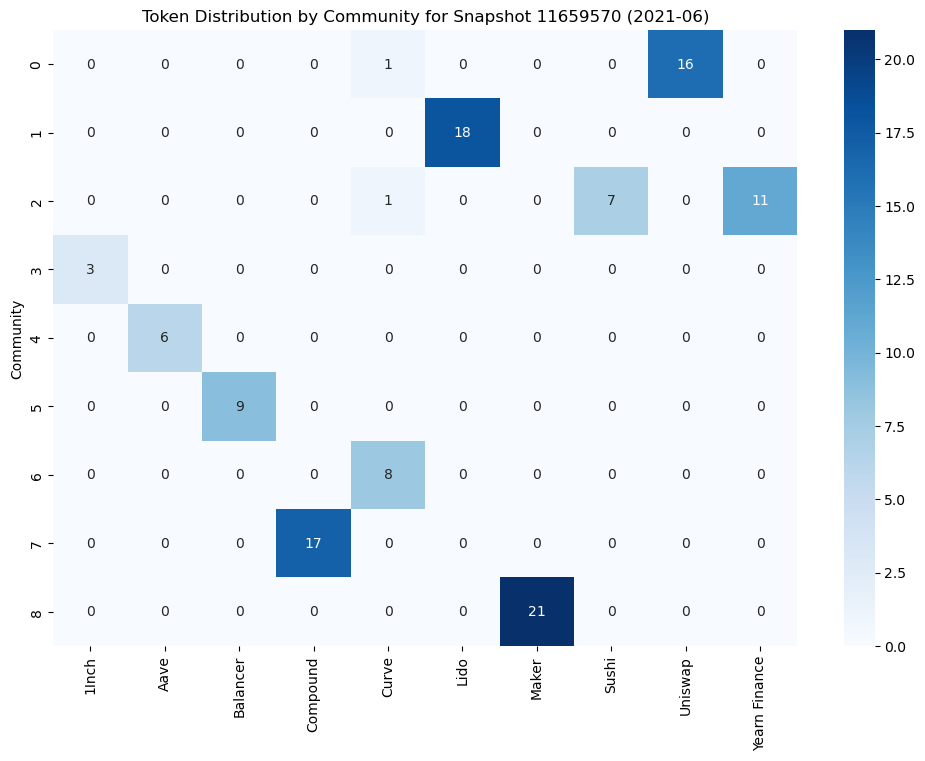

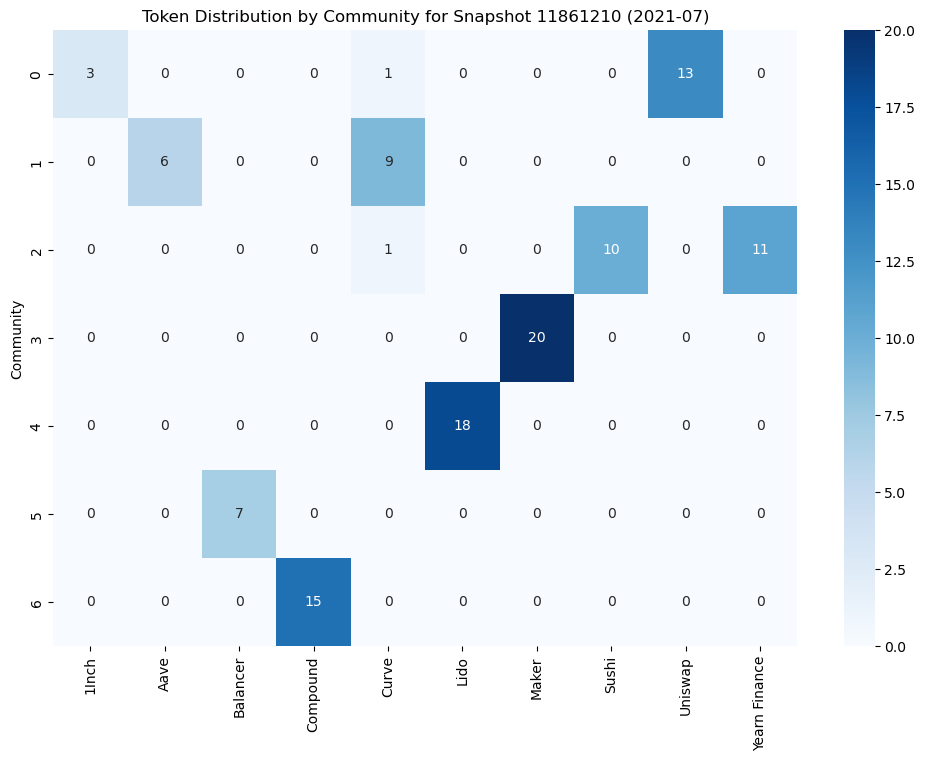

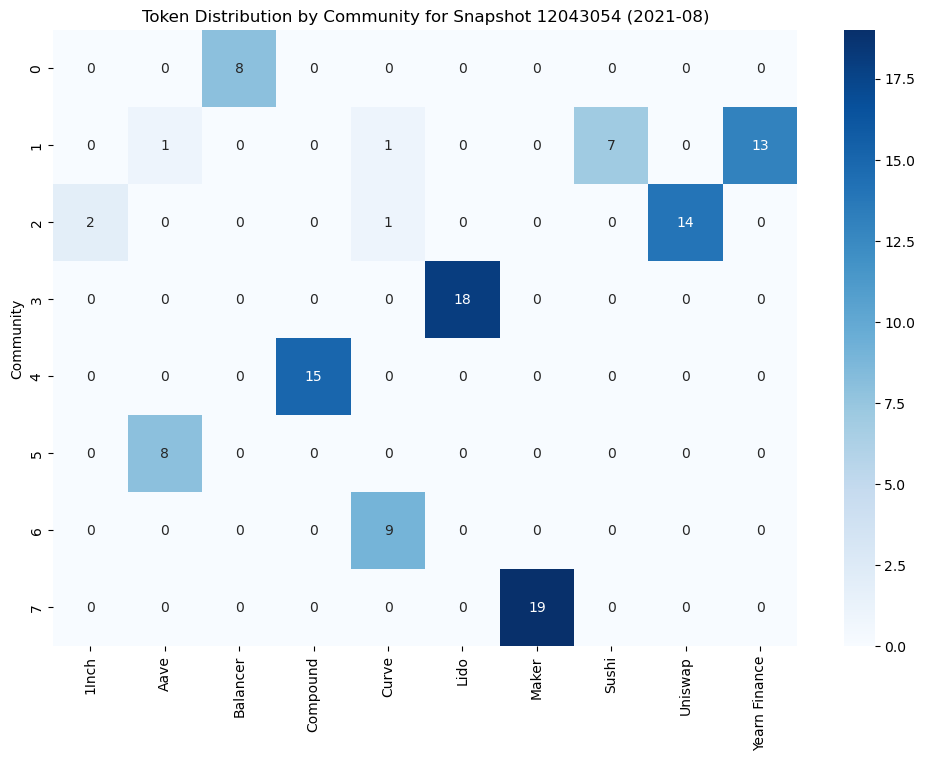

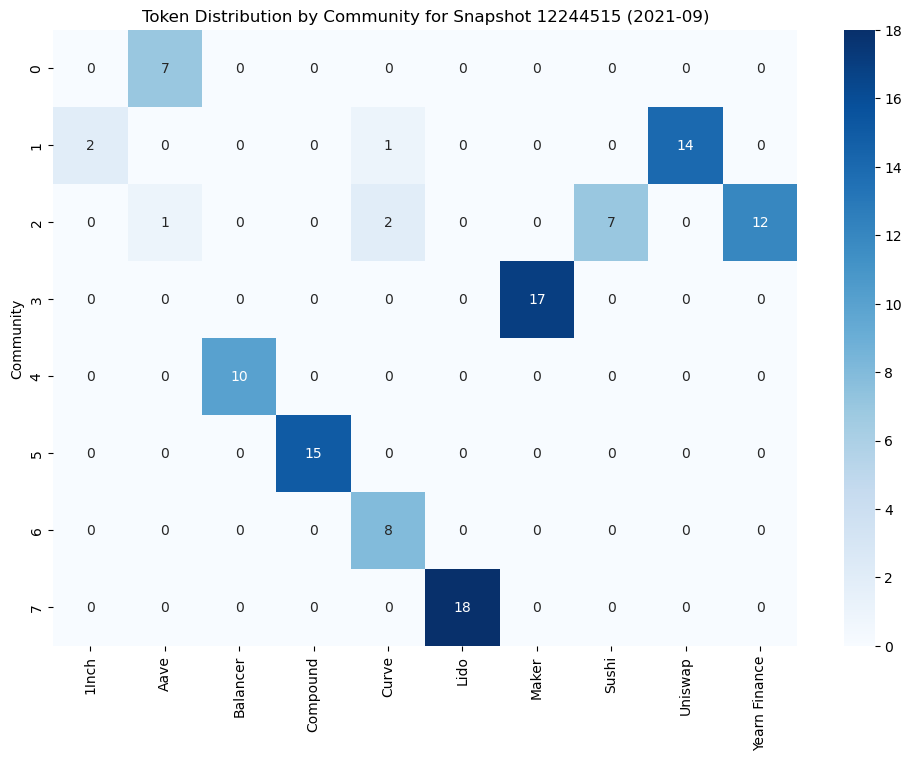

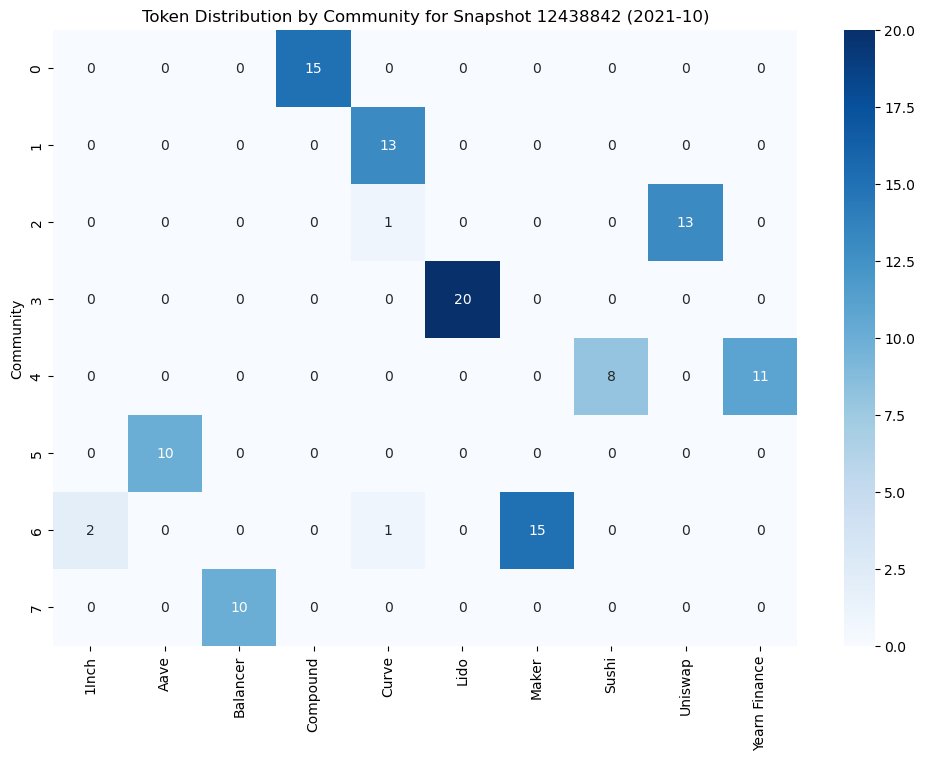

...

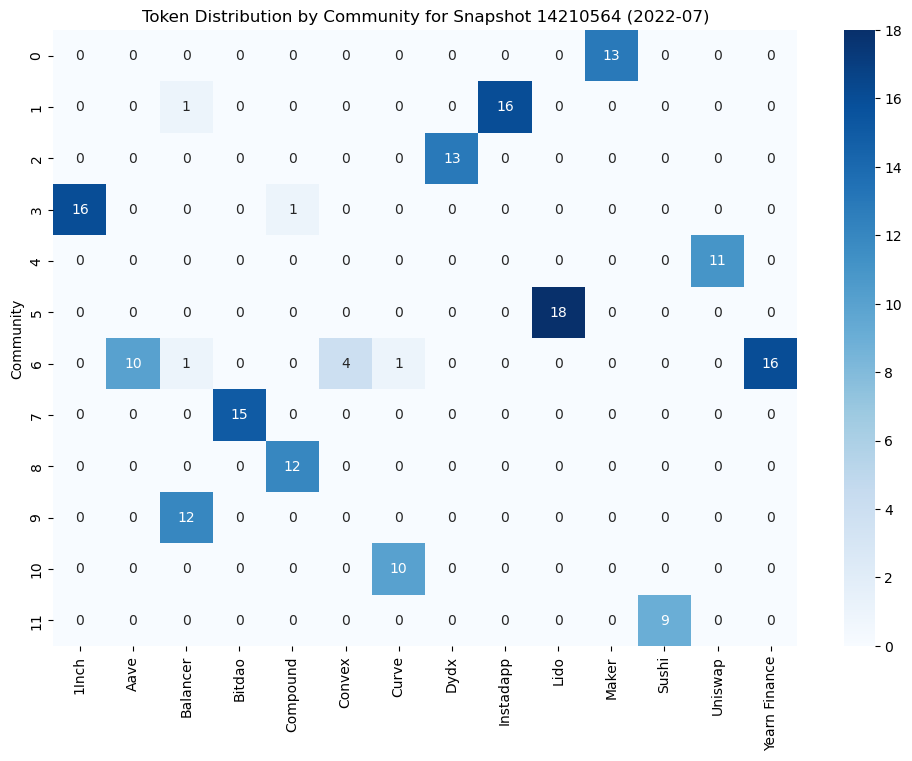

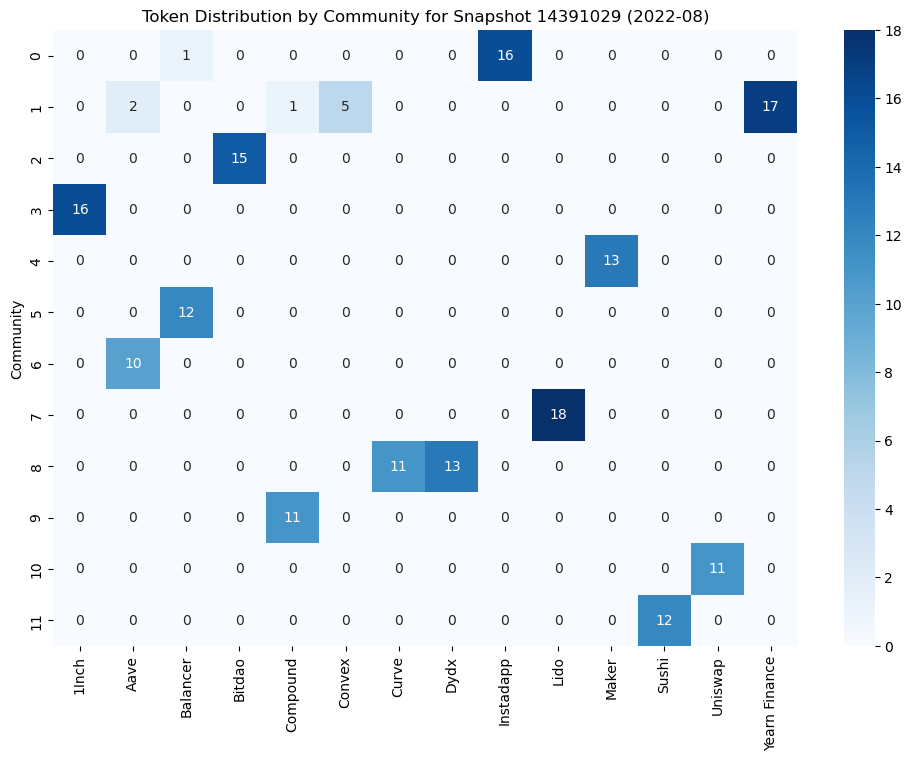

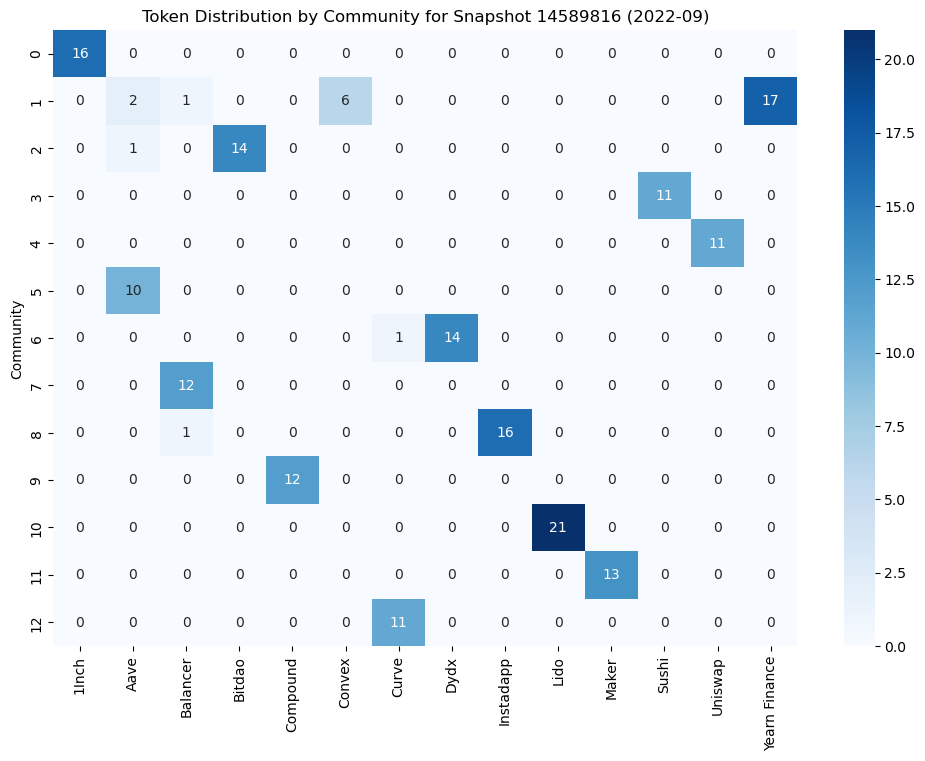

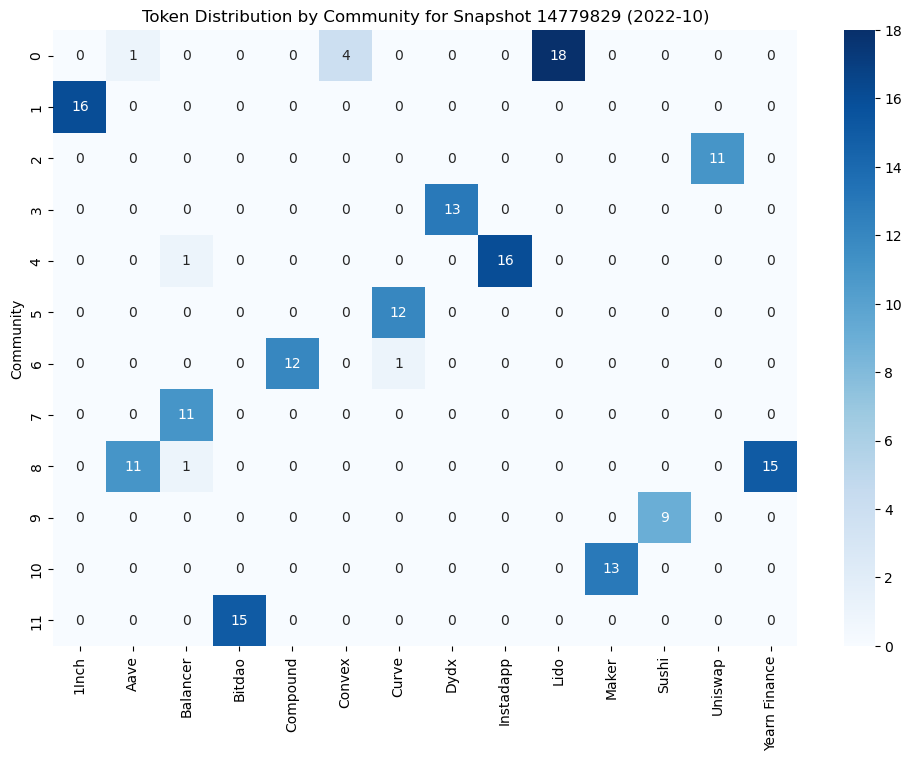

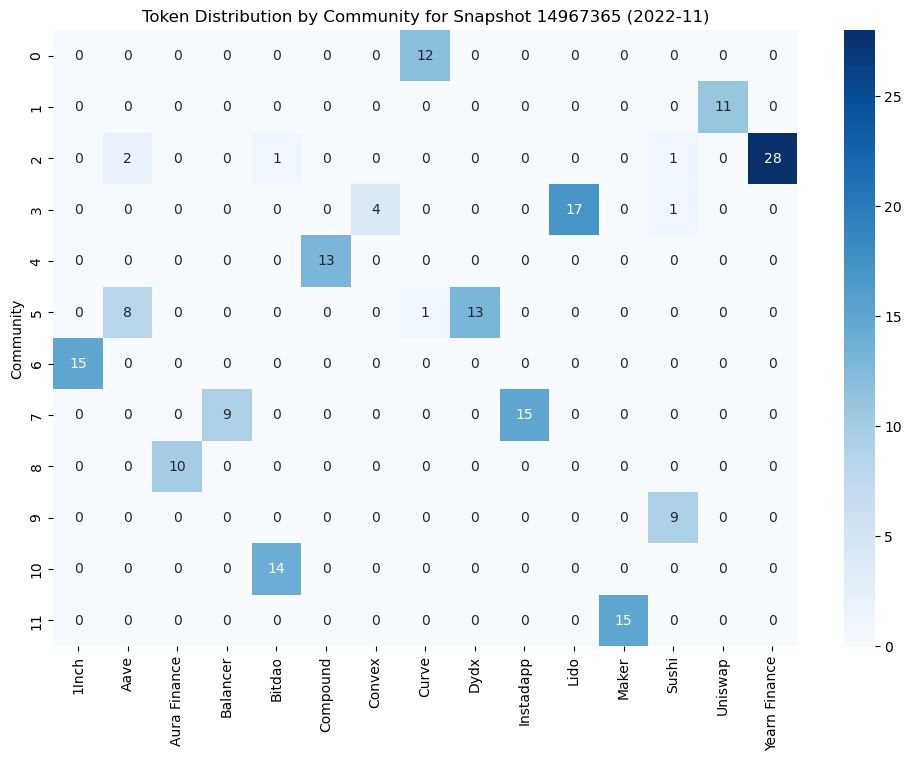

In [36]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_label_tokens(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Label the normal graph with token names using the enriched graph
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            normal_graph.nodes[node]['token_name'] = token_name
            normal_graph.nodes[node]['community'] = partition[node]
        else:
            normal_graph.nodes[node]['token_name'] = 'Unknown Token'
            normal_graph.nodes[node]['community'] = partition[node]

    # Create a DataFrame to hold the community and token information
    node_data = []
    for node, data in normal_graph.nodes(data=True):
        node_data.append({
            'Address': node,
            'Community': data['community'],
            'Token Name': data['token_name']
        })

    node_df = pd.DataFrame(node_data)

    # Create a pivot table to summarize token distribution by community
    pivot_table = node_df.pivot_table(index='Community', columns='Token Name', aggfunc='size', fill_value=0)

    # Reformat the table to match the desired output format
    pivot_table.reset_index(inplace=True)
    pivot_table.columns.name = None

    # Associate snapshot date
    snapshot_date = snapshot_dates.get(snapshot, 'Unknown Date')

    return pivot_table, snapshot_date

def visualize_token_distribution(snapshot, pivot_table, snapshot_date):
    plt.figure(figsize=(12, 8))
    sns.heatmap(pivot_table.set_index('Community'), annot=True, cmap='Blues', fmt='d')
    plt.title(f"Token Distribution by Community for Snapshot {snapshot} ({snapshot_date})")
    plt.show()

# Example snapshots to process
snapshots = list(snapshot_dates.keys())

for snapshot in snapshots:
    pivot_table, snapshot_date = detect_communities_and_label_tokens(snapshot)
    visualize_token_distribution(snapshot, pivot_table, snapshot_date)


In [29]:
import networkx as nx
from os.path import join

# Path to one of the graphs
graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_11659570.graphml'

# Load the graph
G = nx.read_graphml(graph_path)

# Print a few nodes and their attributes
for node, data in list(G.nodes(data=True))[:10]:  # Inspect the first 10 nodes
    print(f"Node ID: {node}, Attributes: {data}")


Node ID: 0x22400f33726f0c62ecbac8ee0ba47c117ce5d429, Attributes: {}
Node ID: 0x9dde0b1d39d0d2c6589cde1bfed3542d2a3c5b11, Attributes: {}
Node ID: 0x2fdbadf3c4d5a8666bc06645b8358ab803996e28, Attributes: {}
Node ID: 0xbe0eb53f46cd790cd13851d5eff43d12404d33e8, Attributes: {}
Node ID: 0x0248374df0bf742386a278430cdf2cf8a95d6dd9, Attributes: {}
Node ID: 0xd6868b23905009d859cc232f7c008c13bc527702, Attributes: {}
Node ID: 0x25f2226b597e8f9514b3f68f00f494cf4f286491, Attributes: {}
Node ID: 0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3, Attributes: {}
Node ID: 0xf977814e90da44bfa03b6295a0616a897441acec, Attributes: {}
Node ID: 0x0a3f6849f78076aefadf113f5bed87720274ddc0, Attributes: {}


In [30]:
# Example known wallet address
known_wallet = '0x7e88dc82b0a9ee4dc04abf88c7c449804df3f375'

# Check if this wallet exists as a node in the graph
if known_wallet in G.nodes:
    print(f"Wallet {known_wallet} is present as a node in the graph.")
else:
    print(f"Wallet {known_wallet} is NOT present as a node in the graph.")


Wallet 0x7e88dc82b0a9ee4dc04abf88c7c449804df3f375 is present as a node in the graph.


In [31]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_label_tokens(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Label the normal graph with token names using the enriched graph
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            normal_graph.nodes[node]['token_name'] = token_name
            normal_graph.nodes[node]['community'] = partition[node]
        else:
            normal_graph.nodes[node]['token_name'] = 'Unknown Token'
            normal_graph.nodes[node]['community'] = partition[node]

    # Create a DataFrame to hold the community and token information
    node_data = []
    for node, data in normal_graph.nodes(data=True):
        node_data.append({
            'Address': node,
            'Community': data['community'],
            'Token Name': data['token_name']
        })

    node_df = pd.DataFrame(node_data)

    # Create a pivot table to summarize token distribution by community
    pivot_table = node_df.pivot_table(index='Community', columns='Token Name', aggfunc='size', fill_value=0)

    # Reformat the table to match the desired output format
    pivot_table.reset_index(inplace=True)
    pivot_table.columns.name = None

    # Associate snapshot date
    snapshot_date = snapshot_dates.get(snapshot, 'Unknown Date')
    
    print(f"Token Distribution by Community for Snapshot {snapshot} ({snapshot_date})")
    display(pivot_table)
    print("\n")

# Example snapshots to process
snapshots = list(snapshot_dates.keys())

for snapshot in snapshots:
    detect_communities_and_label_tokens(snapshot)


Token Distribution by Community for Snapshot 11659570 (2021-06)


,Community,1Inch,Aave,Balancer,Compound,Curve,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,9,0,0,0,0,0,0,0
1,1,0,0,0,0,1,0,0,7,0,11
2,2,0,0,0,0,1,0,0,0,16,0
3,3,0,0,0,0,0,0,21,0,0,0
4,4,0,6,0,0,0,0,0,0,0,0
5,5,3,0,0,0,0,0,0,0,0,0
6,6,0,0,0,0,8,0,0,0,0,0
7,7,0,0,0,0,0,18,0,0,0,0
8,8,0,0,0,17,0,0,0,0,0,0




Token Distribution by Community for Snapshot 11861210 (2021-07)


,Community,1Inch,Aave,Balancer,Compound,Curve,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,0,1,0,0,10,0,11
1,1,0,6,0,0,9,0,0,0,0,0
2,2,0,0,0,15,0,0,0,0,0,0
3,3,3,0,0,0,1,0,0,0,13,0
4,4,0,0,0,0,0,0,20,0,0,0
5,5,0,0,0,0,0,18,0,0,0,0
6,6,0,0,7,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 12043054 (2021-08)


,Community,1Inch,Aave,Balancer,Compound,Curve,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,0,0,0,19,0,0,0
1,1,0,0,0,0,9,0,0,0,0,0
2,2,0,0,8,0,0,0,0,0,0,0
3,3,0,0,0,0,0,18,0,0,0,0
4,4,0,8,0,0,0,0,0,0,0,0
5,5,0,0,0,15,0,0,0,0,0,0
6,6,2,0,0,0,1,0,0,0,14,0
7,7,0,1,0,0,1,0,0,7,0,13




Token Distribution by Community for Snapshot 12244515 (2021-09)


,Community,1Inch,Aave,Balancer,Compound,Curve,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,0,0,0,17,0,0,0
1,1,0,1,0,0,10,0,0,7,0,12
2,2,0,0,0,15,0,0,0,0,0,0
3,3,0,0,10,0,0,0,0,0,0,0
4,4,0,0,0,0,0,18,0,0,0,0
5,5,0,7,0,0,0,0,0,0,0,0
6,6,2,0,0,0,1,0,0,0,14,0




Token Distribution by Community for Snapshot 12438842 (2021-10)


,Community,1Inch,Aave,Balancer,Compound,Curve,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,0,13,0,0,0,0,0
1,1,0,0,0,0,1,0,0,0,13,0
2,2,2,0,0,0,1,0,15,0,0,0
3,3,0,0,0,15,0,0,0,0,0,0
4,4,0,0,10,0,0,0,0,0,0,0
5,5,0,0,0,0,0,0,0,8,0,11
6,6,0,0,0,0,0,20,0,0,0,0
7,7,0,10,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 12638919 (2021-11)


,Community,1Inch,Aave,Balancer,Compound,Convex,Curve,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,2,0,0,0,0,1,0,0,14,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,14,0
2,2,0,0,0,16,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,19,0,0,0,0
4,4,0,0,0,0,0,0,11,0,0,0,0,0
5,5,0,0,0,0,0,2,0,0,0,7,0,10
6,6,0,9,0,0,0,10,0,0,0,0,0,0
7,7,0,0,0,0,5,0,0,0,0,0,0,0
8,8,0,0,10,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 12831436 (2021-12)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,0,0,0,13,0,0,0,11,0,11
1,1,0,0,0,0,15,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,18,0,0,0,0,0
3,3,2,0,0,0,0,0,1,0,0,13,0,0,0
4,4,0,0,0,0,0,0,0,0,0,0,0,14,0
5,5,0,0,0,0,0,0,0,0,19,0,0,0,0
6,6,0,0,0,0,0,5,0,0,0,0,0,0,0
7,7,0,8,10,0,0,0,0,0,0,0,0,0,0
8,8,0,0,0,15,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 13029639 (2022-01)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,15,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,16,0,0,0
2,2,0,0,0,0,14,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,19,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,0,0,0,13,0
5,5,0,0,0,0,0,0,0,6,0,0,0,0,0,0
6,6,0,0,0,0,0,0,0,0,18,0,0,0,0,0
7,7,0,8,9,0,0,0,0,0,0,0,0,0,0,0
8,8,0,0,0,0,0,0,14,0,0,0,0,10,0,13
9,9,0,0,0,0,0,4,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 13230157 (2022-02)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0
1,1,8,0,0,0,0,0,12,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,0,16,0,0,0
3,3,0,0,0,0,0,0,0,0,19,0,0,0,0,0
4,4,0,0,0,0,0,0,2,0,0,0,0,8,0,14
5,5,0,0,0,0,0,0,0,0,0,0,0,0,12,0
6,6,0,0,0,0,0,0,0,0,0,19,0,0,0,0
7,7,0,0,0,0,0,0,0,12,0,0,0,0,0,0
8,8,0,9,10,0,0,0,0,0,0,0,0,0,0,0
9,9,0,0,0,0,15,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 13422506 (2022-03)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,14,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,2,0,0,0,0,13,0,13
2,2,0,0,0,0,0,0,0,0,0,0,16,0,0,0
3,3,0,0,0,0,0,0,11,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,19,0,0,0,0
5,5,0,0,0,0,0,0,0,17,0,0,0,0,0,0
6,6,0,0,0,0,0,4,0,0,0,0,0,0,0,0
7,7,0,0,0,0,0,0,0,0,16,0,0,0,0,0
8,8,0,0,0,0,0,0,0,0,0,0,0,0,11,0
9,9,8,0,0,0,0,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 13620205 (2022-04)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0
1,1,0,9,10,0,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,1,0,0,0,15,0,0,0
3,3,17,0,0,0,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,12,0,0,0,0,0,0
5,5,0,0,0,0,0,0,10,0,0,0,0,0,0,0
6,6,0,0,0,0,0,0,0,0,16,0,0,0,0,0
7,7,0,0,0,0,15,0,0,0,0,0,0,0,0,0
8,8,0,0,0,0,0,0,0,0,0,0,0,0,11,0
9,9,0,0,0,0,0,0,0,0,0,19,0,0,0,0




Token Distribution by Community for Snapshot 13809597 (2022-05)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,0,14,0,0,10,0,0,0,0,0,0
1,1,14,0,0,0,0,0,1,0,0,0,0,0,0,0
2,2,0,0,0,14,0,0,0,0,0,0,0,1,0,0
3,3,0,0,0,0,0,0,0,0,0,0,13,0,0,0
4,4,0,0,0,0,0,0,0,0,0,19,0,0,0,0
5,5,0,9,11,0,0,0,0,0,0,0,0,0,0,0
6,6,0,0,0,0,0,0,1,0,0,0,0,11,0,14
7,7,0,0,0,0,0,0,10,0,0,0,0,0,0,0
8,8,0,0,0,0,0,0,0,0,0,0,0,0,11,0
9,9,0,0,0,0,0,5,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 14009885 (2022-06)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,14,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,13,0,0,0,0,0,0
2,2,0,10,0,0,1,0,1,0,0,0,0,8,0,14
3,3,0,1,0,14,0,0,0,0,0,0,0,0,0,0
4,4,0,0,1,0,0,0,0,0,15,0,0,0,0,0
5,5,0,0,0,0,13,0,0,0,0,0,0,0,0,0
6,6,0,0,12,0,0,4,0,0,0,0,0,0,0,0
7,7,0,0,0,0,0,0,0,0,0,0,0,0,11,0
8,8,0,0,0,0,0,0,0,0,0,19,0,0,0,0
9,9,0,0,0,0,0,0,9,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 14210564 (2022-07)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,0,0,0,0,0,0,0,13,0,0,0
1,1,0,0,1,0,0,0,0,0,16,0,0,0,0,0
2,2,0,0,0,0,0,0,0,13,0,0,0,0,0,0
3,3,16,0,0,0,1,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,0,0,0,11,0
5,5,0,0,0,0,0,0,0,0,0,18,0,0,0,0
6,6,0,10,1,0,0,4,1,0,0,0,0,0,0,16
7,7,0,0,0,15,0,0,0,0,0,0,0,0,0,0
8,8,0,0,0,0,12,0,0,0,0,0,0,0,0,0
9,9,0,0,12,0,0,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 14391029 (2022-08)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,1,0,0,0,0,0,16,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,13,0,0,0
2,2,0,0,0,15,0,0,0,0,0,0,0,0,0,0
3,3,16,0,0,0,0,0,0,0,0,0,0,0,0,0
4,4,0,2,0,0,1,5,0,0,0,0,0,0,0,17
5,5,0,0,12,0,0,0,0,0,0,0,0,0,0,0
6,6,0,10,0,0,0,0,0,0,0,0,0,0,0,0
7,7,0,0,0,0,0,0,0,0,0,18,0,0,0,0
8,8,0,0,0,0,0,0,11,13,0,0,0,0,0,0
9,9,0,0,0,0,11,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 14589816 (2022-09)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,16,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,2,1,0,0,6,0,0,0,0,0,0,0,17
2,2,0,1,0,14,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,0,0,11,0,0
4,4,0,0,0,0,0,0,0,0,0,0,0,0,11,0
5,5,0,10,0,0,0,0,0,0,0,0,0,0,0,0
6,6,0,0,0,0,0,0,1,14,0,0,0,0,0,0
7,7,0,0,12,0,0,0,0,0,0,0,0,0,0,0
8,8,0,0,1,0,0,0,0,0,16,0,0,0,0,0
9,9,0,0,0,0,12,0,0,0,0,0,0,0,0,0




Token Distribution by Community for Snapshot 14779829 (2022-10)


,Community,1Inch,Aave,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,1,0,0,0,4,0,0,0,18,0,0,0,0
1,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,0,0,0,11,0
3,3,0,0,0,0,0,0,0,13,0,0,0,0,0,0
4,4,0,0,1,0,0,0,0,0,16,0,0,0,0,0
5,5,0,0,0,0,0,0,12,0,0,0,0,0,0,0
6,6,0,0,0,0,12,0,1,0,0,0,0,0,0,0
7,7,0,0,11,0,0,0,0,0,0,0,0,0,0,0
8,8,0,11,1,0,0,0,0,0,0,0,0,0,0,15
9,9,0,0,0,0,0,0,0,0,0,0,0,9,0,0




Token Distribution by Community for Snapshot 14967365 (2022-11)


,Community,1Inch,Aave,Aura Finance,Balancer,Bitdao,Compound,Convex,Curve,Dydx,Instadapp,Lido,Maker,Sushi,Uniswap,Yearn Finance
0,0,0,0,0,0,0,0,0,12,0,0,0,0,0,0,0
1,1,0,8,0,0,0,13,0,1,0,0,0,0,0,0,0
2,2,0,2,0,0,1,0,0,0,0,0,0,0,1,0,28
3,3,0,0,0,9,0,0,0,0,0,15,0,0,0,0,0
4,4,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0
5,5,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,6,0,0,0,0,0,0,0,0,0,0,0,0,0,11,0
7,7,0,0,0,0,0,0,4,0,0,0,17,0,1,0,0
8,8,0,0,0,0,0,0,0,0,0,0,0,0,9,0,0
9,9,0,0,0,0,14,0,0,0,0,0,0,0,0,0,0


In [38]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global'

# Snapshot dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

def detect_communities_and_label_tokens(snapshot):
    # Load the graphs
    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Perform Louvain community detection
    partition = community_louvain.best_partition(normal_graph)

    # Label the normal graph with token names using the enriched graph
    for node in normal_graph.nodes():
        if node in enriched_graph.nodes():
            token_address = enriched_graph.nodes[node].get('token_address', 'unknown')
            token_name = token_map.get(token_address, 'Unknown Token')
            normal_graph.nodes[node]['token_name'] = token_name
            normal_graph.nodes[node]['community'] = partition[node]
        else:
            normal_graph.nodes[node]['token_name'] = 'Unknown Token'
            normal_graph.nodes[node]['community'] = partition[node]

    # Create a DataFrame to hold the community and token information
    node_data = []
    for node, data in normal_graph.nodes(data=True):
        node_data.append({
            'Address': node,
            'Community': data['community'],
            'Token Name': data['token_name']
        })

    node_df = pd.DataFrame(node_data)

    # Create a pivot table to summarize token distribution by community
    pivot_table = node_df.pivot_table(index='Community', columns='Token Name', aggfunc='size', fill_value=0)

    # Reformat the table to match the desired output format
    pivot_table.reset_index(inplace=True)
    pivot_table.columns.name = None

    # Associate snapshot date
    snapshot_date = snapshot_dates.get(snapshot, 'Unknown Date')

    # Define the output file path
    output_file = join(output_directory, f'token_distribution_{snapshot}_{snapshot_date}.csv')

    # Save the pivot table as a CSV file
    pivot_table.to_csv(output_file, index=False)
    print(f"Saved token distribution for Snapshot {snapshot} ({snapshot_date}) to {output_file}")

# Ensure the output directory exists
os.makedirs(output_directory, exist_ok=True)

# Process each snapshot and save the results
for snapshot in snapshot_dates.keys():
    detect_communities_and_label_tokens(snapshot)


Saved token distribution for Snapshot 11659570 (2021-06) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_11659570_2021-06.csv
Saved token distribution for Snapshot 11861210 (2021-07) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_11861210_2021-07.csv
Saved token distribution for Snapshot 12043054 (2021-08) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_12043054_2021-08.csv
Saved token distribution for Snapshot 12244515 (2021-09) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_12244515_2021-09.csv
Saved token distribution for Snapshot 12438842 (2021-10) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_12438842_2021-10.csv
Saved token distribution for Snapshot 12638919 (2021-11) to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Non_global/token_distribution_1

# New shit

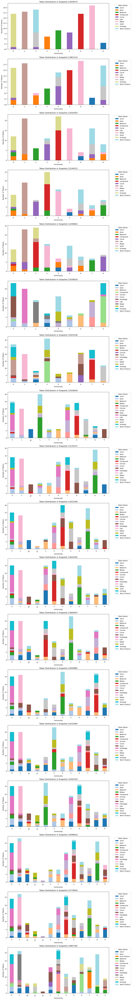

In [40]:
def visualize_token_distribution_stacked_bar(community_token_stats):
    snapshots = community_token_stats['Snapshot'].unique()
    num_snapshots = len(snapshots)
    
    fig, axes = plt.subplots(num_snapshots, 1, figsize=(12, 5 * num_snapshots))
    if num_snapshots == 1:
        axes = [axes]  # Ensure axes is iterable
    
    for i, snapshot in enumerate(snapshots):
        snapshot_data = community_token_stats[community_token_stats['Snapshot'] == snapshot]
        snapshot_data = snapshot_data.sort_values(by='Community')
        pivot_data = snapshot_data.pivot_table(index='Community', columns='Token Name', values='Count', aggfunc='sum', fill_value=0)
        pivot_data.plot(kind='bar', stacked=True, ax=axes[i], colormap='tab20')
        axes[i].set_title(f'Token Distribution in Snapshot {snapshot}')
        axes[i].set_xlabel('Community')
        axes[i].set_ylabel('Number of Tokens')
        axes[i].legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
        axes[i].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

visualize_token_distribution_stacked_bar(community_token_name_stats)



Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11659570.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11861210.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12043054.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12244515.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12438842.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graph

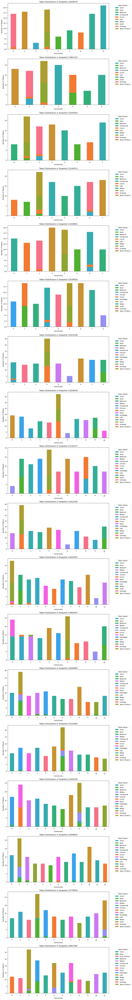

In [42]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from os.path import join
from collections import defaultdict

def generate_token_name_statistics(normal_graph_path, enriched_graph_path, token_info_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_token_stats = []
    previous_communities = None

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_path)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_file = join(normal_graph_path, filename)
            enriched_graph_file = join(enriched_graph_path, filename)  # Use the same filename for enriched graphs

            if not os.path.exists(enriched_graph_file):
                print(f"Enriched graph file not found: {enriched_graph_file}")
                continue

            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Assign communities to nodes
            for node, comm in partition.items():
                G.nodes[node]['community'] = comm

            # Compile token statistics per community
            community_stats = defaultdict(lambda: defaultdict(int))
            for node, data in G.nodes(data=True):
                community = data['community']
                if node in enriched_G.nodes():
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                    community_stats[community][token_name] += 1

            # Format data for this graph into a list of dictionaries
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for community, tokens in community_stats.items():
                for token_name, count in tokens.items():
                    community_token_stats.append({
                        'Snapshot': snapshot_time,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

    # Convert to DataFrame for better display and analysis
    return pd.DataFrame(community_token_stats)

def visualize_token_distribution_over_time(community_token_stats):
    # Ensure the DataFrame has the correct data types
    community_token_stats['Count'] = community_token_stats['Count'].astype(int)
    community_token_stats['Community'] = community_token_stats['Community'].astype(int)  # Ensure Community is an integer for sorting

    # Set up a consistent color palette for tokens
    unique_tokens = community_token_stats['Token Name'].unique()
    palette = sns.color_palette("husl", len(unique_tokens))
    color_map = {token: palette[i] for i, token in enumerate(unique_tokens)}

    # Plot the stacked bar chart
    snapshots = community_token_stats['Snapshot'].unique()
    num_snapshots = len(snapshots)
    fig, axes = plt.subplots(num_snapshots, 1, figsize=(12, 5 * num_snapshots))

    if num_snapshots == 1:
        axes = [axes]  # Ensure axes is iterable

    for i, snapshot in enumerate(snapshots):
        snapshot_data = community_token_stats[community_token_stats['Snapshot'] == snapshot]
        snapshot_data = snapshot_data.sort_values(by='Community')  # Sort by Community

        # Convert data to a format suitable for a stacked bar chart
        stacked_data = snapshot_data.pivot_table(index='Community', columns='Token Name', values='Count', fill_value=0)
        stacked_data.plot(kind='bar', stacked=True, ax=axes[i], color=[color_map[token] for token in stacked_data.columns])

        axes[i].set_title(f'Token Distribution in Snapshot {snapshot}')
        axes[i].set_xlabel('Community')
        axes[i].set_ylabel('Number of Tokens')
        axes[i].legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
        axes[i].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Generate token name statistics
community_token_name_stats = generate_token_name_statistics(normal_graph_path, enriched_graph_path, token_info_path)

# Visualize the token statistics over time
visualize_token_distribution_over_time(community_token_name_stats)


# I WAS HERE

In [53]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from os.path import join
from collections import defaultdict

def generate_token_name_statistics(normal_graph_path, enriched_graph_path, token_info_path, output_directory):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_token_stats = []
    previous_communities = None

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_path)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_file = join(normal_graph_path, filename)
            enriched_graph_file = join(enriched_graph_path, filename)  # Use the same filename for enriched graphs

            if not os.path.exists(enriched_graph_file):
                print(f"Enriched graph file not found: {enriched_graph_file}")
                continue

            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Assign communities to nodes
            for node, comm in partition.items():
                G.nodes[node]['community'] = comm

            # Compile token statistics per community
            community_stats = defaultdict(lambda: defaultdict(int))
            for node, data in G.nodes(data=True):
                community = data['community']
                if node in enriched_G.nodes():
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                    community_stats[community][token_name] += 1

            # Format data for this graph into a list of dictionaries
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for community, tokens in community_stats.items():
                for token_name, count in tokens.items():
                    community_token_stats.append({
                        'Snapshot': snapshot_time,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

    # Convert to DataFrame for better display and analysis
    df = pd.DataFrame(community_token_stats)

    # Save the DataFrame to a CSV file in the output directory
    output_file = join(output_directory, 'community_token_name_stats.csv')
    df.to_csv(output_file, index=False)
    print(f"Token name statistics saved to {output_file}")

    return df

def visualize_token_distribution_over_time(community_token_stats, output_directory, snapshot_dates):
    # Ensure the DataFrame has the correct data types
    community_token_stats['Count'] = community_token_stats['Count'].astype(int)
    community_token_stats['Community'] = community_token_stats['Community'].astype(int)  # Ensure Community is an integer for sorting

    # Set up a consistent color palette for tokens
    unique_tokens = community_token_stats['Token Name'].unique()
    palette = sns.color_palette("husl", len(unique_tokens))
    color_map = {token: palette[i] for i, token in enumerate(unique_tokens)}

    # Plot and save each snapshot as an individual image
    snapshots = community_token_stats['Snapshot'].unique()

    for snapshot in snapshots:
        snapshot_data = community_token_stats[community_token_stats['Snapshot'] == snapshot]
        snapshot_data = snapshot_data.sort_values(by='Community')  # Sort by Community

        # Convert data to a format suitable for a stacked bar chart
        stacked_data = snapshot_data.pivot_table(index='Community', columns='Token Name', values='Count', fill_value=0)

        # Get the date corresponding to the snapshot
        snapshot_date = snapshot_dates.get(snapshot, 'Unknown Date')

        # Create and save the figure for the current snapshot
        plt.figure(figsize=(12, 7))
        stacked_data.plot(kind='bar', stacked=True, color=[color_map[token] for token in stacked_data.columns])

        plt.title(f'Token Distribution in Snapshot {snapshot} ({snapshot_date})')
        plt.xlabel('Community')
        plt.ylabel('Number of Tokens')
        plt.legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.xticks(rotation=45)

        # Save the plot as a PNG file
        plot_file = join(output_directory, f'token_distribution_snapshot_{snapshot}_{snapshot_date}.png')
        plt.tight_layout()
        plt.savefig(plot_file)
        plt.close()  # Close the figure to avoid displaying it in a notebook environment
        print(f"Plot for Snapshot {snapshot} ({snapshot_date}) saved to {plot_file}")

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final_selection'

# Mapping of snapshots to dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Ensure the output directory exists
os.makedirs(output_directory, exist_ok=True)

# Generate token name statistics and save to CSV
community_token_name_stats = generate_token_name_statistics(normal_graph_path, enriched_graph_path, token_info_path, output_directory)

# Visualize the token statistics over time and save the plots
visualize_token_distribution_over_time(community_token_name_stats, output_directory, snapshot_dates)


Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11659570.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11861210.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12043054.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12244515.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12438842.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graph

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

<Figure size 1200x700 with 0 Axes>

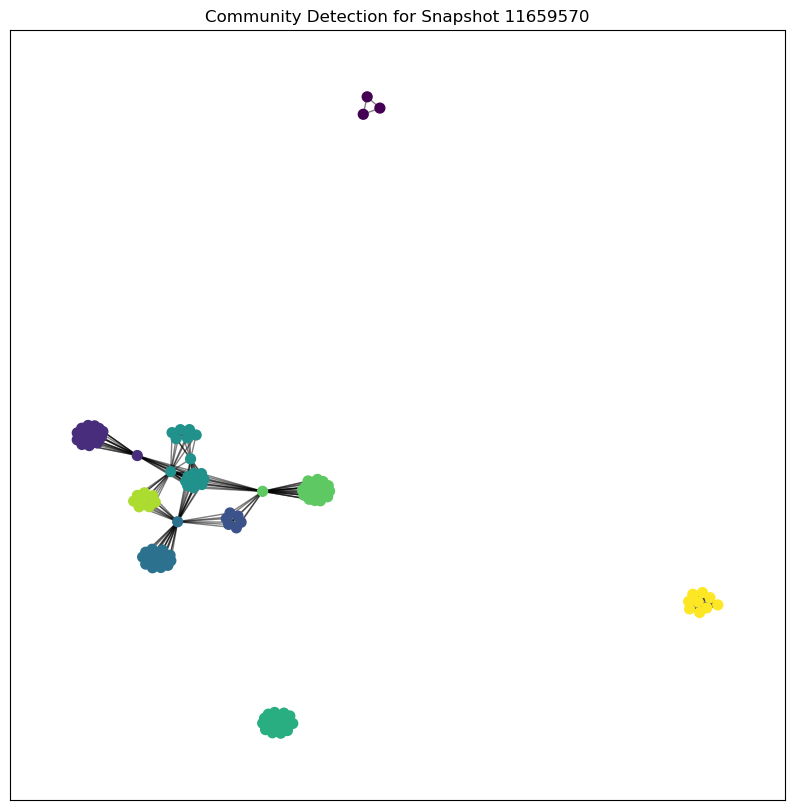

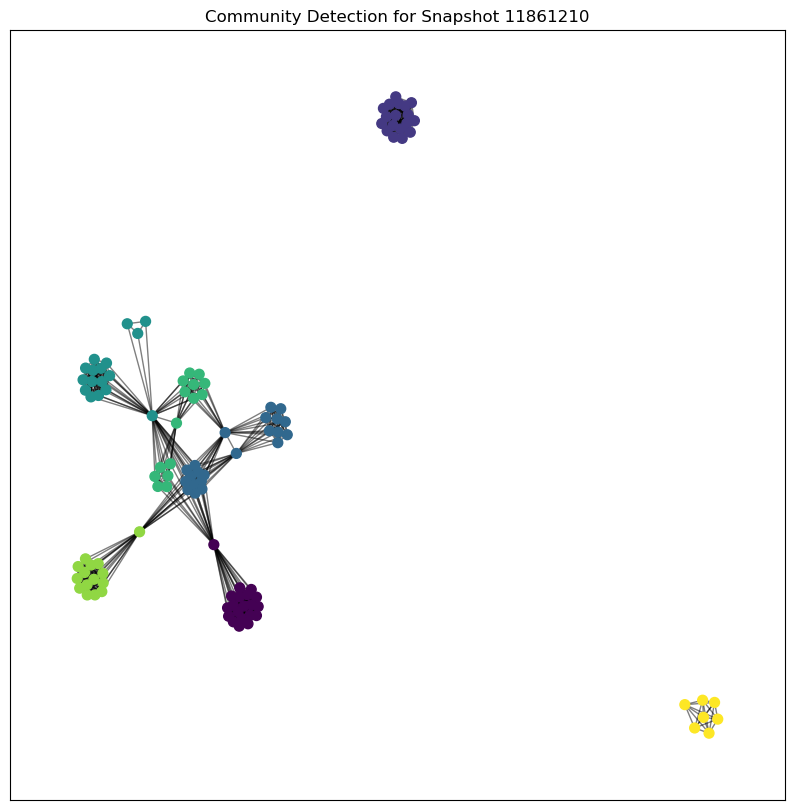

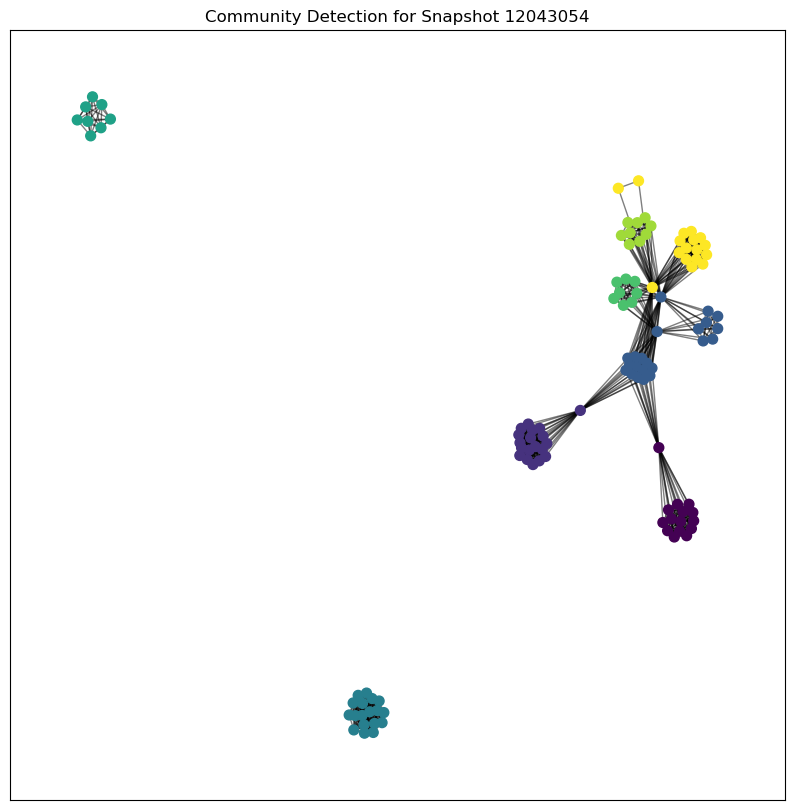

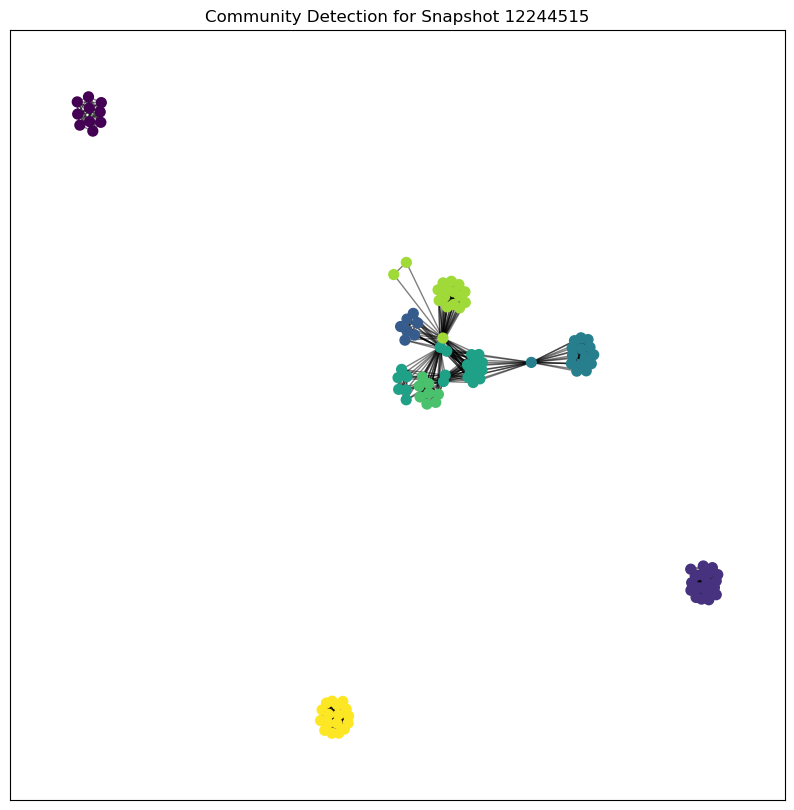

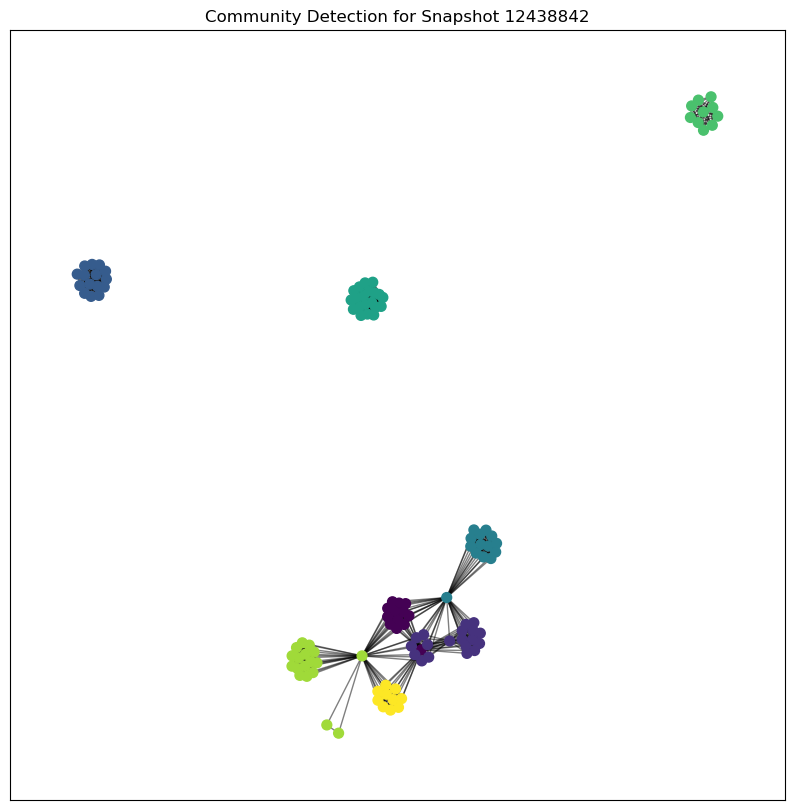

...

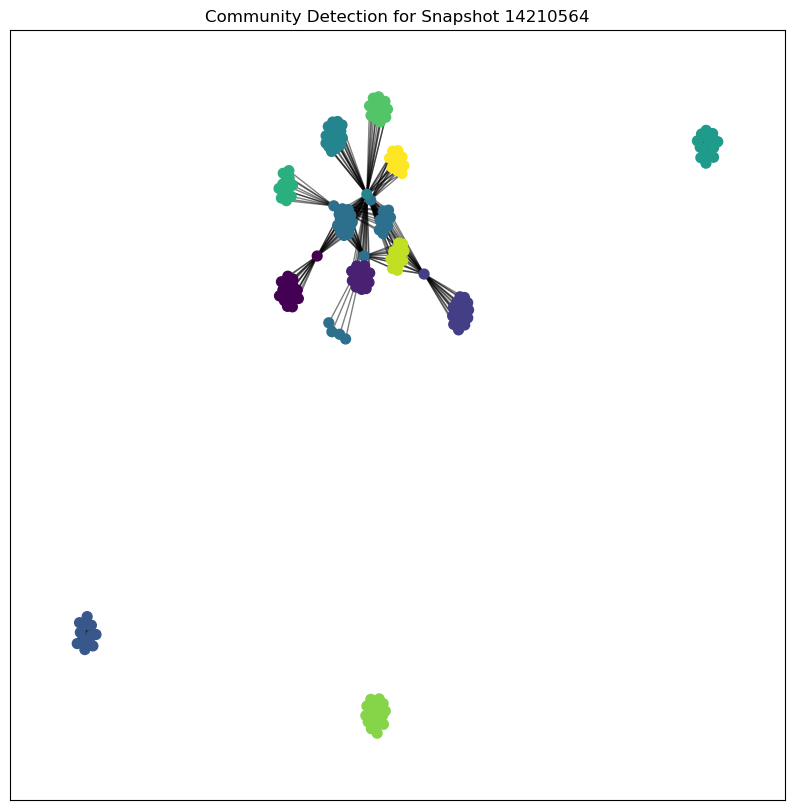

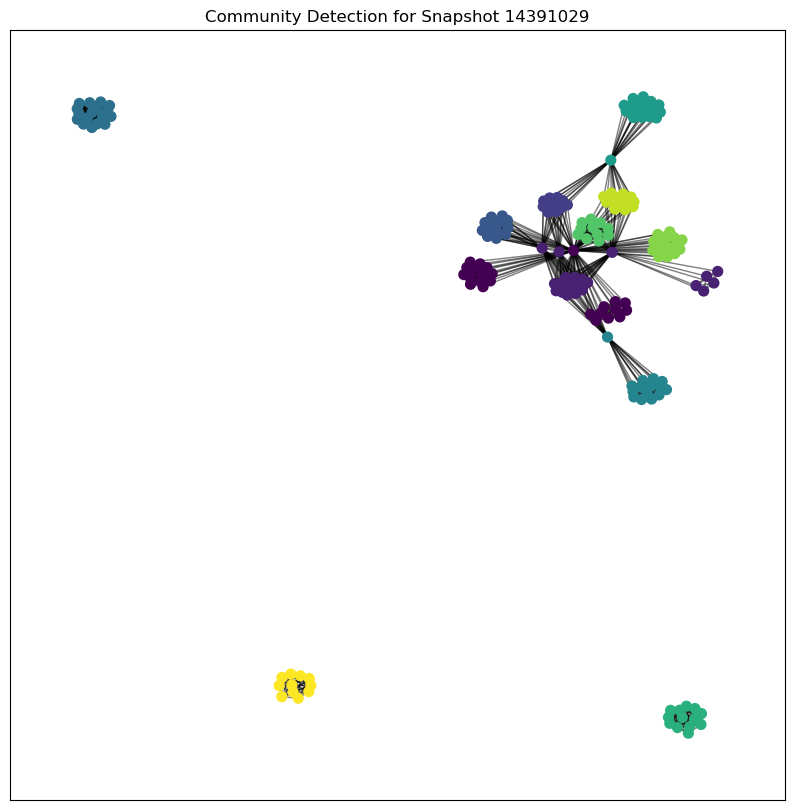

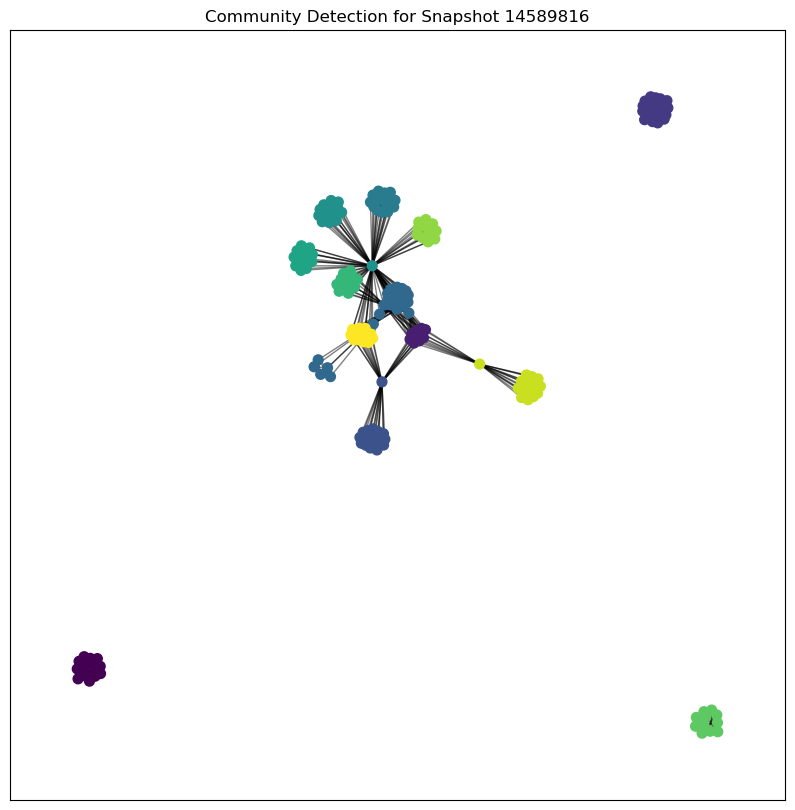

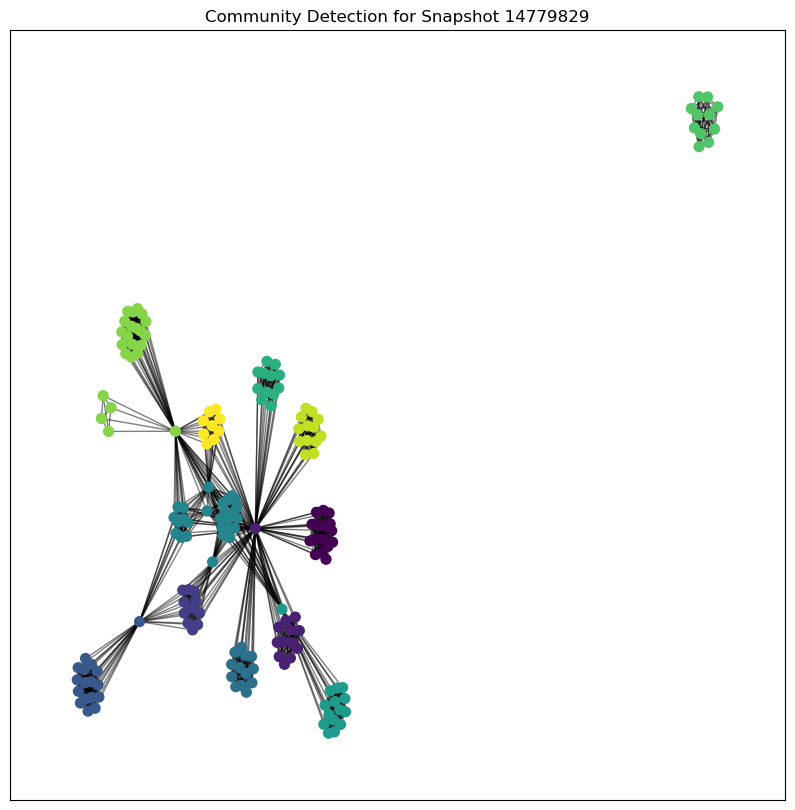

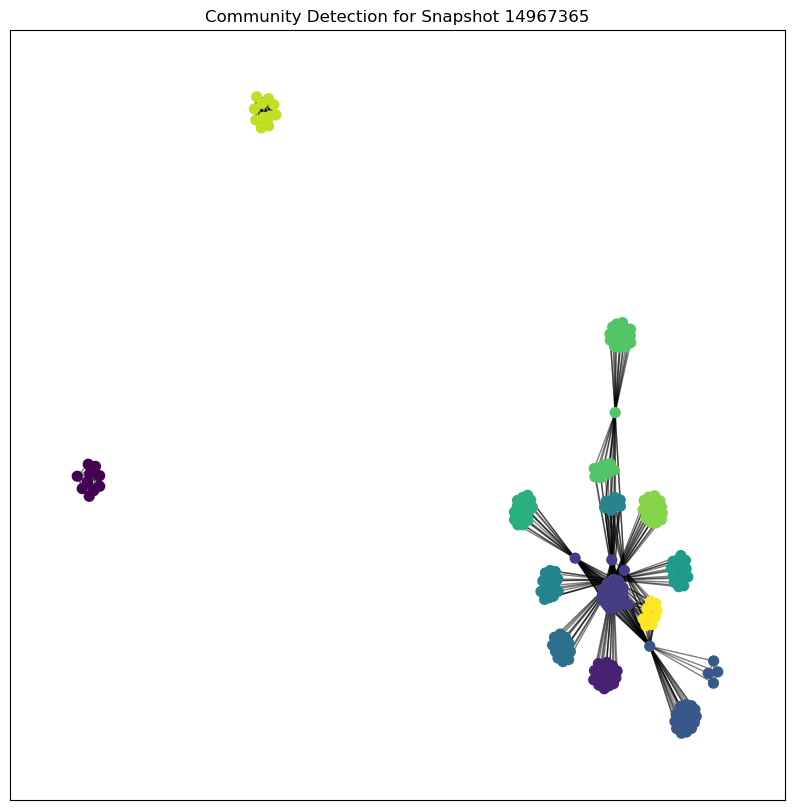


Community Sizes for Snapshot 11659570:

 Community  Number of Nodes
         0                3
         1               17
         2                6
         3               17
         4               19
         5               18
         6               21
         7                8
         8                9
----------------------------------------

Community Sizes for Snapshot 11861210:

 Community  Number of Nodes
         0               20
         1               18
         2               22
         3               17
         4               15
         5               15
         6                7
----------------------------------------

Community Sizes for Snapshot 12043054:

 Community  Number of Nodes
         0               15
         1               19
         2               22
         3               18
         4                8
         5                8
         6                9
         7               17
---------------------------------------

In [33]:
import os
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import pandas as pd
from os.path import join

# Step 1: Load the Graph Data
def load_graphs(graph_directory):
    graphs = {}
    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            graphs[snapshot_time] = G
    return graphs

# Step 2: Apply Louvain Method for Community Detection
def detect_communities(graphs):
    communities = {}
    for snapshot_time, G in graphs.items():
        partition = community_louvain.best_partition(G)
        communities[snapshot_time] = partition
        # Set the community as an attribute for each node
        nx.set_node_attributes(G, partition, 'community')
    return communities

# Step 3: Visualize the Communities
def visualize_communities(graphs, communities):
    for snapshot_time, G in graphs.items():
        partition = communities[snapshot_time]
        pos = nx.spring_layout(G)
        plt.figure(figsize=(10, 10))
        cmap = plt.get_cmap('viridis')
        nx.draw_networkx_nodes(G, pos, node_size=50, cmap=cmap, node_color=list(partition.values()))
        nx.draw_networkx_edges(G, pos, alpha=0.5)
        plt.title(f"Community Detection for Snapshot {snapshot_time}")
        plt.show()

# Step 4: Print the Community Data in a Clean Table Format
def print_community_data(communities):
    for snapshot_time, partition in communities.items():
        # Prepare data for the table
        community_sizes = pd.Series(partition).value_counts().sort_index()
        community_data = pd.DataFrame({
            'Community': community_sizes.index,
            'Number of Nodes': community_sizes.values
        })
        print(f"\nCommunity Sizes for Snapshot {snapshot_time}:\n")
        print(community_data.to_string(index=False))
        print("-" * 40)

# Path setup
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Load the graphs
graphs = load_graphs(graph_directory)

# Detect communities using Louvain method
communities = detect_communities(graphs)

# Visualize the communities
visualize_communities(graphs, communities)

# Print the community data in a clean table format
print_community_data(communities)




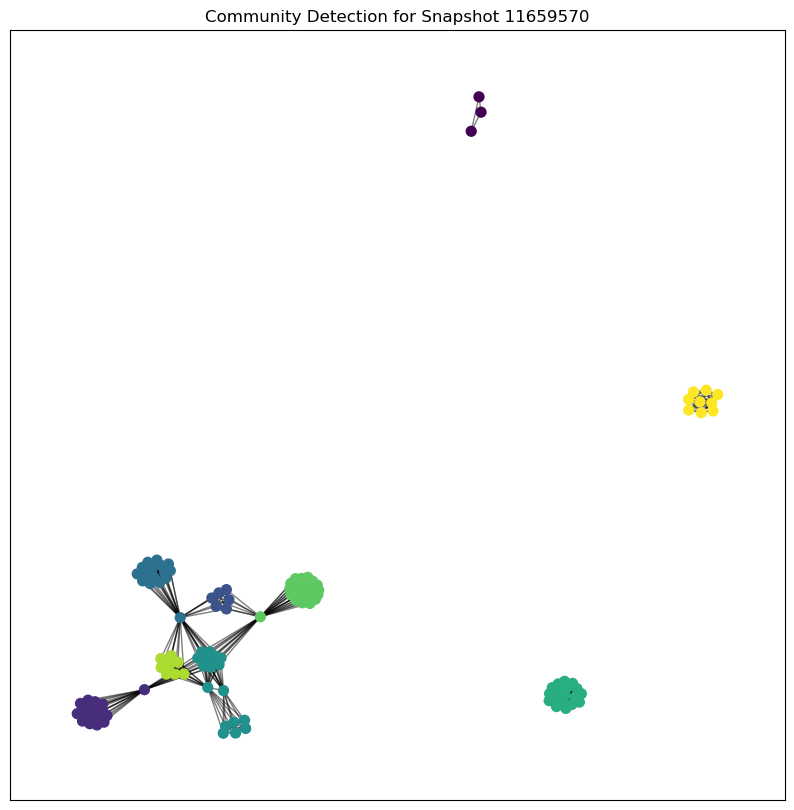

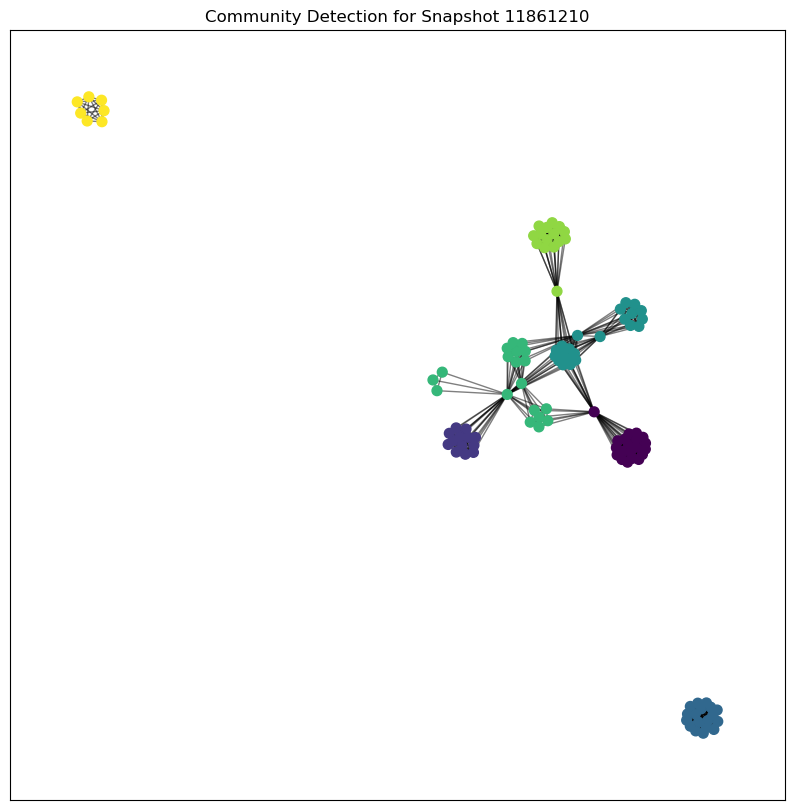

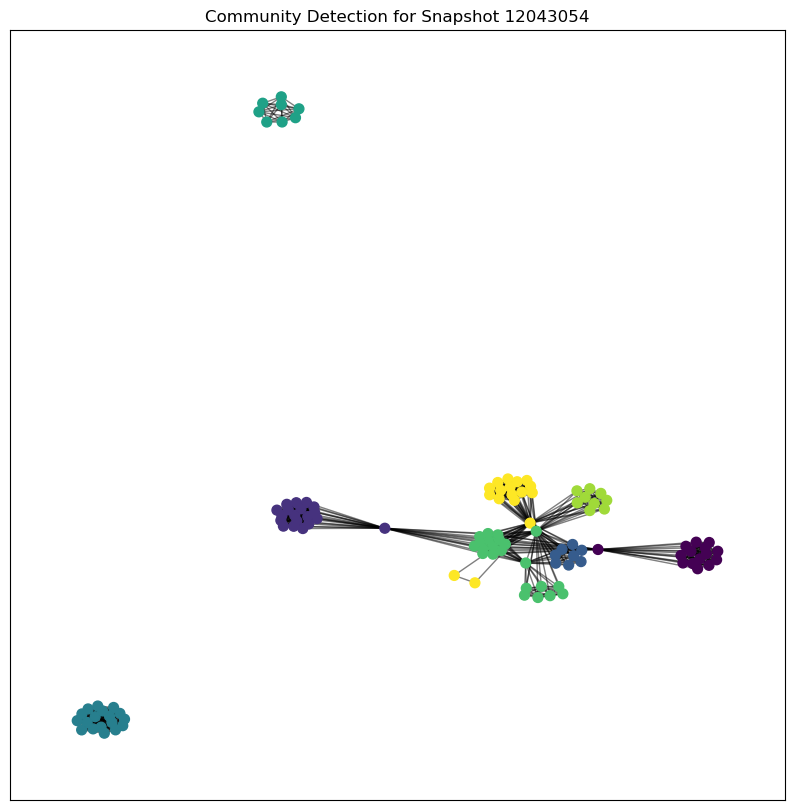

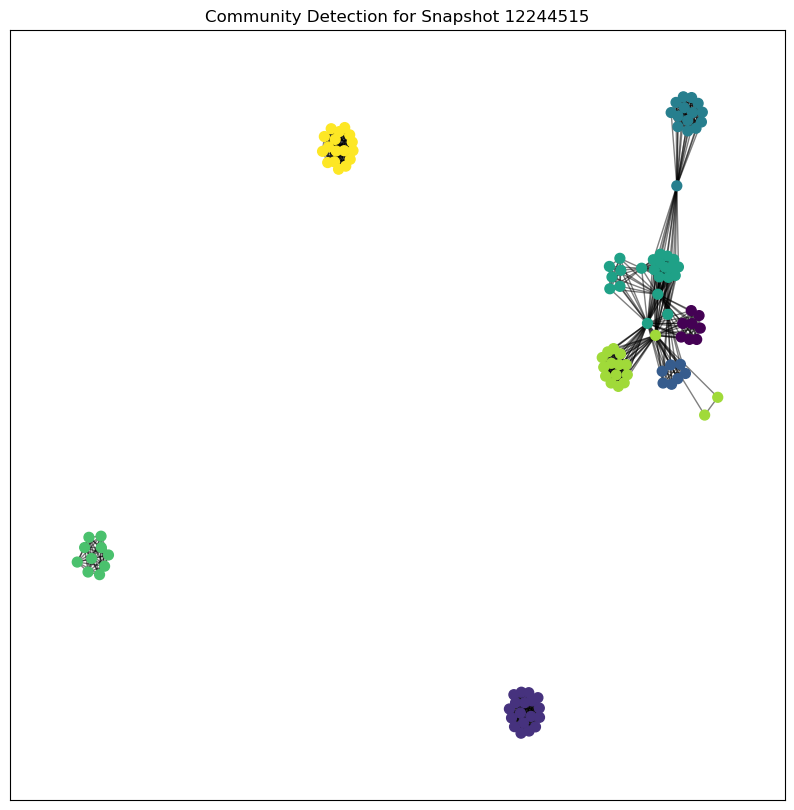

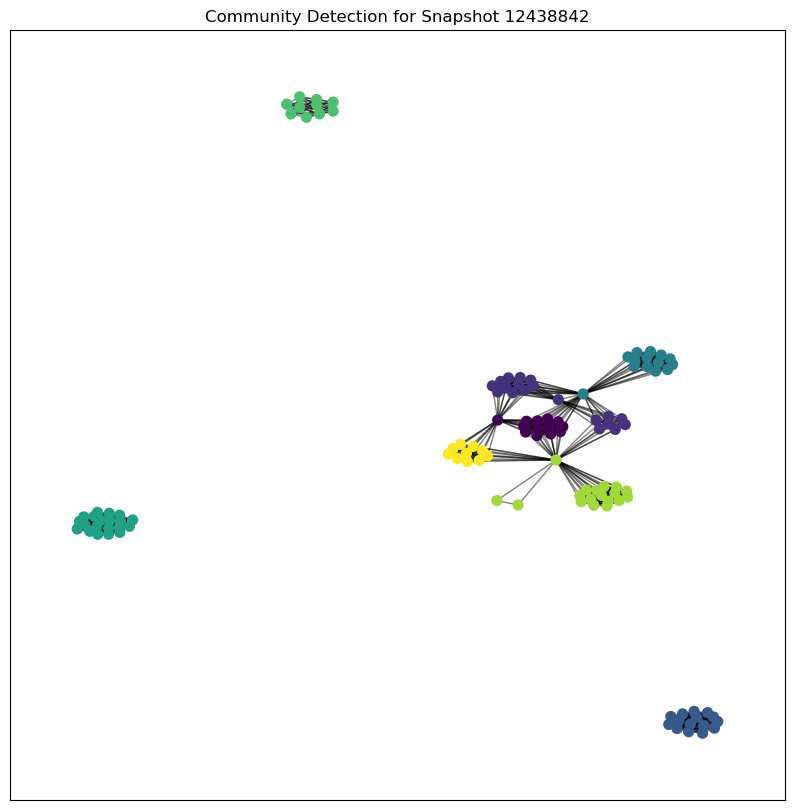

...

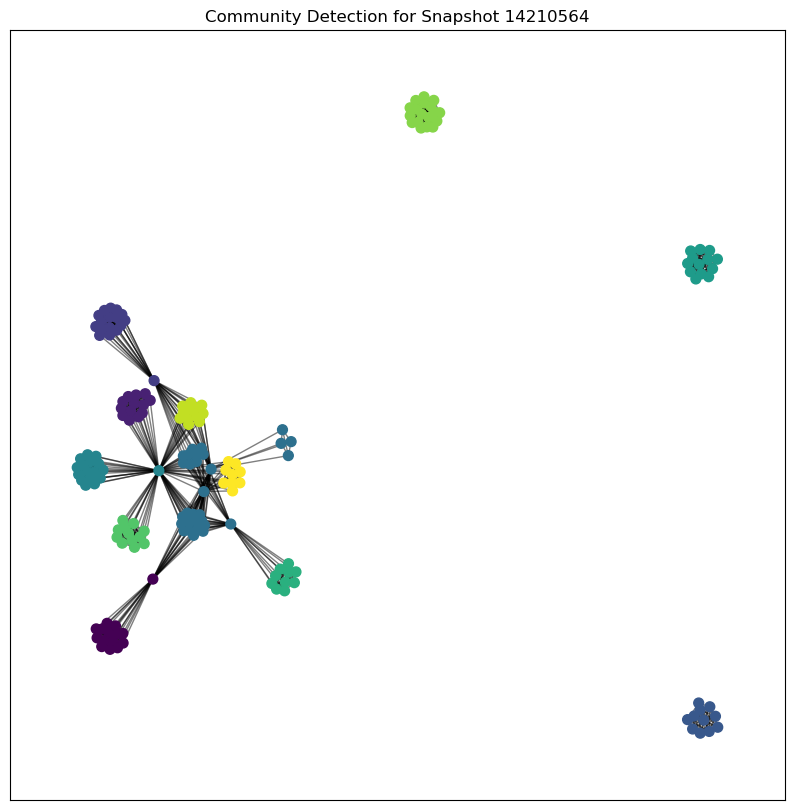

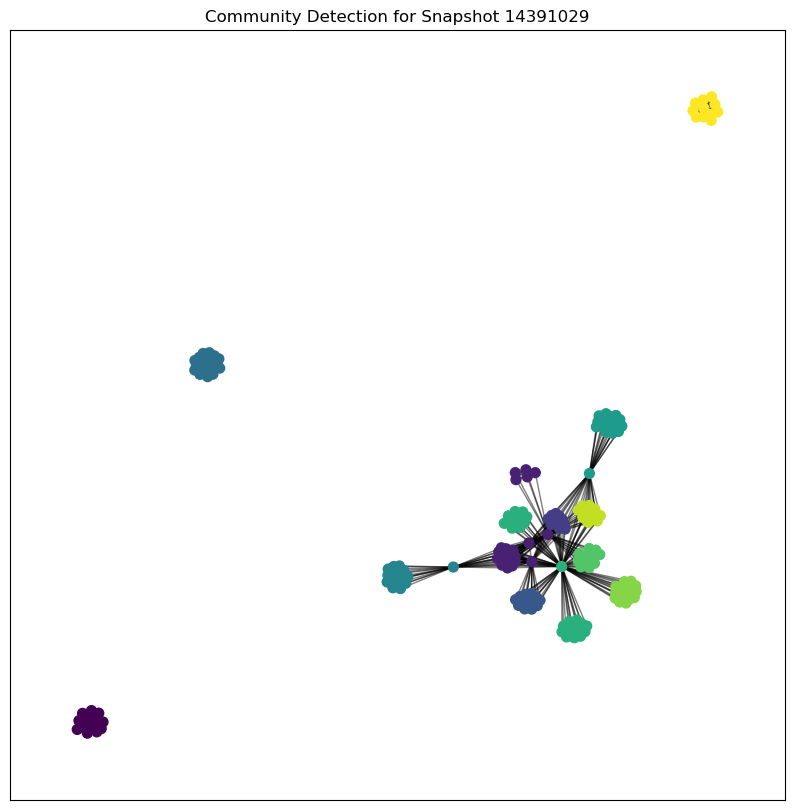

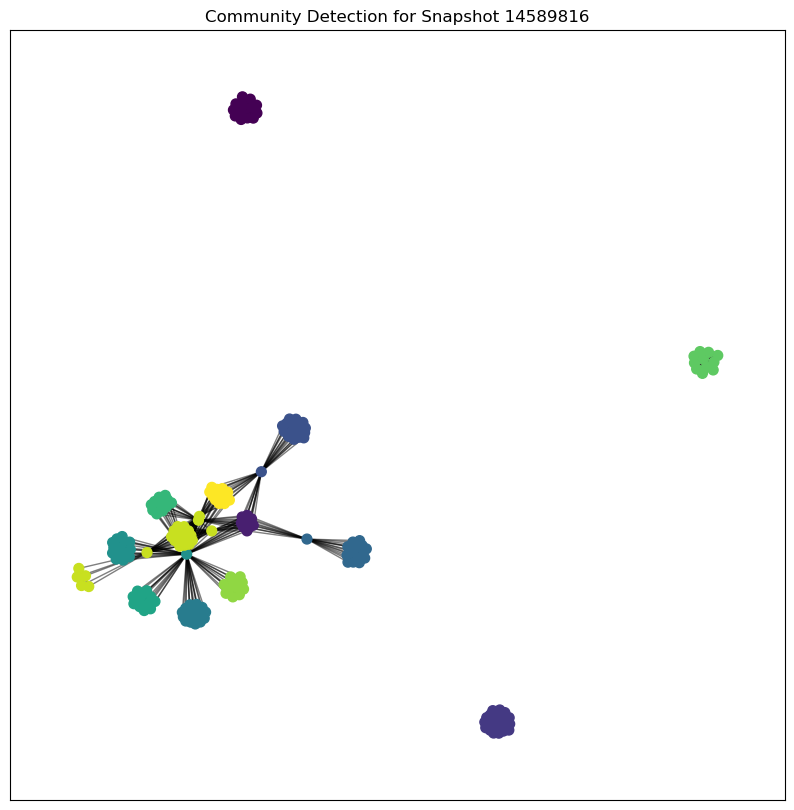

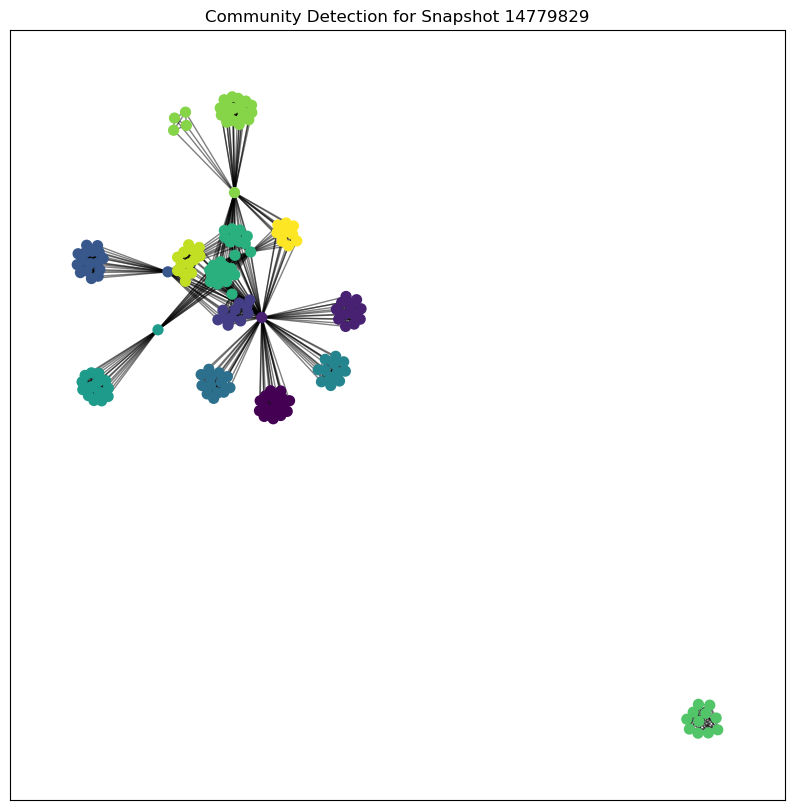

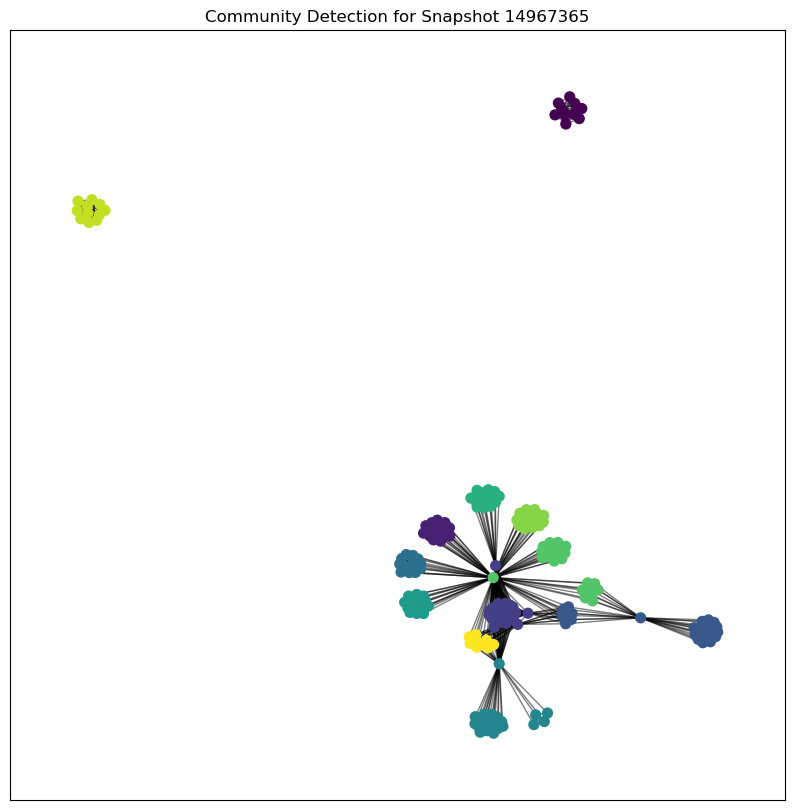


Community Sizes for Snapshot 11659570:

 Community  Number of Nodes
         0                3
         1               17
         2                6
         3               17
         4               19
         5               18
         6               21
         7                8
         8                9
----------------------------------------

Community Sizes for Snapshot 11861210:

 Community  Number of Nodes
         0               20
         1               13
         2               18
         3               22
         4               19
         5               15
         6                7
----------------------------------------

Community Sizes for Snapshot 12043054:

 Community  Number of Nodes
         0               15
         1               19
         2                8
         3               18
         4                8
         5               22
         6                9
         7               17
---------------------------------------

In [34]:
import os
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
import pandas as pd
from os.path import join

# Step 1: Load the Graph Data
def load_graphs(graph_directory):
    graphs = {}
    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            graphs[snapshot_time] = G
    return graphs

# Step 2: Apply Louvain Method for Community Detection
def detect_communities(graphs):
    communities = {}
    for snapshot_time, G in graphs.items():
        partition = community_louvain.best_partition(G)
        communities[snapshot_time] = partition
        # Set the community as an attribute for each node
        nx.set_node_attributes(G, partition, 'community')
    return communities

# Step 3: Visualize the Communities
def visualize_communities(graphs, communities):
    for snapshot_time, G in graphs.items():
        partition = communities[snapshot_time]
        pos = nx.spring_layout(G)
        plt.figure(figsize=(10, 10))
        cmap = plt.get_cmap('viridis')
        nx.draw_networkx_nodes(G, pos, node_size=50, cmap=cmap, node_color=list(partition.values()))
        nx.draw_networkx_edges(G, pos, alpha=0.5)
        plt.title(f"Community Detection for Snapshot {snapshot_time}")
        plt.show()

# Step 4: Print the Community Data in a Clean Table Format
def print_community_data(communities):
    for snapshot_time, partition in communities.items():
        # Prepare data for the table
        community_sizes = pd.Series(partition).value_counts().sort_index()
        community_data = pd.DataFrame({
            'Community': community_sizes.index,
            'Number of Nodes': community_sizes.values
        })
        print(f"\nCommunity Sizes for Snapshot {snapshot_time}:\n")
        print(community_data.to_string(index=False))
        print("-" * 40)

# Step 5: Print Wallet Addresses and Respective Community for Each Snapshot
def print_wallets_and_communities(communities):
    for snapshot_time, partition in communities.items():
        wallet_data = pd.DataFrame({
            'Wallet Address': list(partition.keys()),
            'Community': list(partition.values())
        })
        print(f"\nWallet Addresses and Respective Communities for Snapshot {snapshot_time}:\n")
        print(wallet_data.to_string(index=False))
        print("-" * 40)

# Path setup
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Load the graphs
graphs = load_graphs(graph_directory)

# Detect communities using Louvain method
communities = detect_communities(graphs)

# Visualize the communities
visualize_communities(graphs, communities)

# Print the community data in a clean table format
print_community_data(communities)

# Print wallet addresses and respective communities for each snapshot
print_wallets_and_communities(communities)


In [35]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
from os.path import join

# Step 1: Load the Graph Data
def load_graphs(graph_directory):
    graphs = {}
    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            graphs[snapshot_time] = G
    return graphs

# Step 2: Apply Louvain Method for Community Detection
def detect_communities(graphs):
    communities = {}
    for snapshot_time, G in graphs.items():
        partition = community_louvain.best_partition(G)
        communities[snapshot_time] = partition
        # Set the community as an attribute for each node
        nx.set_node_attributes(G, partition, 'community')
    return communities

# Step 3: Print the Community Data in a Clean Table Format
def print_community_data(communities):
    for snapshot_time, partition in communities.items():
        # Prepare data for the table
        community_sizes = pd.Series(partition).value_counts().sort_index()
        community_data = pd.DataFrame({
            'Community': community_sizes.index,
            'Number of Nodes': community_sizes.values
        })
        print(f"\nCommunity Sizes for Snapshot {snapshot_time}:\n")
        print(community_data.to_string(index=False))
        print("-" * 40)

# Step 4: Print Wallet Addresses and Respective Community for Each Snapshot
def print_wallets_and_communities(communities):
    for snapshot_time, partition in communities.items():
        wallet_data = pd.DataFrame({
            'Wallet Address': list(partition.keys()),
            'Community': list(partition.values())
        })
        print(f"\nWallet Addresses and Respective Communities for Snapshot {snapshot_time}:\n")
        print(wallet_data.to_string(index=False))
        print("-" * 40)

# Path setup
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Load the graphs
graphs = load_graphs(graph_directory)

# Detect communities using Louvain method
communities = detect_communities(graphs)

# Print the community data in a clean table format
print_community_data(communities)

# Print wallet addresses and respective communities for each snapshot
print_wallets_and_communities(communities)



Community Sizes for Snapshot 11659570:

 Community  Number of Nodes
         0                3
         1               17
         2                6
         3               17
         4               19
         5               18
         6               21
         7                8
         8                9
----------------------------------------

Community Sizes for Snapshot 11861210:

 Community  Number of Nodes
         0               20
         1               17
         2               18
         3               22
         4               15
         5               15
         6                7
----------------------------------------

Community Sizes for Snapshot 12043054:

 Community  Number of Nodes
         0               15
         1               19
         2                8
         3               18
         4                8
         5               22
         6                9
         7               17
---------------------------------------

In [38]:
import os
import pandas as pd
from os.path import join

def inspect_csv_columns(token_balance_directory):
    for filename in sorted(os.listdir(token_balance_directory)):
        if filename.endswith('.csv'):
            file_path = join(token_balance_directory, filename)
            df = pd.read_csv(file_path)
            print(f"\nColumns in {filename}:")
            print(df.columns)

# Path setup
token_balance_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/snapshot_token_balance_tables'

# Inspect columns in each CSV file
inspect_csv_columns(token_balance_directory)



Columns in token_holder_snapshot_balance_10070789.csv:
Index(['address', 'token_address', 'value'], dtype='object')

Columns in token_holder_snapshot_balance_10270349.csv:
Index(['address', 'token_address', 'value'], dtype='object')

Columns in token_holder_snapshot_balance_10467362.csv:
Index(['address', 'token_address', 'value'], dtype='object')

Columns in token_holder_snapshot_balance_10664157.csv:
Index(['address', 'token_address', 'value'], dtype='object')

Columns in token_holder_snapshot_balance_10866666.csv:
Index(['address', 'token_address', 'value'], dtype='object')

Columns in token_holder_snapshot_balance_11060222.csv:
Index(['address', 'token_address', 'value'], dtype='object')

Columns in token_holder_snapshot_balance_11262275.csv:
Index(['address', 'token_address', 'value'], dtype='object')

Columns in token_holder_snapshot_balance_11457486.csv:
Index(['address', 'token_address', 'value'], dtype='object')

Columns in token_holder_snapshot_balance_11659570.csv:
Index(['

# Mapping the tokens to the wallets

In [29]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def load_token_name_mapping(token_info_path):
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    return df_tokens.set_index('address')['name'].to_dict()

def load_snapshot_token_data(snapshot_token_folder, snapshot_time):
    token_data_path = join(snapshot_token_folder, f'snapshot_token_balance_{snapshot_time}.csv')

    if os.path.exists(token_data_path):
        df_token_data = pd.read_csv(token_data_path)
        df_token_data['address'] = df_token_data['address'].str.lower()
        df_token_data['token_address'] = df_token_data['token_address'].str.lower()
        return df_token_data
    return None

def generate_community_token_statistics(graph_directory, token_info_path, snapshot_token_folder, output_directory):
    token_map = load_token_name_mapping(token_info_path)
    community_token_stats = []
    
    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)
            
            # Perform community detection
            partition = community_louvain.best_partition(G)
            nx.set_node_attributes(G, partition, 'community')

            # Load the corresponding token data for the snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_token_data = load_snapshot_token_data(snapshot_token_folder, snapshot_time)

            if snapshot_token_data is not None:
                # Map token names to communities
                community_stats = defaultdict(lambda: defaultdict(int))
                for node, data in G.nodes(data=True):
                    wallet_address = data.get('address', '').lower()
                    community = data['community']
                    token_info = snapshot_token_data[snapshot_token_data['address'] == wallet_address]

                    for _, token_row in token_info.iterrows():
                        token_name = token_map.get(token_row['token_address'], 'Unknown Token')
                        community_stats[community][token_name] += 1

                # Format data for this graph into a list of dictionaries
                for community, tokens in community_stats.items():
                    for token_name, count in tokens.items():
                        community_token_stats.append({
                            'Snapshot': snapshot_time,
                            'Community': community,
                            'Token Name': token_name,
                            'Count': count
                        })

    # Convert to DataFrame
    community_token_stats_df = pd.DataFrame(community_token_stats)

    # Save to CSV
    output_file = join(output_directory, 'community_token_statistics.csv')
    community_token_stats_df.to_csv(output_file, index=False)

    print(f"Community token statistics saved to {output_file}")
    return community_token_stats_df

# Example Usage
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
snapshot_token_folder = join(data_directory, 'snapshot_token_balance_tables')
token_info_path = join(data_directory, 'final_token_selection.csv')
output_directory = data_directory  # Specify where you want to save the CSV file

# Generate and save community token statistics
community_token_stats_df = generate_community_token_statistics(graph_directory, token_info_path, snapshot_token_folder, output_directory)




Community token statistics saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/community_token_statistics.csv


In [ ]:
# Assuming validated_wallet_projection_graphs_enriched is a DataFrame with columns ['wallet_address', 'token_name']

# Merge the community information with the enriched dataset
merged_df = pd.merge(community_df, validated_wallet_projection_graphs_enriched, on='wallet_address', how='inner')

# Display the enriched community data
print(merged_df.head())


In [ ]:
# Old

In [12]:
import os
import pandas as pd

# Paths
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
token_info_path = os.path.join(data_directory, 'final_token_selection.csv')
snapshot_directory = os.path.join(data_directory, 'snapshot_token_balance_tables')

# Known burner addresses
known_burner_addresses = [
    '0x0000000000000000000000000000000000000000',
    '0x0000000000000000000000000000000000000001',
    '0x0000000000000000000000000000000000000002',
    '0x0000000000000000000000000000000000000003',
    '0x0000000000000000000000000000000000000004',
    '0x0000000000000000000000000000000000000005',
    '0x0000000000000000000000000000000000000006',
    '0x0000000000000000000000000000000000000007',
    '0x000000000000000000000000000000000000dead'
]

# Load the token mapping for reference
df_tokens = pd.read_csv(token_info_path)
df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
token_map = df_tokens.set_index('address')['name'].to_dict()

# Function to process a single snapshot file and include token names
def process_snapshot_file(snapshot_file):
    snapshot_path = os.path.join(snapshot_directory, snapshot_file)
    df_snapshot = pd.read_csv(snapshot_path, usecols=['address', 'token_address'])
    
    # Normalize addresses for consistent mapping
    df_snapshot['address'] = df_snapshot['address'].str.lower()
    df_snapshot['token_address'] = df_snapshot['token_address'].str.lower()

    # Remove known burner addresses
    df_snapshot = df_snapshot[~df_snapshot['address'].isin(known_burner_addresses)]

    # Map token names to the snapshot data
    df_snapshot['token_name'] = df_snapshot['token_address'].map(token_map)

    # Only keep rows where the token name is known
    df_snapshot = df_snapshot.dropna(subset=['token_name'])

    # Return the processed DataFrame
    return df_snapshot[['address', 'token_name']]

# Process all snapshot files in the directory
all_snapshot_files = [f for f in os.listdir(snapshot_directory) if f.endswith('.csv')]

# Initialize an empty DataFrame to store the results
all_wallets_tokens = pd.DataFrame()

for snapshot_file in all_snapshot_files:
    df_result = process_snapshot_file(snapshot_file)
    all_wallets_tokens = pd.concat([all_wallets_tokens, df_result], ignore_index=True)

# Print the first 100 rows of the DataFrame to verify
print(all_wallets_tokens.head(100))

# Optionally, save the DataFrame to a CSV file
output_data_path = os.path.join(data_directory, 'output_wallets_tokens.csv')
all_wallets_tokens.to_csv(output_data_path, index=False)

print(f"Data saved to {output_data_path}")



                                       address     token_name
0   0x000000000000000000000000000000000000000f           Aave
1   0x0000000000000000000000000000000000000ad3          Maker
2   0x0000000000000000000000000000000000001337        Uniswap
3   0x0000000000000000000000000000000000021b22        Uniswap
4   0x0000000000000000000000000000000000080085        Uniswap
..                                         ...            ...
95  0x000000000000740a22fa209cf6806d38f7605385  Yearn Finance
96  0x000000000000740a22fa209cf6806d38f7605385        Uniswap
97  0x000000000000740a22fa209cf6806d38f7605385          Sushi
98  0x000000000000740a22fa209cf6806d38f7605385       Compound
99  0x000000000000740a22fa209cf6806d38f7605385          Curve

[100 rows x 2 columns]
Data saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/output_wallets_tokens.csv


In [15]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd
import time

# Paths
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = os.path.join(data_directory, 'validated_wallet_projection_graphs')
token_info_path = os.path.join(data_directory, 'final_token_selection.csv')
snapshot_token_folder = os.path.join(data_directory, 'snapshot_token_balance_tables')

# Mapping of block heights to dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load the token mapping for reference
print("Loading token information...")
df_tokens = pd.read_csv(token_info_path)
df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
token_map = df_tokens.set_index('address')['name'].to_dict()
print(f"Loaded {len(token_map)} tokens.")

# Function to perform community detection and map tokens
def analyze_communities_and_tokens(graph_file, snapshot_id):
    print(f"Processing graph file: {graph_file} (Snapshot ID: {snapshot_id})")
    start_time = time.time()

    # Load the graph
    try:
        G = nx.read_graphml(os.path.join(graph_directory, graph_file))
        print(f"Loaded graph with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")
    except Exception as e:
        print(f"Error loading graph file {graph_file}: {e}")
        return {}

    # Apply Louvain community detection
    partition = community_louvain.best_partition(G)

    # Prepare to track tokens in each community
    community_tokens = {}

    # Map wallets to communities and collect tokens
    for node, community_id in partition.items():
        wallet_address = node.lower()

        if community_id not in community_tokens:
            community_tokens[community_id] = []

        # Load corresponding snapshot token file and match wallet to tokens
        snapshot_file = f'token_holder_snapshot_balance_{snapshot_id}.csv'
        snapshot_path = os.path.join(snapshot_token_folder, snapshot_file)
        try:
            df_snapshot = pd.read_csv(snapshot_path, usecols=['address', 'token_address'])
            df_snapshot['address'] = df_snapshot['address'].str.lower()
            df_snapshot['token_address'] = df_snapshot['token_address'].str.lower()

            # Find tokens for the current wallet
            wallet_tokens = df_snapshot[df_snapshot['address'] == wallet_address]['token_address'].tolist()
        except Exception as e:
            print(f"Error processing snapshot file {snapshot_file}: {e}")
            wallet_tokens = []

        # Map token addresses to token names and add to community's token list
        for token_address in wallet_tokens:
            token_name = token_map.get(token_address, 'Unknown Token')
            community_tokens[community_id].append(token_name)

    print(f"Processed {len(partition)} nodes in {time.time() - start_time:.2f} seconds.")
    return community_tokens

# Process each graph file in order
all_graph_files = sorted([f for f in os.listdir(graph_directory) if f.endswith('.graphml')])

# Initialize a list to store the results
all_community_tokens = []

for graph_file in all_graph_files:
    snapshot_id = graph_file.split('_')[-1].replace('.graphml', '')
    community_tokens = analyze_communities_and_tokens(graph_file, snapshot_id)

    # Retrieve the date associated with the snapshot
    snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

    for community_id, tokens in community_tokens.items():
        token_counts = pd.Series(tokens).value_counts().to_dict()
        for token_name, count in token_counts.items():
            all_community_tokens.append({
                'Snapshot': snapshot_id,
                'Date': snapshot_date,
                'Community': community_id,
                'Token Name': token_name,
                'Count': count
            })

# Convert the list to a DataFrame
all_community_tokens_df = pd.DataFrame(all_community_tokens)

# Print the results for verification
print(all_community_tokens_df.head(100))

# Optionally, save to a CSV file
output_data_path = os.path.join(data_directory, 'community_token_distribution_with_dates.csv')
all_community_tokens_df.to_csv(output_data_path, index=False)

print(f"Token distribution data saved to {output_data_path}")


Loading token information...
Loaded 15 tokens.
Processing graph file: validated_wallet_projection_graph_11659570.graphml (Snapshot ID: 11659570)
Loaded graph with 118 nodes and 883 edges.
Processed 118 nodes in 225.78 seconds.
Processing graph file: validated_wallet_projection_graph_11861210.graphml (Snapshot ID: 11861210)
Loaded graph with 114 nodes and 817 edges.
Processed 114 nodes in 267.07 seconds.
Processing graph file: validated_wallet_projection_graph_12043054.graphml (Snapshot ID: 12043054)
Loaded graph with 116 nodes and 864 edges.
Processed 116 nodes in 305.91 seconds.
Processing graph file: validated_wallet_projection_graph_12244515.graphml (Snapshot ID: 12244515)
Loaded graph with 114 nodes and 831 edges.
Processed 114 nodes in 318.66 seconds.
Processing graph file: validated_wallet_projection_graph_12438842.graphml (Snapshot ID: 12438842)
Loaded graph with 119 nodes and 852 edges.
Processed 119 nodes in 354.89 seconds.
Processing graph file: validated_wallet_projection_gr

In [16]:
# Mannual check

In [17]:
import networkx as nx
graph = nx.read_graphml('/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_12831436.graphml')
print(graph.nodes())


['0x0ec9e8aa56e0425b60dee347c8efbad959579d0f', '0xb045fa6893b26807298e93377cbb92d7f37b19eb', '0x09f82ccd6bae2aebe46ba7dd2cf08d87355ac430', '0x1597d19659f3de52abd475f7d2314dcca29359bd', '0x2a7d59e327759acd5d11a8fb652bf4072d28ac04', '0x41df5d28c7e801c4df0ab33421e2ed6ce52d2567', '0x3e40d73eb977dc6a537af587d48316fee66e9c8c', '0xfea88380baff95e85305419eb97247981b1a8eee', '0x3eea42927d1ef20843b7127af6582313f558e22d', '0xc4a1fc26d92f78bd2c8c173ce06bc3c6970cbbf0', '0x0f50d31b3eaefd65236dd3736b863cffa4c63c4e', '0x3d9819210a31b4961b30ef54be2aed79b9c9cd3b', '0xba540205a5bb53e648e994be815a3a55d8367da2', '0xac838332afc2937fded89c16a59b2ed8e8e2743c', '0x34112c83e77a3234f2ce320b05f758f9b17f93c8', '0x1f3813fe7ace2a33585f1438215c7f42832fb7b3', '0x317625234562b1526ea2fac4030ea499c5291de4', '0x4da27a545c0c5b758a6ba100e3a049001de870f5', '0x0f89d54b02ca570de82f770d33c7b7cf7b3c3394', '0x583f6878eccbcf41d5126938647dc74fcce34e31', '0x40ec5b33f54e0e8a33a975908c5ba1c14e5bbbdf', '0x47ac0fb4f2d84898e4d9e7b4dab3c2

In [18]:
import community as community_louvain
partition = community_louvain.best_partition(graph)
print(partition)


{'0x0ec9e8aa56e0425b60dee347c8efbad959579d0f': 0, '0xb045fa6893b26807298e93377cbb92d7f37b19eb': 0, '0x09f82ccd6bae2aebe46ba7dd2cf08d87355ac430': 1, '0x1597d19659f3de52abd475f7d2314dcca29359bd': 1, '0x2a7d59e327759acd5d11a8fb652bf4072d28ac04': 2, '0x41df5d28c7e801c4df0ab33421e2ed6ce52d2567': 2, '0x3e40d73eb977dc6a537af587d48316fee66e9c8c': 1, '0xfea88380baff95e85305419eb97247981b1a8eee': 1, '0x3eea42927d1ef20843b7127af6582313f558e22d': 3, '0xc4a1fc26d92f78bd2c8c173ce06bc3c6970cbbf0': 3, '0x0f50d31b3eaefd65236dd3736b863cffa4c63c4e': 4, '0x3d9819210a31b4961b30ef54be2aed79b9c9cd3b': 4, '0xba540205a5bb53e648e994be815a3a55d8367da2': 3, '0xac838332afc2937fded89c16a59b2ed8e8e2743c': 3, '0x34112c83e77a3234f2ce320b05f758f9b17f93c8': 4, '0x1f3813fe7ace2a33585f1438215c7f42832fb7b3': 1, '0x317625234562b1526ea2fac4030ea499c5291de4': 6, '0x4da27a545c0c5b758a6ba100e3a049001de870f5': 6, '0x0f89d54b02ca570de82f770d33c7b7cf7b3c3394': 1, '0x583f6878eccbcf41d5126938647dc74fcce34e31': 3, '0x40ec5b33f54e0e8a

In [19]:
# Consistency Check Across Snapshots
snapshot_data = all_community_tokens_df[all_community_tokens_df['Snapshot'] == '11659570']
print(snapshot_data.head(10))
# Verify that the same addresses appear in similar communities in snapshot 11861210
snapshot_data_next = all_community_tokens_df[all_community_tokens_df['Snapshot'] == '11861210']
print(snapshot_data_next.head(10))


   Snapshot     Date  Community     Token Name  Count
0  11659570  2021-06          0  Yearn Finance     14
1  11659570  2021-06          0          Sushi     10
2  11659570  2021-06          0        Uniswap      8
3  11659570  2021-06          0          Maker      8
4  11659570  2021-06          0       Balancer      7
5  11659570  2021-06          0       Compound      7
6  11659570  2021-06          0          Curve      6
7  11659570  2021-06          0          1Inch      5
8  11659570  2021-06          0           Aave      5
9  11659570  2021-06          0  Unknown Token      4
    Snapshot     Date  Community     Token Name  Count
46  11861210  2021-07          0          Maker     20
47  11861210  2021-07          0  Yearn Finance      2
48  11861210  2021-07          0        Uniswap      2
49  11861210  2021-07          0           Aave      2
50  11861210  2021-07          0  Unknown Token      1
51  11861210  2021-07          0          Sushi      1
52  11861210  2021-07

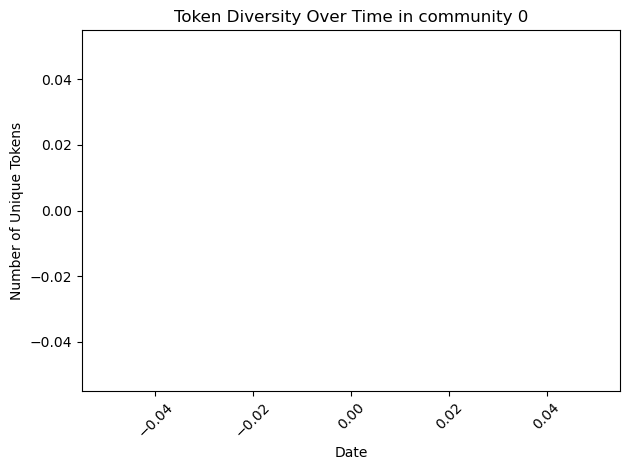

In [25]:
import matplotlib.pyplot as plt

# Select the data for the specified community
community = 'Community 0'  # example
community_data = all_community_tokens_df[all_community_tokens_df['Community'] == community]

# Group by 'Date' and count the unique 'Token Name'
unique_tokens_per_date = community_data.groupby('Date')['Token Name'].nunique()

# Plot the data
plt.plot(unique_tokens_per_date.index, unique_tokens_per_date.values)
plt.title(f"Token Diversity Over Time in {community}")
plt.xlabel('Date')
plt.ylabel('Number of Unique Tokens')
plt.xticks(rotation=45)  # Rotate date labels for better readability if necessary
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


In [24]:
print(community_data.head())
print(community_data.shape)


Empty DataFrame
Columns: [Snapshot, Date, Community, Token Name, Count]
Index: []
(0, 5)


In [21]:
snapshot_summary = all_community_tokens_df.groupby(['Snapshot', 'Community']).agg({
    'Token Name': 'nunique',
    'Count': 'sum'
}).reset_index()
print(snapshot_summary.head())


   Snapshot  Community  Token Name  Count
0  11659570          0          10     74
1  11659570          1           4     24
2  11659570          2           6     11
3  11659570          3          10     26
4  11659570          4           1      3


In [ ]:
# If still unsure check mannually.

In [ ]:
import os
import networkx as nx
import community as community_louvain
import pandas as pd

# Paths
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = os.path.join(data_directory, 'validated_wallet_projection_graphs')
token_info_path = os.path.join(data_directory, 'final_token_selection.csv')
snapshot_token_folder = os.path.join(data_directory, 'snapshot_token_balance_tables')

# Example mapping of block heights to dates (you would need a complete mapping)
block_height_to_date = {
    '11659570': '2021-01-01',
    '11861210': '2021-02-01',
    # Add more mappings as needed
    '14967365': '2022-12-01'
}

# Load the token mapping for reference
df_tokens = pd.read_csv(token_info_path)
df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
token_map = df_tokens.set_index('address')['name'].to_dict()

# Function to perform community detection and map tokens
def analyze_communities_and_tokens(graph_file, snapshot_id):
    # Load the graph
    G = nx.read_graphml(os.path.join(graph_directory, graph_file))

    # Apply Louvain community detection
    partition = community_louvain.best_partition(G)

    # Prepare to track tokens in each community
    community_tokens = {}

    # Map wallets to communities and collect tokens
    for node, community_id in partition.items():
        wallet_address = node.lower()

        if community_id not in community_tokens:
            community_tokens[community_id] = []

        # Load corresponding snapshot token file and match wallet to tokens
        snapshot_file = f'token_holder_snapshot_balance_{snapshot_id}.csv'
        snapshot_path = os.path.join(snapshot_token_folder, snapshot_file)
        df_snapshot = pd.read_csv(snapshot_path, usecols=['address', 'token_address'])
        df_snapshot['address'] = df_snapshot['address'].str.lower()
        df_snapshot['token_address'] = df_snapshot['token_address'].str.lower()

        # Find tokens for the current wallet
        wallet_tokens = df_snapshot[df_snapshot['address'] == wallet_address]['token_address'].tolist()

        # Map token addresses to token names and add to community's token list
        for token_address in wallet_tokens:
            token_name = token_map.get(token_address, 'Unknown Token')
            community_tokens[community_id].append(token_name)

    return community_tokens

# Process each graph file in order
all_graph_files = sorted([f for f in os.listdir(graph_directory) if f.endswith('.graphml')])

# Store results in a DataFrame
all_community_tokens = pd.DataFrame()

for graph_file in all_graph_files:
    snapshot_id = graph_file.split('_')[-1].replace('.graphml', '')
    community_tokens = analyze_communities_and_tokens(graph_file, snapshot_id)

    # Retrieve the date associated with the snapshot
    snapshot_date = block_height_to_date.get(snapshot_id, 'Unknown Date')

    for community_id, tokens in community_tokens.items():
        token_counts = pd.Series(tokens).value_counts().to_dict()
        for token_name, count in token_counts.items():
            all_community_tokens = all_community_tokens.append({
                'Snapshot': snapshot_id,
                'Date': snapshot_date,
                'Community': community_id,
                'Token Name': token_name,
                'Count': count
            }, ignore_index=True)

# Print the results for verification
print(all_community_tokens.head(100))

# Optionally, save to a CSV file
output_data_path = os.path.join(data_directory, 'community_token_distribution_with_dates.csv')
all_community_tokens.to_csv(output_data_path, index=False)


# Token distribution statistics

In [11]:


import os
import pandas as pd
import networkx as nx
from community import community_louvain

# Paths
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = os.path.join(data_directory, 'validated_wallet_projection_graphs')
token_info_path = os.path.join(data_directory, 'final_token_selection.csv')
snapshot_token_folder = os.path.join(data_directory, 'snapshot_token_balance_tables')

# Load the token mapping for reference
df_tokens = pd.read_csv(token_info_path)
df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
token_map = df_tokens.set_index('address')['name'].to_dict()

# Function to analyze token distribution per community
def analyze_communities(graph_file):
    # Load the graph
    G = nx.read_graphml(os.path.join(graph_directory, graph_file))

    # Apply the Louvain method for community detection
    partition = community_louvain.best_partition(G)

    # Add community information to the graph nodes
    nx.set_node_attributes(G, partition, 'community')

    # Prepare a dictionary to track token distribution in each community
    community_tokens = {}

    # Process each wallet node in the graph
    for node, data in G.nodes(data=True):
        wallet_address = node.lower()  # Normalize the wallet address
        community_id = data['community']

        # Initialize community entry if it doesn't exist
        if community_id not in community_tokens:
            community_tokens[community_id] = []

        # Map wallet to tokens using the corresponding snapshot data
        for snapshot_file in os.listdir(snapshot_token_folder):
            if snapshot_file.endswith('.csv'):
                snapshot_path = os.path.join(snapshot_token_folder, snapshot_file)
                df_snapshot = pd.read_csv(snapshot_path, usecols=['address', 'token_address'])
                df_snapshot['address'] = df_snapshot['address'].str.lower()  # Normalize addresses
                df_snapshot['token_address'] = df_snapshot['token_address'].str.lower()  # Normalize token addresses

                # Find tokens for the current wallet
                tokens = df_snapshot[df_snapshot['address'] == wallet_address]['token_address'].tolist()

                # Map token addresses to token names and add to the community's token list
                for token_address in tokens:
                    token_name = token_map.get(token_address, 'Unknown Token')
                    community_tokens[community_id].append(token_name)

    # Convert the community tokens to a DataFrame
    community_token_df = []
    for community_id, tokens in community_tokens.items():
        token_counts = pd.Series(tokens).value_counts().to_dict()  # Count occurrences of each token
        for token_name, count in token_counts.items():
            community_token_df.append({
                'Community': community_id,
                'Token Name': token_name,
                'Count': count
            })

    return pd.DataFrame(community_token_df)

# Process all graph files in the directory in order
all_graph_files = sorted([f for f in os.listdir(graph_directory) if f.endswith('.graphml')])

# Initialize an empty DataFrame to store the results
all_token_distribution = pd.DataFrame()

for graph_file in all_graph_files:
    token_distribution_df = analyze_communities(graph_file)
    snapshot_id = graph_file.split('_')[-1].replace('.graphml', '')
    token_distribution_df['Snapshot'] = snapshot_id
    all_token_distribution = pd.concat([all_token_distribution, token_distribution_df], ignore_index=True)

# Print the aggregated token distribution statistics
print(all_token_distribution.head(100))

# Optionally, save the aggregated DataFrame to a CSV file
output_data_path = os.path.join(data_directory, 'community_token_distribution.csv')
all_token_distribution.to_csv(output_data_path, index=False)

print(f"Token distribution data saved to {output_data_path}")

ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

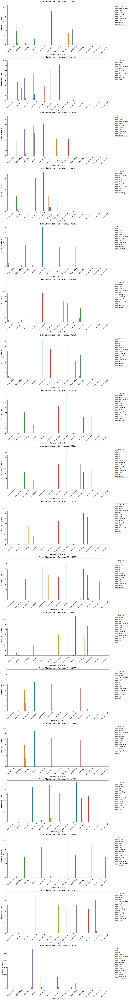

In [53]:
import os
import networkx as nx
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from os.path import join
from collections import defaultdict

def generate_token_name_statistics(graph_directory, token_info_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_token_stats = []
    previous_communities = None

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Set the community labels in the graph
            nx.set_node_attributes(G, partition, 'community')

            # Compile token statistics per community
            community_stats = defaultdict(lambda: defaultdict(int))
            for node, data in G.nodes(data=True):
                community = data['community']
                token_address = data.get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')
                community_stats[community][token_name] += 1

            # Format data for this graph into a list of dictionaries
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for community, tokens in community_stats.items():
                for token_name, count in tokens.items():
                    community_token_stats.append({
                        'Snapshot': snapshot_time,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

            # Update previous_communities for the next iteration
            previous_communities = partition

    # Convert to DataFrame for better display and analysis
    return pd.DataFrame(community_token_stats)

def visualize_token_statistics_over_time(community_token_stats):
    # Ensure that the DataFrame has the correct data types
    community_token_stats['Count'] = community_token_stats['Count'].astype(int)
    community_token_stats['Community'] = community_token_stats['Community'].astype(int)

    # Define a consistent color palette for tokens
    unique_tokens = sorted(community_token_stats['Token Name'].unique())
    palette = sns.color_palette("tab10", len(unique_tokens))
    token_palette = dict(zip(unique_tokens, palette))

    # Get all unique community labels
    all_communities = sorted(community_token_stats['Community'].unique())

    # Set up the grid of plots, one per snapshot
    snapshots = community_token_stats['Snapshot'].unique()
    num_snapshots = len(snapshots)
    fig, axes = plt.subplots(num_snapshots, 1, figsize=(14, 6 * num_snapshots))

    if num_snapshots == 1:
        axes = [axes]  # Ensure axes is iterable

    for i, snapshot in enumerate(snapshots):
        snapshot_data = community_token_stats[community_token_stats['Snapshot'] == snapshot]

        sns.barplot(data=snapshot_data, x='Community', y='Count', hue='Token Name', ax=axes[i], 
                    palette=token_palette, order=all_communities)

        # Set the x-ticks to be the community labels centered under the bars
        axes[i].set_xticks(range(len(all_communities)))
        axes[i].set_xticklabels([f"Community {community}" for community in all_communities], fontsize=10)

        # Improve labeling
        axes[i].set_title(f'Token Distribution in Snapshot {snapshot}', fontsize=14)
        axes[i].set_xlabel('Community (0 to X)', fontsize=12)
        axes[i].set_ylabel('Number of Tokens', fontsize=12)
        axes[i].legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
        axes[i].tick_params(axis='x', rotation=45)

        # Adjust the layout to prevent overlap
        plt.subplots_adjust(right=0.85)

    plt.tight_layout()
    plt.show()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
token_info_path = join(data_directory, 'final_token_selection.csv')

# Generate token name statistics
community_token_name_stats = generate_token_name_statistics(graph_directory, token_info_path)

# Visualize the token statistics over time
visualize_token_statistics_over_time(community_token_name_stats)


In [16]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def generate_detailed_statistics(graph_directory, token_info_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    # Data structures to hold statistics
    wallet_stats = defaultdict(lambda: defaultdict(int))
    token_stats = defaultdict(int)
    community_stats = defaultdict(lambda: defaultdict(int))

    previous_communities = None  # No global community mapping

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Directly use the partition without global mapping or matching communities
            nx.set_node_attributes(G, partition, 'community')

            # Collect statistics
            for node, data in G.nodes(data=True):
                wallet = node
                community = data['community']
                token_address = data.get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')

                # Update wallet statistics
                wallet_stats[wallet]['Community'] = community
                wallet_stats[wallet][token_name] += 1

                # Update token statistics
                token_stats[token_name] += 1

                # Update community statistics
                community_stats[community]['Size'] += 1
                community_stats[community][token_name] += 1

            # Update previous_communities for the next iteration
            previous_communities = partition  # Update directly with the partition

    # Convert statistics to DataFrames for better analysis
    wallet_df = pd.DataFrame(wallet_stats).T.reset_index().rename(columns={'index': 'Wallet'})
    token_df = pd.DataFrame(list(token_stats.items()), columns=['Token Name', 'Count'])
    community_df = pd.DataFrame(community_stats).T.reset_index().rename(columns={'index': 'Community'})

    return wallet_df, token_df, community_df

def save_statistics(wallet_df, token_df, community_df, output_directory):
    wallet_df.to_csv(join(output_directory, 'wallet_statistics.csv'), index=False)
    token_df.to_csv(join(output_directory, 'token_statistics.csv'), index=False)
    community_df.to_csv(join(output_directory, 'community_statistics.csv'), index=False)

    print(f"Statistics saved to {output_directory}")

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
token_info_path = join(data_directory, 'final_token_selection.csv')
output_directory = join(data_directory, 'statistics_output')

# Generate detailed statistics
wallet_df, token_df, community_df = generate_detailed_statistics(graph_directory, token_info_path)

# Save the statistics to CSV files
save_statistics(wallet_df, token_df, community_df, output_directory)


Statistics saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output


In [17]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def generate_detailed_statistics_by_snapshot(graph_directory, token_info_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    previous_communities = None  # Removed global_community_map

    all_snapshot_stats = {}

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Directly use the partition without global mapping
            nx.set_node_attributes(G, partition, 'community')

            # Initialize data structures to hold statistics for this snapshot
            wallet_stats = defaultdict(lambda: defaultdict(int))
            token_stats = defaultdict(int)
            community_stats = defaultdict(lambda: defaultdict(int))

            # Collect statistics
            for node, data in G.nodes(data=True):
                wallet = node
                community = data['community']
                token_address = data.get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')

                # Update wallet statistics
                wallet_stats[wallet]['Community'] = community
                wallet_stats[wallet][token_name] += 1

                # Update token statistics
                token_stats[token_name] += 1

                # Update community statistics
                community_stats[community]['Size'] += 1
                community_stats[community][token_name] += 1

            # Convert statistics to DataFrames for better analysis
            wallet_df = pd.DataFrame(wallet_stats).T.reset_index().rename(columns={'index': 'Wallet'})
            token_df = pd.DataFrame(list(token_stats.items()), columns=['Token Name', 'Count'])
            community_df = pd.DataFrame(community_stats).T.reset_index().rename(columns={'index': 'Community'})

            # Store the statistics for this snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            all_snapshot_stats[snapshot_time] = {
                'wallet_df': wallet_df,
                'token_df': token_df,
                'community_df': community_df
            }

            # Update previous_communities for the next iteration
            previous_communities = partition  # Update directly with the partition

    return all_snapshot_stats

def save_snapshot_statistics(all_snapshot_stats, output_directory):
    for snapshot_time, stats in all_snapshot_stats.items():
        wallet_df = stats['wallet_df']
        token_df = stats['token_df']
        community_df = stats['community_df']

        # Save each DataFrame as a CSV file
        wallet_df.to_csv(join(output_directory, f'wallet_statistics_{snapshot_time}.csv'), index=False)
        token_df.to_csv(join(output_directory, f'token_statistics_{snapshot_time}.csv'), index=False)
        community_df.to_csv(join(output_directory, f'community_statistics_{snapshot_time}.csv'), index=False)

        print(f"Statistics for snapshot {snapshot_time} saved to {output_directory}")

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
token_info_path = join(data_directory, 'final_token_selection.csv')
output_directory = join(data_directory, 'statistics_output')

# Generate detailed statistics by snapshot
all_snapshot_stats = generate_detailed_statistics_by_snapshot(graph_directory, token_info_path)

# Save the snapshot statistics to CSV files
save_snapshot_statistics(all_snapshot_stats, output_directory)



Statistics for snapshot 11659570 saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output
Statistics for snapshot 11861210 saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output
Statistics for snapshot 12043054 saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output
Statistics for snapshot 12244515 saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output
Statistics for snapshot 12438842 saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output
Statistics for snapshot 12638919 saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output
Statistics for snapshot 12831436 saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output
Statistics for snapshot 13029639 saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output
Statistics for snapshot 13230157 saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output
Statistics for snapshot 13422506 saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statisti

# Louvain method doesnt detect overlapping communities

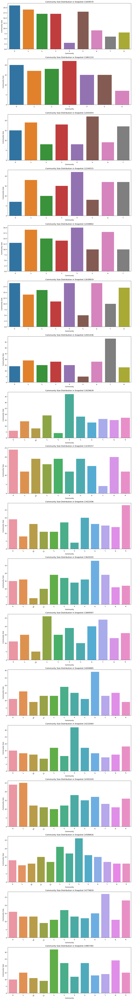

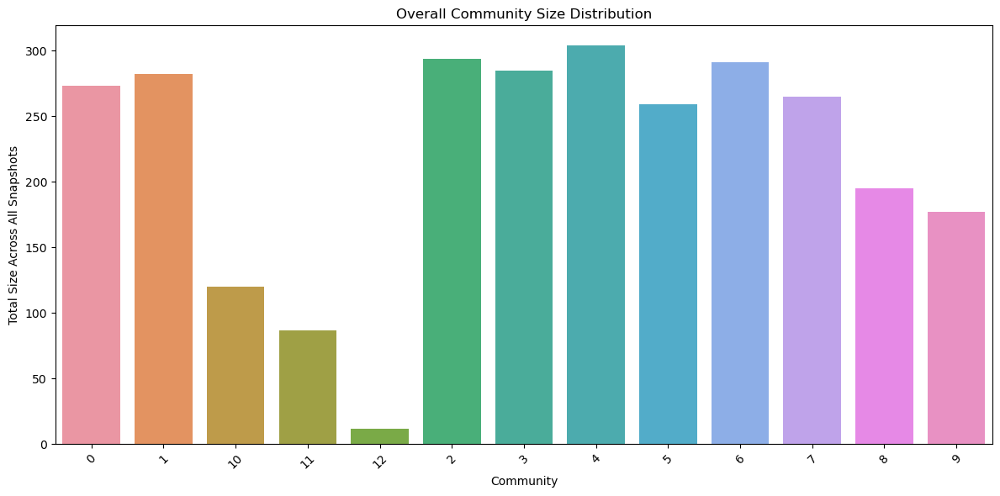

In [18]:
import os
import networkx as nx
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from os.path import join
from collections import defaultdict

def generate_token_and_community_size_statistics(graph_directory, token_info_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_token_stats = []
    community_size_stats = []
    previous_communities = None  # Removed global_community_map

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Directly use the partition without global mapping
            nx.set_node_attributes(G, partition, 'community')

            # Compile token statistics per community
            community_stats = defaultdict(lambda: defaultdict(int))
            community_sizes = defaultdict(int)
            for node, data in G.nodes(data=True):
                community = data['community']
                token_address = data.get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')

                community_stats[community][token_name] += 1
                community_sizes[community] += 1

            # Format data for this graph into a list of dictionaries
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for community, tokens in community_stats.items():
                for token_name, count in tokens.items():
                    community_token_stats.append({
                        'Snapshot': snapshot_time,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })
            
            for community, size in community_sizes.items():
                community_size_stats.append({
                    'Snapshot': snapshot_time,
                    'Community': community,
                    'Size': size
                })

            # Update previous_communities for the next iteration
            previous_communities = partition  # Update directly with the partition

    # Convert to DataFrames for better display and analysis
    community_token_stats_df = pd.DataFrame(community_token_stats)
    community_size_stats_df = pd.DataFrame(community_size_stats)

    return community_token_stats_df, community_size_stats_df

def visualize_community_size_distribution_over_time(community_size_stats_df):
    # Ensure the DataFrame has the correct data types
    community_size_stats_df['Size'] = community_size_stats_df['Size'].astype(int)
    community_size_stats_df['Community'] = community_size_stats_df['Community'].astype(str)

    # Sort the DataFrame by Community to ensure ascending order
    community_size_stats_df.sort_values(by=['Snapshot', 'Community'], inplace=True)

    # Set up the grid of plots, one per snapshot
    snapshots = community_size_stats_df['Snapshot'].unique()
    num_snapshots = len(snapshots)
    fig, axes = plt.subplots(num_snapshots, 1, figsize=(12, 5 * num_snapshots))

    if num_snapshots == 1:
        axes = [axes]  # Ensure axes is iterable

    for i, snapshot in enumerate(snapshots):
        snapshot_data = community_size_stats_df[community_size_stats_df['Snapshot'] == snapshot]
        sns.barplot(data=snapshot_data, x='Community', y='Size', ax=axes[i], order=sorted(snapshot_data['Community'].unique()))
        axes[i].set_title(f'Community Size Distribution in Snapshot {snapshot}')
        axes[i].set_xlabel('Community')
        axes[i].set_ylabel('Community Size')
        axes[i].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

def visualize_overall_community_size_distribution(community_size_stats_df):
    # Combine all snapshots for an overall distribution
    overall_distribution = community_size_stats_df.groupby('Community')['Size'].sum().reset_index()

    plt.figure(figsize=(12, 6))
    sns.barplot(data=overall_distribution, x='Community', y='Size', order=sorted(overall_distribution['Community'].unique()))
    plt.title('Overall Community Size Distribution')
    plt.xlabel('Community')
    plt.ylabel('Total Size Across All Snapshots')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
token_info_path = join(data_directory, 'final_token_selection.csv')

# Generate token name and community size statistics
community_token_name_stats, community_size_stats_df = generate_token_and_community_size_statistics(graph_directory, token_info_path)

# Visualize the community size distribution over time
visualize_community_size_distribution_over_time(community_size_stats_df)

# Visualize the overall community size distribution
visualize_overall_community_size_distribution(community_size_stats_df)



# Betweeness centrality

In [33]:
import os
import networkx as nx
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from os.path import join
from collections import defaultdict
import community as community_louvain

def generate_token_and_community_size_statistics_with_centrality(normal_graph_directory, enriched_graph_directory, token_info_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_token_stats = []
    community_size_stats = []
    top_centrality_nodes = []

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_path = join(normal_graph_directory, filename)
            enriched_graph_path = join(enriched_graph_directory, filename)  # Use the same filename for enriched graphs

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_path):
                print(f"Enriched graph file not found: {enriched_graph_path}")
                continue

            # Load the graphs
            G = nx.read_graphml(normal_graph_path)
            enriched_G = nx.read_graphml(enriched_graph_path)

            # Apply community detection on the normal graph
            partition = community_louvain.best_partition(G)

            # Directly use the partition without global mapping
            nx.set_node_attributes(G, partition, 'community')

            # Calculate betweenness centrality on the normal graph
            betweenness = nx.betweenness_centrality(G)

            # Find the top 3 nodes with the highest betweenness centrality
            top_3_nodes = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:3]

            # Compile token statistics per community
            community_stats = defaultdict(lambda: defaultdict(int))
            community_sizes = defaultdict(int)
            for node, data in G.nodes(data=True):
                community = data['community']
                
                # Get token information from the enriched graph
                if node in enriched_G.nodes:
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                else:
                    token_name = 'Unknown Token'

                community_stats[community][token_name] += 1
                community_sizes[community] += 1

            # Format data for this graph into a list of dictionaries
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for community, tokens in community_stats.items():
                for token_name, count in tokens.items():
                    community_token_stats.append({
                        'Snapshot': snapshot_time,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })
            
            for community, size in community_sizes.items():
                community_size_stats.append({
                    'Snapshot': snapshot_time,
                    'Community': community,
                    'Size': size
                })

            # Store the top 3 nodes with their tokens and communities
            for node, centrality_value in top_3_nodes:
                if node in enriched_G.nodes:
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                else:
                    token_name = 'Unknown Token'
                
                community = G.nodes[node]['community']
                top_centrality_nodes.append({
                    'Snapshot': snapshot_time,
                    'Node': node,
                    'Betweenness Centrality': centrality_value,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert to DataFrames for better display and analysis
    community_token_stats_df = pd.DataFrame(community_token_stats)
    community_size_stats_df = pd.DataFrame(community_size_stats)
    top_centrality_nodes_df = pd.DataFrame(top_centrality_nodes)

    return community_token_stats_df, community_size_stats_df, top_centrality_nodes_df

def visualize_top_centrality_nodes(top_centrality_nodes_df):
    # Display the top centrality nodes in a tabular format
    print("Top 3 Nodes with Highest Betweenness Centrality per Snapshot:")
    print(top_centrality_nodes_df)

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
normal_graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
enriched_graph_directory = join(data_directory, 'validated_wallet_projection_graphs_enriched')
token_info_path = join(data_directory, 'final_token_selection.csv')

# Generate token name, community size statistics, and top centrality nodes
community_token_name_stats, community_size_stats_df, top_centrality_nodes_df = generate_token_and_community_size_statistics_with_centrality(
    normal_graph_directory, enriched_graph_directory, token_info_path
)

# Visualize the top centrality nodes
visualize_top_centrality_nodes(top_centrality_nodes_df)




Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11659570.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11861210.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12043054.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12244515.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12438842.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graph

In [34]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import community as community_louvain

def generate_top_centrality_nodes_with_info(normal_graph_directory, enriched_graph_directory, token_info_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    top_centrality_nodes = []

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_path = join(normal_graph_directory, filename)
            enriched_graph_path = join(enriched_graph_directory, filename)  # Use the same filename for enriched graphs

            if not os.path.exists(enriched_graph_path):
                print(f"Enriched graph file not found: {enriched_graph_path}")
                continue

            # Load the graphs
            G = nx.read_graphml(normal_graph_path)
            enriched_G = nx.read_graphml(enriched_graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Directly use the partition without global mapping
            nx.set_node_attributes(G, partition, 'community')

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Find the top 3 nodes with the highest betweenness centrality
            top_3_nodes = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:3]

            # Store the top 3 nodes with their tokens and communities
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, centrality_value in top_3_nodes:
                # Get token information from the enriched graph
                if node in enriched_G.nodes:
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                else:
                    token_name = 'Unknown Token'

                community = G.nodes[node]['community']
                top_centrality_nodes.append({
                    'Snapshot': snapshot_time,
                    'Node': node,
                    'Betweenness Centrality': centrality_value,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert to DataFrame for better display and analysis
    top_centrality_nodes_df = pd.DataFrame(top_centrality_nodes)
    return top_centrality_nodes_df

def print_top_centrality_nodes(top_centrality_nodes_df):
    # Display the top centrality nodes in a readable format, sorted by Snapshot
    top_centrality_nodes_df.sort_values(by=['Snapshot', 'Betweenness Centrality'], ascending=[True, False], inplace=True)
    for snapshot in top_centrality_nodes_df['Snapshot'].unique():
        print(f"Snapshot: {snapshot}")
        snapshot_df = top_centrality_nodes_df[top_centrality_nodes_df['Snapshot'] == snapshot]
        for _, row in snapshot_df.iterrows():
            print(f"  Node: {row['Node']}, Betweenness Centrality: {row['Betweenness Centrality']:.4f}, Token: {row['Token Name']}, Community: {row['Community']}")
        print("\n")

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
normal_graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
enriched_graph_directory = join(data_directory, 'validated_wallet_projection_graphs_enriched')
token_info_path = join(data_directory, 'final_token_selection.csv')

# Generate the top centrality nodes with their associated information
top_centrality_nodes_df = generate_top_centrality_nodes_with_info(normal_graph_directory, enriched_graph_directory, token_info_path)

# Print the top centrality nodes in a readable format, sorted by snapshot
print_top_centrality_nodes(top_centrality_nodes_df)


Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11659570.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11861210.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12043054.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12244515.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12438842.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graph

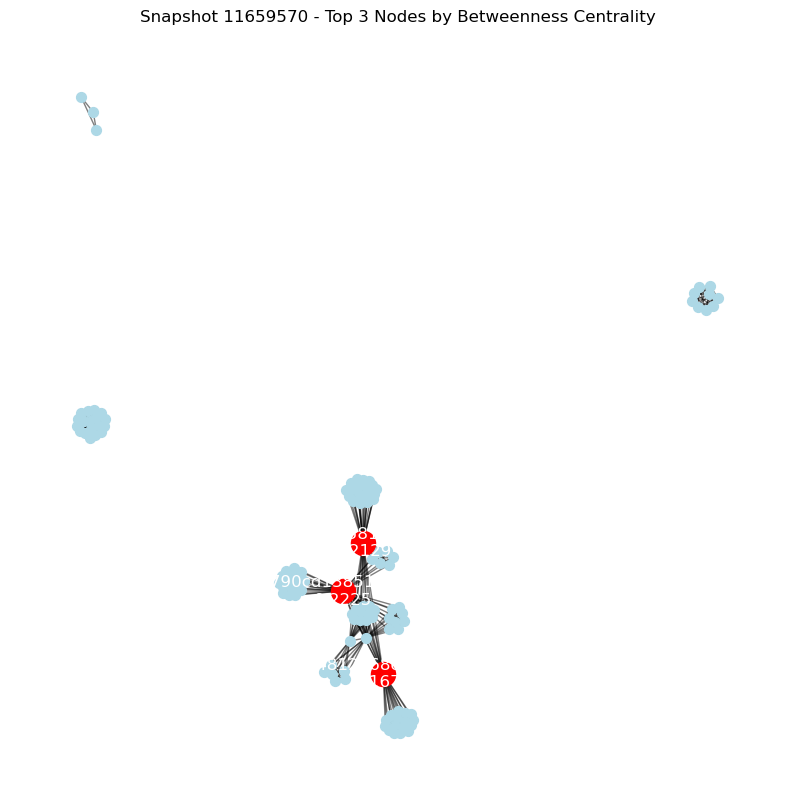

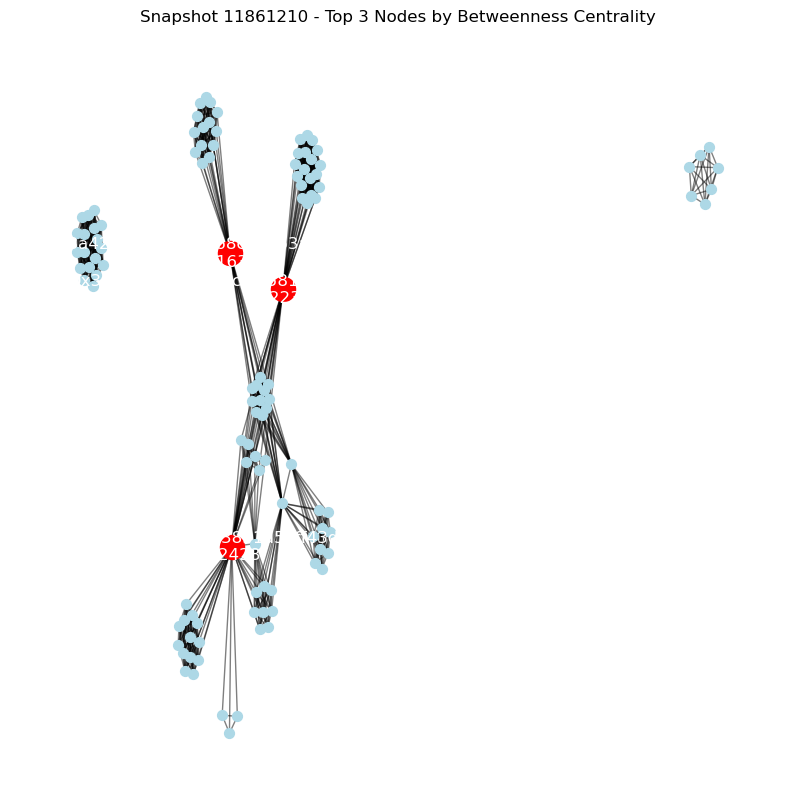

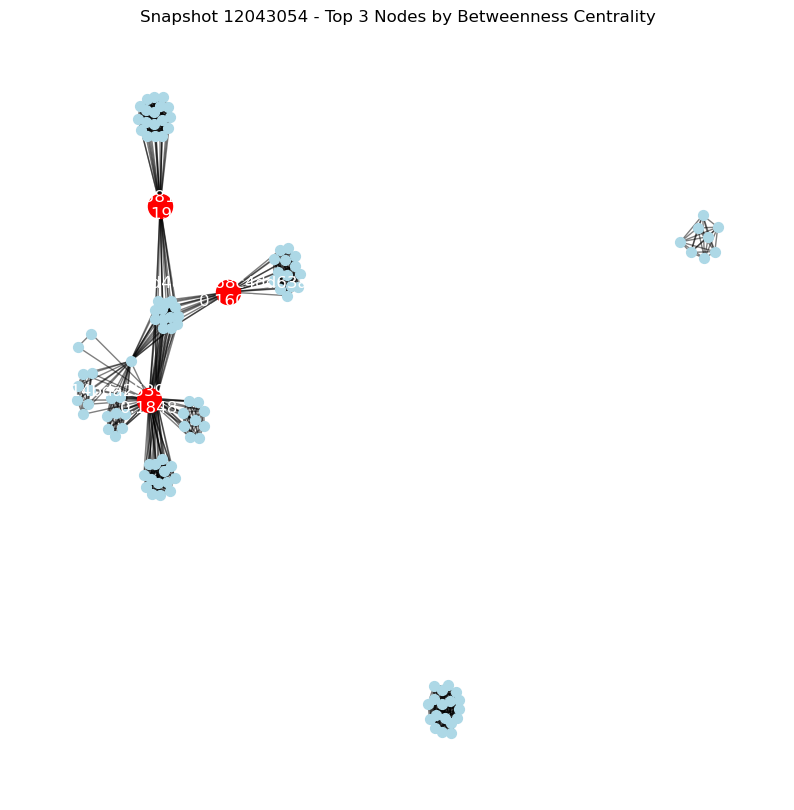

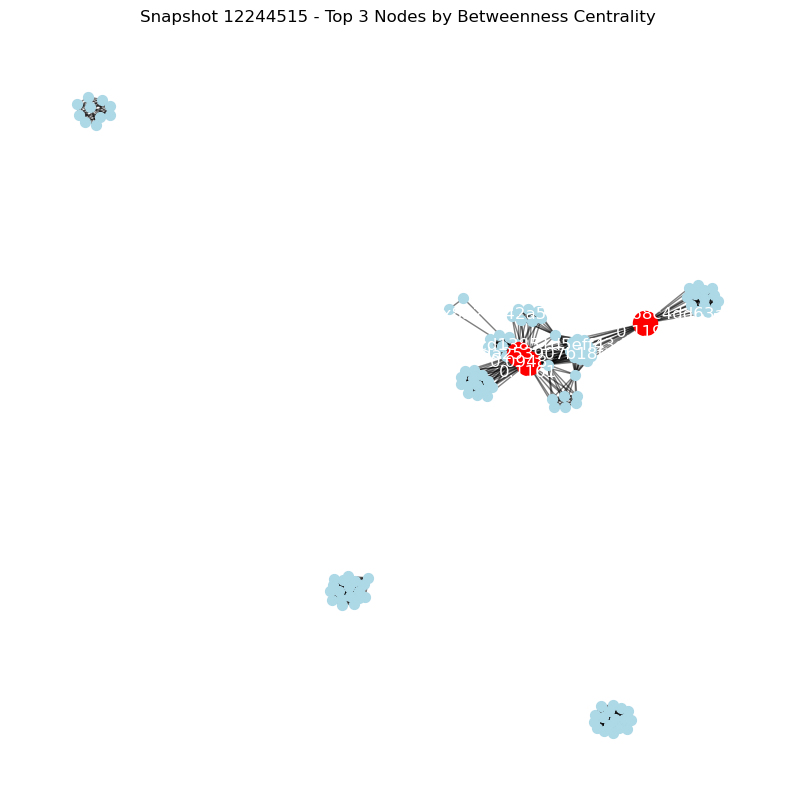

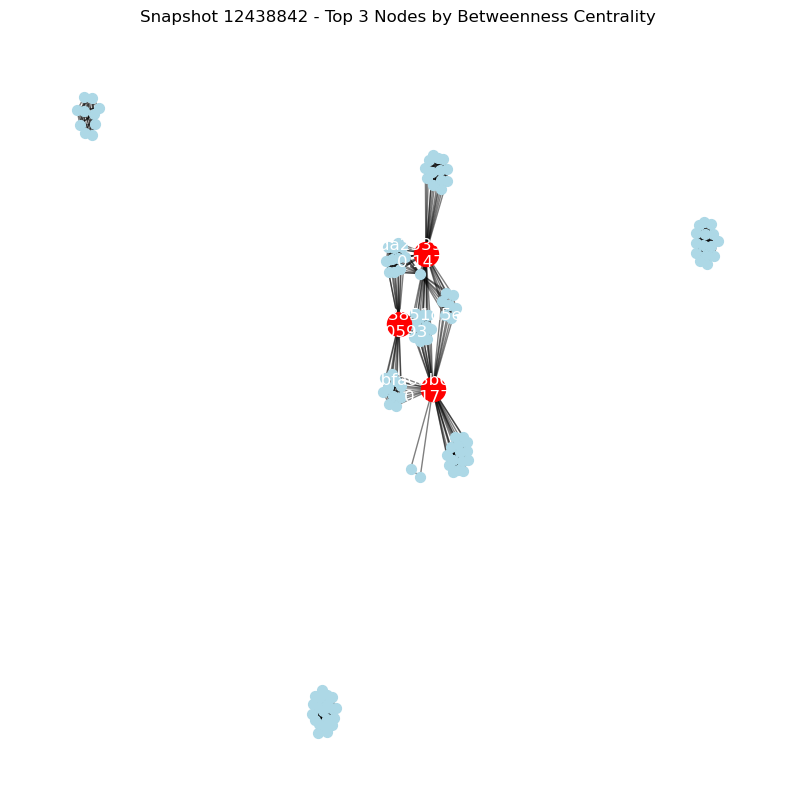

...

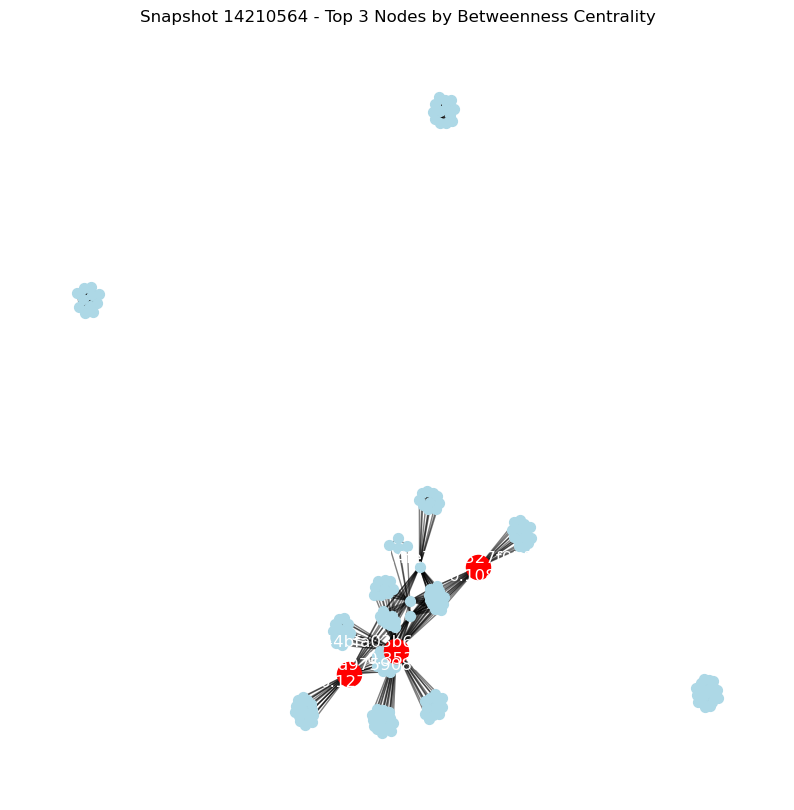

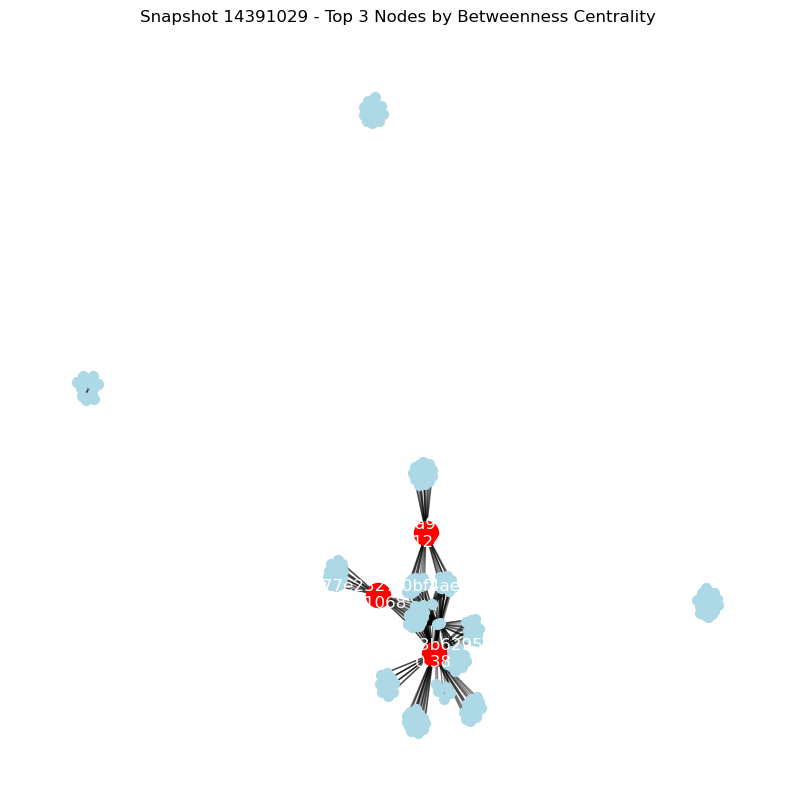

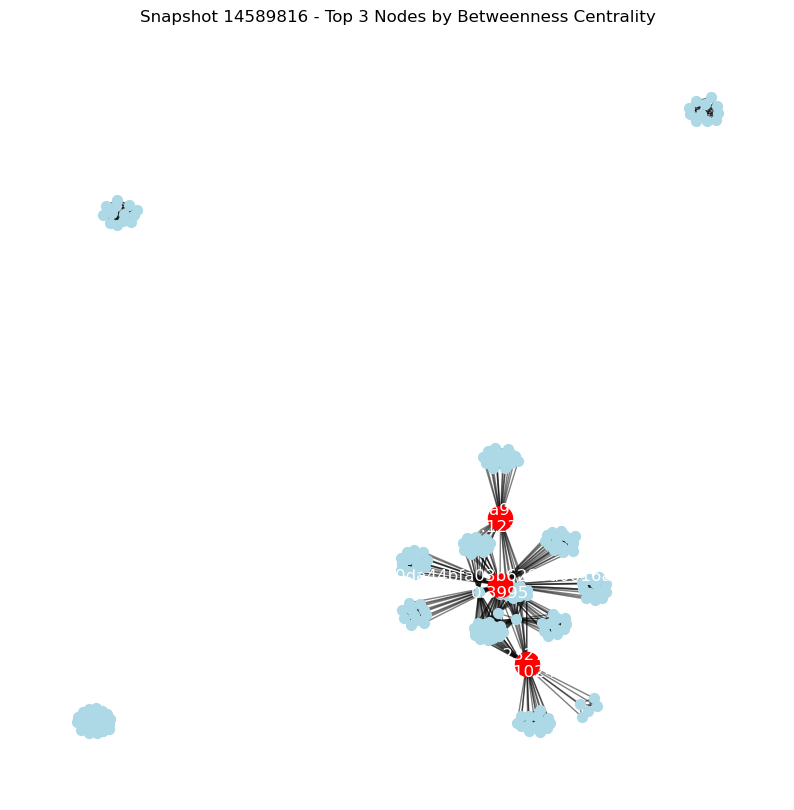

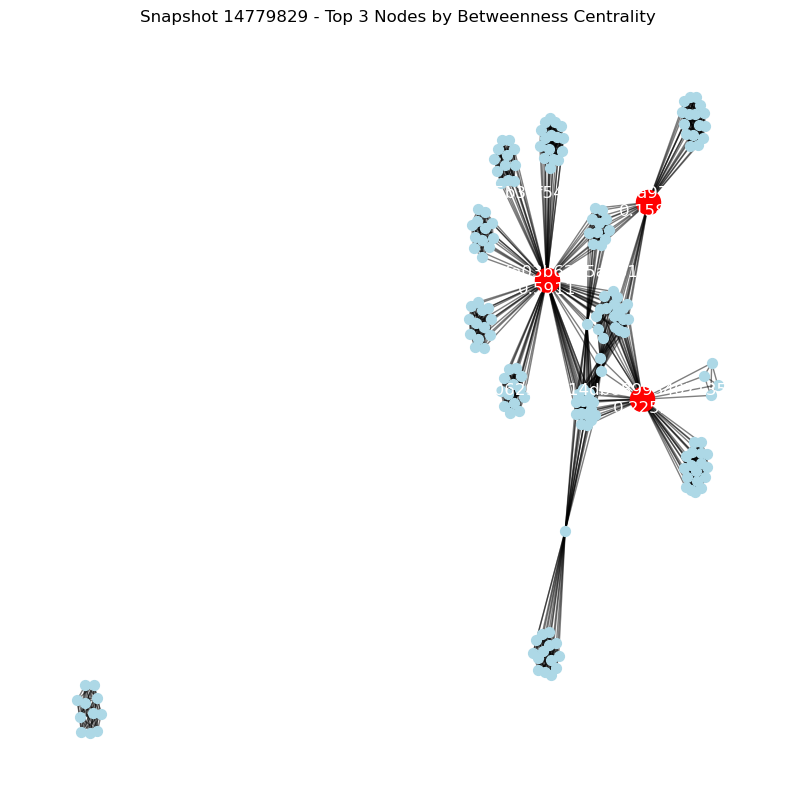

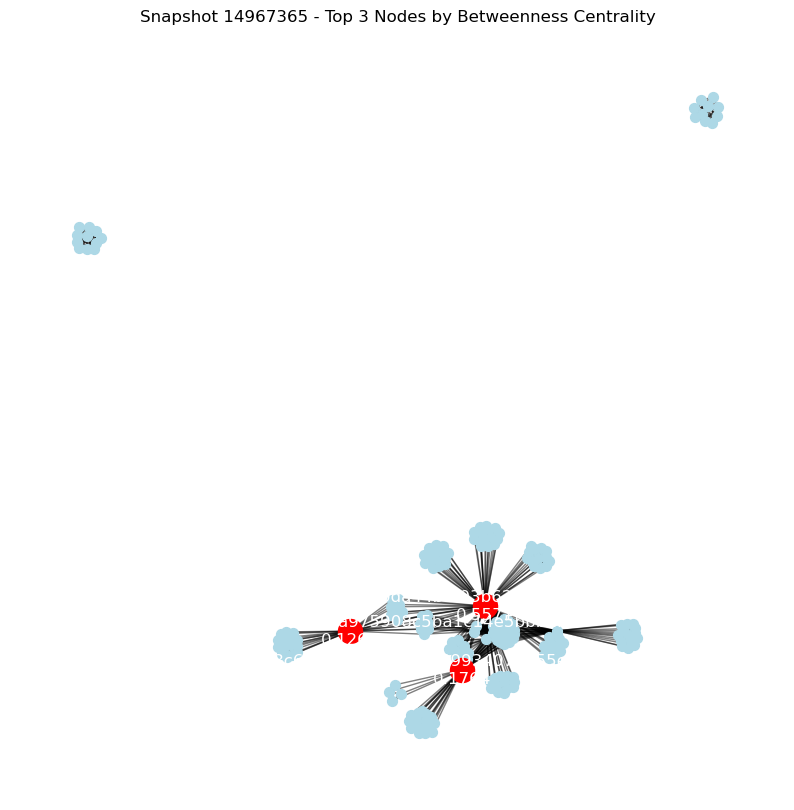

Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11659570.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_11861210.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12043054.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12244515.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_with_tokens_12438842.graphml
Enriched graph file not found: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graph

In [37]:
import os
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from os.path import join
from collections import defaultdict
import community as community_louvain

def generate_top_centrality_nodes_with_info(normal_graph_directory, enriched_graph_directory, token_info_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    top_centrality_nodes = []

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_path = join(normal_graph_directory, filename)
            enriched_graph_path = join(enriched_graph_directory, filename)  # Use the same filename for enriched graphs

            if not os.path.exists(enriched_graph_path):
                print(f"Enriched graph file not found: {enriched_graph_path}")
                continue

            # Load the normal graph for analysis
            G = nx.read_graphml(normal_graph_path)
            enriched_G = nx.read_graphml(enriched_graph_path)

            # Apply community detection on the normal graph
            partition = community_louvain.best_partition(G)

            # Set community information on the normal graph
            nx.set_node_attributes(G, partition, 'community')

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Find the top 3 nodes with the highest betweenness centrality
            top_3_nodes = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:3]

            # Store the top 3 nodes with their tokens and communities
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, centrality_value in top_3_nodes:
                # Use the enriched graph only for labeling the token names
                token_name = 'Unknown Token'
                if node in enriched_G.nodes:
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                
                community = G.nodes[node]['community']
                top_centrality_nodes.append({
                    'Snapshot': snapshot_time,
                    'Node': node,
                    'Betweenness Centrality': centrality_value,
                    'Token Name': token_name,
                    'Community': community
                })

            # Visualize the graph highlighting the top 3 nodes
            visualize_graph_with_top_centrality_nodes(G, top_3_nodes, snapshot_time)

    # Convert to DataFrame for better display and analysis
    top_centrality_nodes_df = pd.DataFrame(top_centrality_nodes)
    return top_centrality_nodes_df

def visualize_graph_with_top_centrality_nodes(G, top_3_nodes, snapshot_time):
    # Draw the graph
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(G)
    
    # Draw all nodes
    nx.draw_networkx_nodes(G, pos, node_size=50, node_color="lightblue")
    
    # Draw all edges
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    
    # Highlight the top 3 nodes
    top_nodes = [node for node, _ in top_3_nodes]
    nx.draw_networkx_nodes(G, pos, nodelist=top_nodes, node_size=300, node_color="red")
    
    # Annotate the top 3 nodes
    labels = {node: f"{node}\n{round(bc, 4)}" for node, bc in top_3_nodes}
    nx.draw_networkx_labels(G, pos, labels=labels, font_color="white")

    plt.title(f"Snapshot {snapshot_time} - Top 3 Nodes by Betweenness Centrality")
    plt.axis("off")
    plt.show()

def print_top_centrality_nodes(top_centrality_nodes_df):
    # Display the top centrality nodes in a readable format, sorted by Snapshot
    top_centrality_nodes_df.sort_values(by=['Snapshot', 'Betweenness Centrality'], ascending=[True, False], inplace=True)
    for snapshot in top_centrality_nodes_df['Snapshot'].unique():
        print(f"Snapshot: {snapshot}")
        snapshot_df = top_centrality_nodes_df[top_centrality_nodes_df['Snapshot'] == snapshot]
        for _, row in snapshot_df.iterrows():
            print(f"  Node: {row['Node']}, Betweenness Centrality: {row['Betweenness Centrality']:.4f}, Token: {row['Token Name']}, Community: {row['Community']}")
        print("\n")

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
normal_graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
enriched_graph_directory = join(data_directory, 'validated_wallet_projection_graphs_enriched')
token_info_path = join(data_directory, 'final_token_selection.csv')

# Generate the top centrality nodes with their associated information and visualize the graphs
top_centrality_nodes_df = generate_top_centrality_nodes_with_info(normal_graph_directory, enriched_graph_directory, token_info_path)

# Print the top centrality nodes in a readable format, sorted by snapshot
print_top_centrality_nodes(top_centrality_nodes_df)


# Checking for prominent wallets that have high betweeness centrality

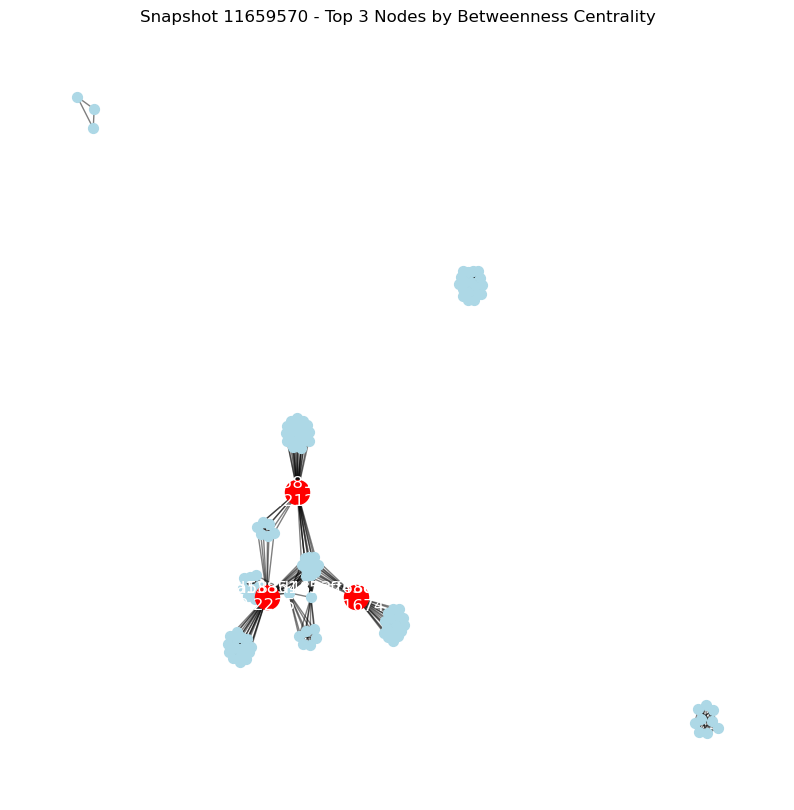

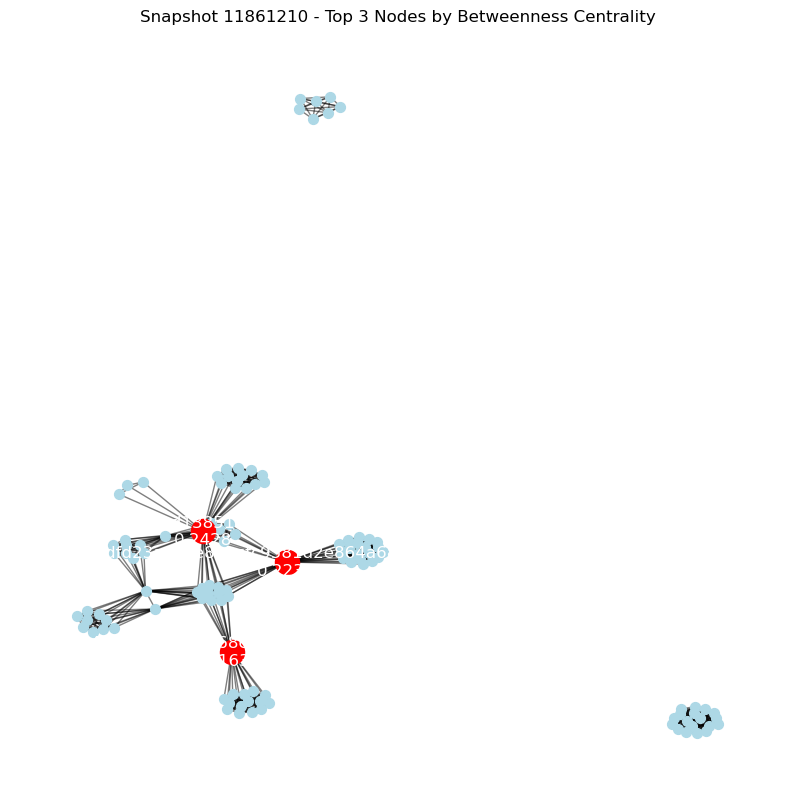

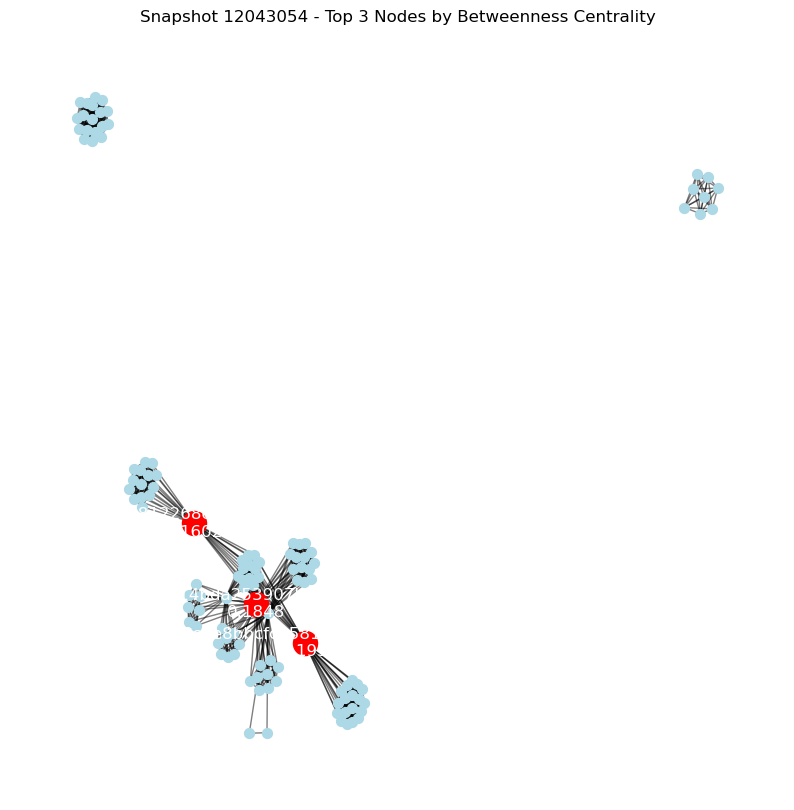

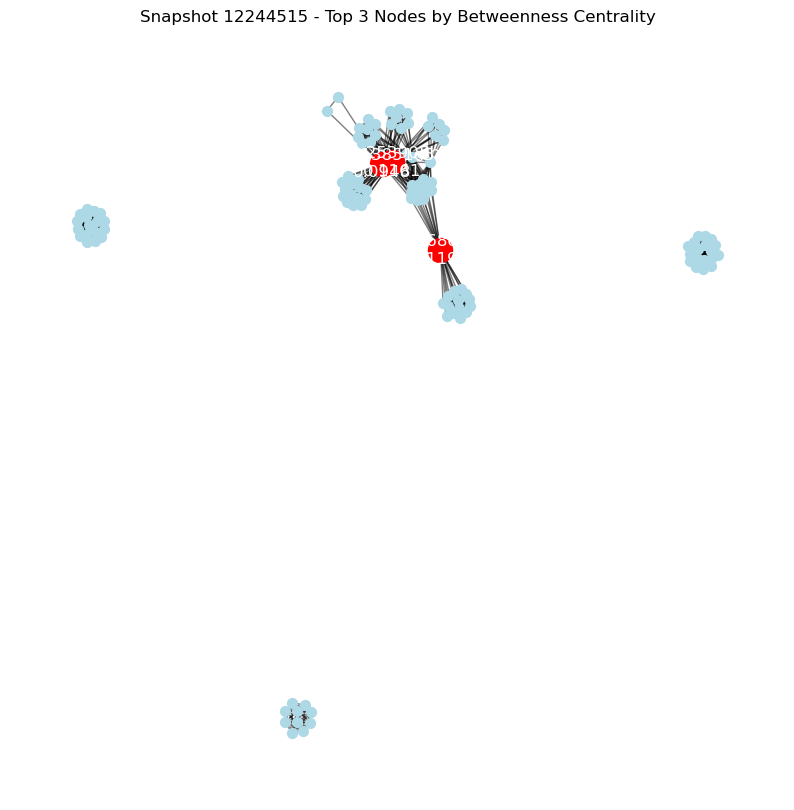

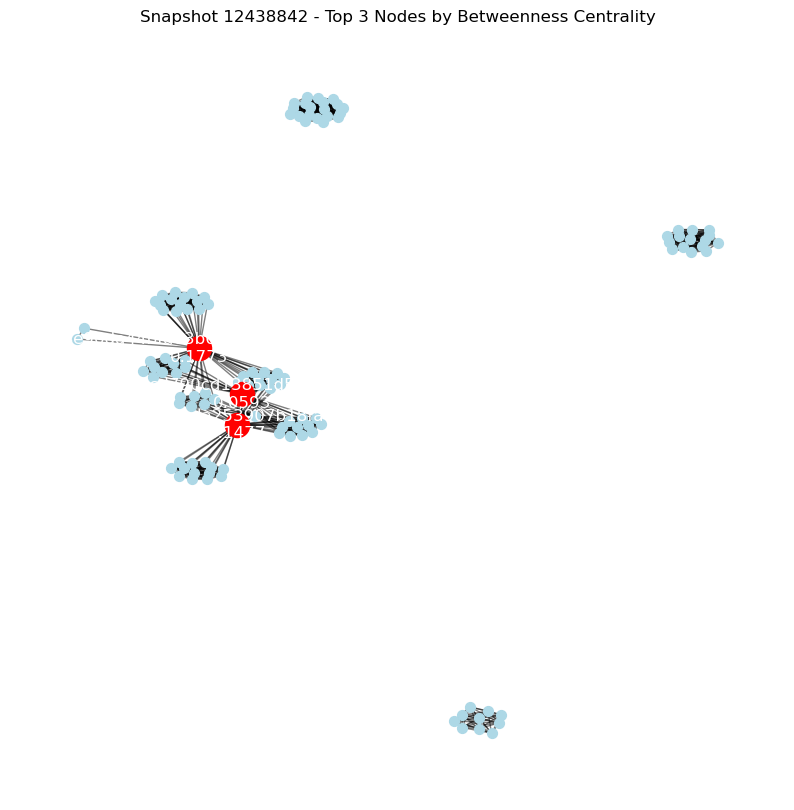

...

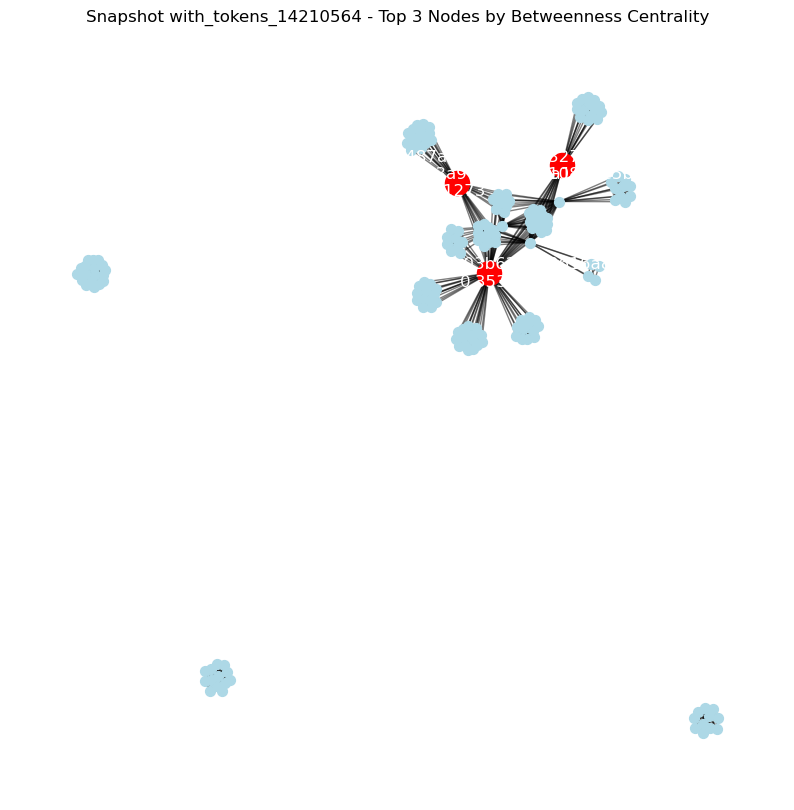

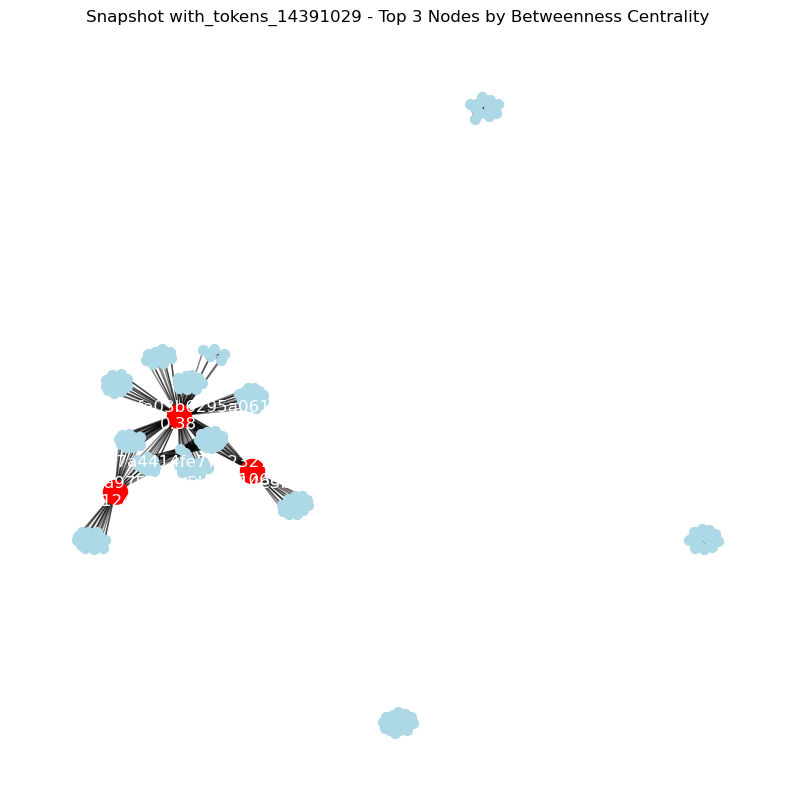

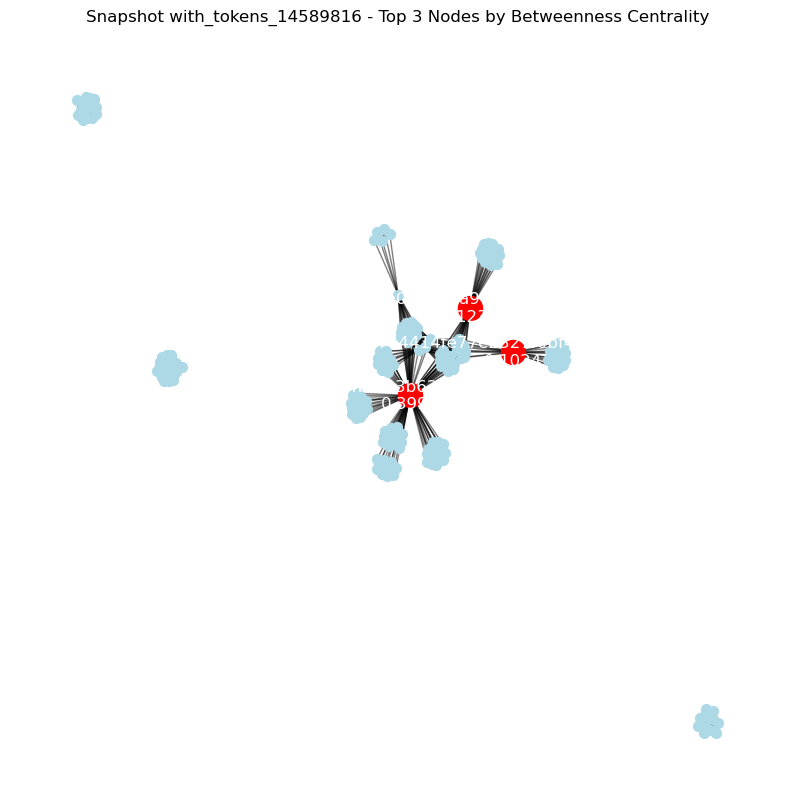

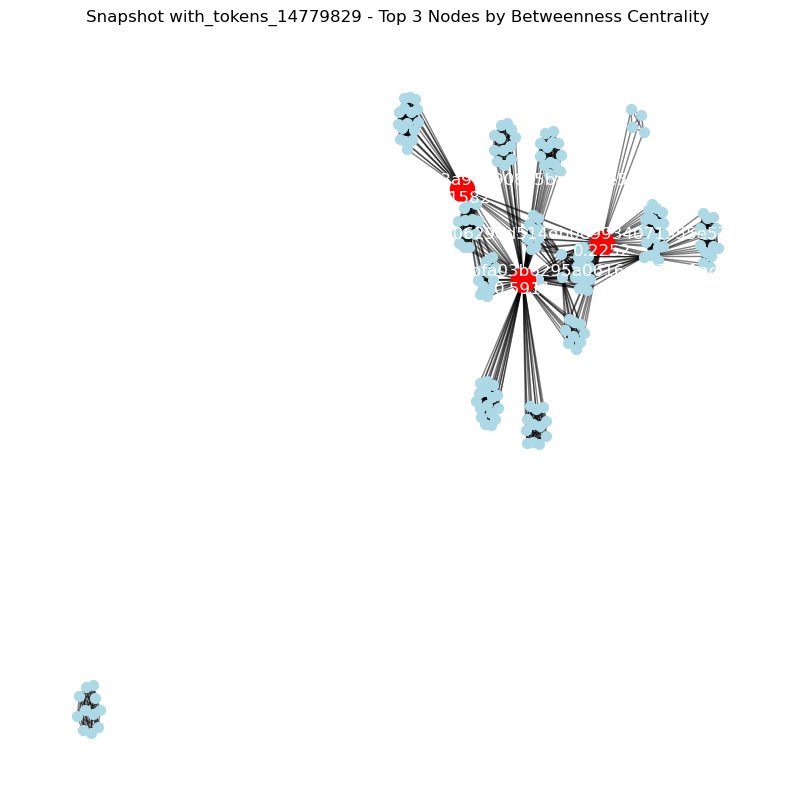

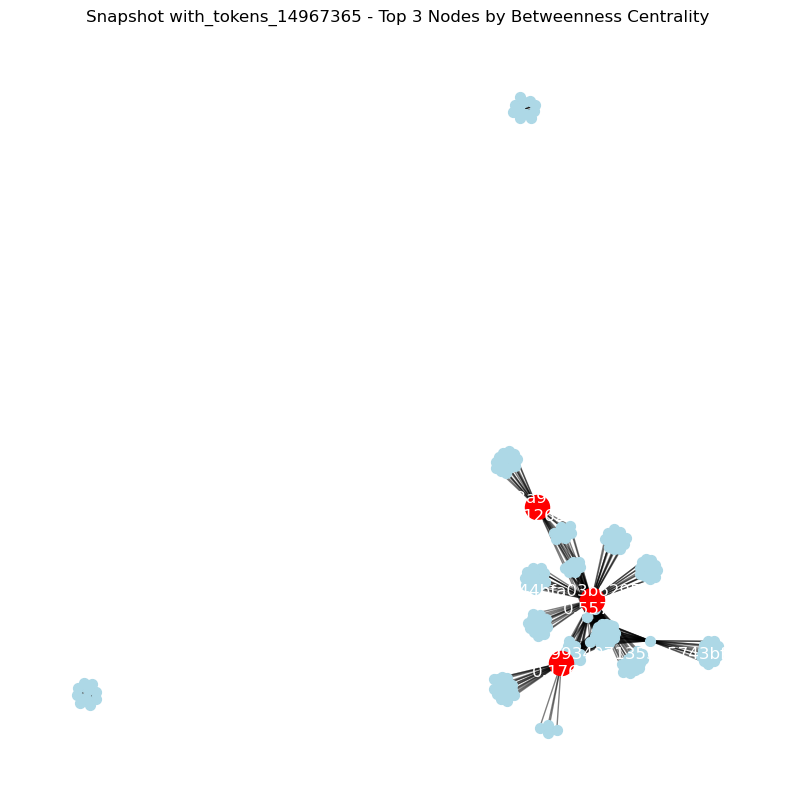

Snapshot: 11659570
  Node: 0xbe0eb53f46cd790cd13851d5eff43d12404d33e8, Betweenness Centrality: 0.2225, Token: Unknown Token, Community: 2
  Node: 0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3, Betweenness Centrality: 0.2129, Token: Unknown Token, Community: 3
  Node: 0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3, Betweenness Centrality: 0.1674, Token: Unknown Token, Community: 8


Snapshot: 11861210
  Node: 0xbe0eb53f46cd790cd13851d5eff43d12404d33e8, Betweenness Centrality: 0.2428, Token: Unknown Token, Community: 0
  Node: 0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3, Betweenness Centrality: 0.2234, Token: Unknown Token, Community: 4
  Node: 0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3, Betweenness Centrality: 0.1637, Token: Unknown Token, Community: 2


Snapshot: 12043054
  Node: 0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3, Betweenness Centrality: 0.1950, Token: Unknown Token, Community: 0
  Node: 0xe93381fb4c4f14bda253907b18fad305d799241a, Betweenness Centrality: 0.1848, Token: Unknown Token, 

In [36]:
import os
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from os.path import join
from collections import defaultdict

def generate_top_centrality_nodes_with_info(graph_directory, token_info_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    top_centrality_nodes = []
    wallet_centrality = defaultdict(list)

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Directly use the partition without global mapping
            nx.set_node_attributes(G, partition, 'community')

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Find the top 3 nodes with the highest betweenness centrality
            top_3_nodes = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:3]

            # Store the top 3 nodes with their tokens and communities
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, centrality_value in top_3_nodes:
                token_address = G.nodes[node].get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')
                community = G.nodes[node]['community']
                top_centrality_nodes.append({
                    'Snapshot': snapshot_time,
                    'Node': node,
                    'Betweenness Centrality': centrality_value,
                    'Token Name': token_name,
                    'Community': community
                })
                # Track the wallet address and its betweenness centrality across snapshots
                wallet_centrality[node].append(centrality_value)

            # Visualize the graph highlighting the top 3 nodes
            visualize_graph_with_top_centrality_nodes(G, top_3_nodes, snapshot_time)

    # Convert to DataFrame for better display and analysis
    top_centrality_nodes_df = pd.DataFrame(top_centrality_nodes)
    return top_centrality_nodes_df, wallet_centrality

def visualize_graph_with_top_centrality_nodes(G, top_3_nodes, snapshot_time):
    # Draw the graph
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(G)
    
    # Draw all nodes
    nx.draw_networkx_nodes(G, pos, node_size=50, node_color="lightblue")
    
    # Draw all edges
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    
    # Highlight the top 3 nodes
    top_nodes = [node for node, _ in top_3_nodes]
    nx.draw_networkx_nodes(G, pos, nodelist=top_nodes, node_size=300, node_color="red")
    
    # Annotate the top 3 nodes
    labels = {node: f"{node}\n{round(bc, 4)}" for node, bc in top_3_nodes}
    nx.draw_networkx_labels(G, pos, labels=labels, font_color="white")

    plt.title(f"Snapshot {snapshot_time} - Top 3 Nodes by Betweenness Centrality")
    plt.axis("off")
    plt.show()

def print_top_centrality_nodes(top_centrality_nodes_df):
    # Display the top centrality nodes in a readable format, sorted by Snapshot
    top_centrality_nodes_df.sort_values(by=['Snapshot', 'Betweenness Centrality'], ascending=[True, False], inplace=True)
    for snapshot in top_centrality_nodes_df['Snapshot'].unique():
        print(f"Snapshot: {snapshot}")
        snapshot_df = top_centrality_nodes_df[top_centrality_nodes_df['Snapshot'] == snapshot]
        for _, row in snapshot_df.iterrows():
            print(f"  Node: {row['Node']}, Betweenness Centrality: {row['Betweenness Centrality']:.4f}, Token: {row['Token Name']}, Community: {row['Community']}")
        print("\n")

def analyze_recurring_wallets(wallet_centrality):
    # Analyze and print recurring wallets with high betweenness centrality
    print("Recurring Wallet Addresses with High Betweenness Centrality:")
    for wallet, centralities in wallet_centrality.items():
        if len(centralities) > 1:
            print(f"  Wallet: {wallet}, Centralities: {centralities}, Occurrences: {len(centralities)}")
    print("\n")

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
token_info_path = join(data_directory, 'final_token_selection.csv')

# Generate the top centrality nodes with their associated information and visualize the graphs
top_centrality_nodes_df, wallet_centrality = generate_top_centrality_nodes_with_info(graph_directory, token_info_path)

# Print the top centrality nodes in a readable format, sorted by snapshot
print_top_centrality_nodes(top_centrality_nodes_df)

# Analyze and print recurring wallets with high betweenness centrality
analyze_recurring_wallets(wallet_centrality)


## There indeed seems to be 8 wallets that are consistently in the top 3 highest betweeness categories

# Analyse community roles

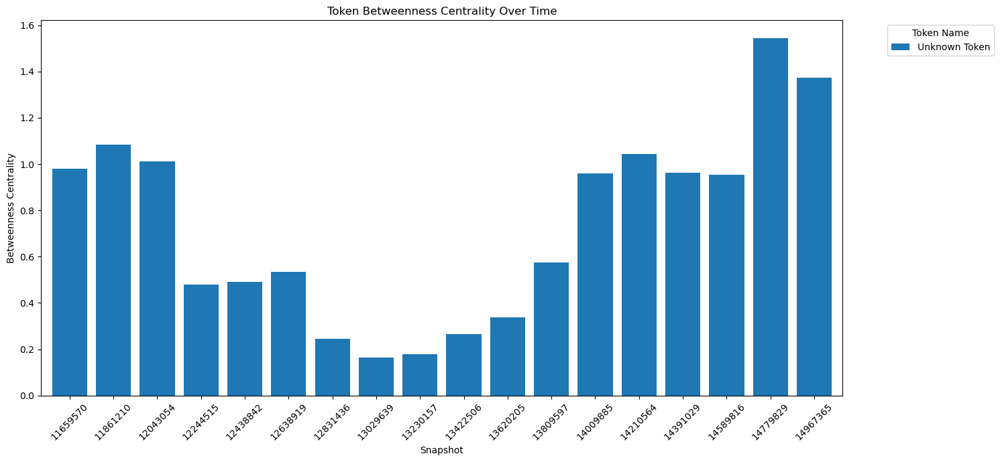

Top Tokens by Betweenness Centrality:
      Token Name  Betweenness Centrality
0  Unknown Token                13.18656


In [28]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def calculate_betweenness_centrality_per_token(graph_directory, token_info_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    token_betweenness_centrality = defaultdict(float)
    snapshot_centrality = defaultdict(lambda: defaultdict(float))

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Calculate betweenness centrality for each node
            betweenness_centrality = nx.betweenness_centrality(G)

            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')

            # Aggregate betweenness centrality per token
            for node, centrality_value in betweenness_centrality.items():
                token_address = G.nodes[node].get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')
                token_betweenness_centrality[token_name] += centrality_value
                snapshot_centrality[snapshot_time][token_name] += centrality_value

    # Convert to DataFrame for easier analysis
    token_betweenness_df = pd.DataFrame(list(token_betweenness_centrality.items()), columns=['Token Name', 'Betweenness Centrality'])
    snapshot_centrality_df = pd.DataFrame(snapshot_centrality).fillna(0).T

    return token_betweenness_df, snapshot_centrality_df

def visualize_token_betweenness(snapshot_centrality_df):
    # Plot the token betweenness centrality over time
    snapshot_centrality_df.plot(kind='bar', figsize=(15, 7), width=0.8)
    plt.title('Token Betweenness Centrality Over Time')
    plt.xlabel('Snapshot')
    plt.ylabel('Betweenness Centrality')
    plt.xticks(rotation=45)
    plt.legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

def print_top_tokens_by_betweenness_centrality(token_betweenness_df, top_n=10):
    # Sort by betweenness centrality and print the top tokens
    top_tokens = token_betweenness_df.sort_values(by='Betweenness Centrality', ascending=False).head(top_n)
    print("Top Tokens by Betweenness Centrality:")
    print(top_tokens)

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
token_info_path = join(data_directory, 'final_token_selection.csv')

# Calculate betweenness centrality per token
token_betweenness_df, snapshot_centrality_df = calculate_betweenness_centrality_per_token(graph_directory, token_info_path)

# Visualize token betweenness centrality over time
visualize_token_betweenness(snapshot_centrality_df)

# Print the top tokens by betweenness centrality
print_top_tokens_by_betweenness_centrality(token_betweenness_df)


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_47772/3143982994.py:52: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  limited_central_wallets_df = central_wallets_df.groupby('Snapshot').apply(lambda x: x.nlargest(5, 'Betweenness Centrality')).reset_index(drop=True)
/Users/liamk/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/liamk/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a 

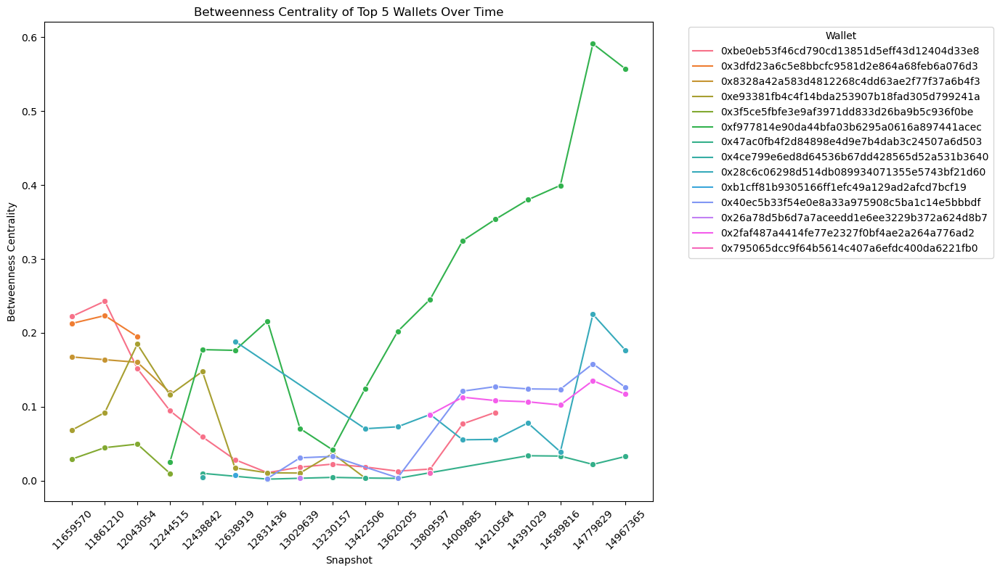

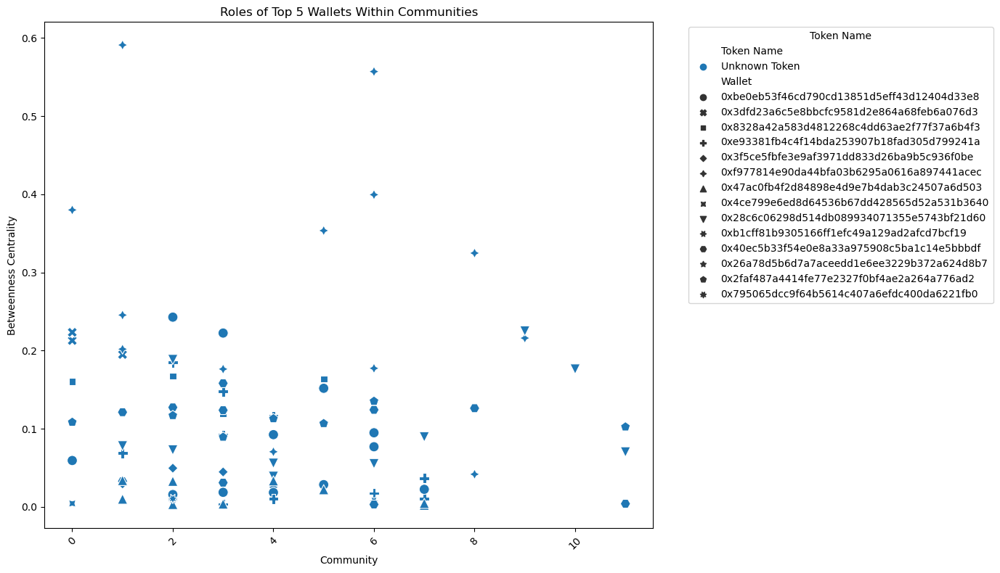

In [30]:
import os
import networkx as nx
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from os.path import join
from collections import defaultdict

def track_top_central_wallets_over_time(graph_directory, token_info_path, top_n=5):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    central_wallets_data = []

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)
            nx.set_node_attributes(G, partition, 'community')

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top N nodes (wallets) with the highest betweenness centrality
            top_wallets = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:top_n]

            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')

            # Store the top N wallets' data
            for node, centrality_value in top_wallets:
                token_address = G.nodes[node].get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')
                community = G.nodes[node]['community']
                central_wallets_data.append({
                    'Snapshot': snapshot_time,
                    'Wallet': node,
                    'Betweenness Centrality': centrality_value,
                    'Token Name': token_name,
                    'Community': community
                })

    return pd.DataFrame(central_wallets_data)

def visualize_top_central_wallets_over_time(central_wallets_df):
    # Limit to the 5 most influential wallets in each snapshot
    limited_central_wallets_df = central_wallets_df.groupby('Snapshot').apply(lambda x: x.nlargest(5, 'Betweenness Centrality')).reset_index(drop=True)

    # Plot the betweenness centrality of the most central wallets over time
    plt.figure(figsize=(14, 8))
    sns.lineplot(data=limited_central_wallets_df, x='Snapshot', y='Betweenness Centrality', hue='Wallet', marker='o')
    plt.title('Betweenness Centrality of Top 5 Wallets Over Time')
    plt.xlabel('Snapshot')
    plt.ylabel('Betweenness Centrality')
    plt.legend(title='Wallet', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Analyze roles within communities
    plt.figure(figsize=(14, 8))
    sns.scatterplot(data=limited_central_wallets_df, x='Community', y='Betweenness Centrality', hue='Token Name', style='Wallet', s=100)
    plt.title('Roles of Top 5 Wallets Within Communities')
    plt.xlabel('Community')
    plt.ylabel('Betweenness Centrality')
    plt.legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
token_info_path = join(data_directory, 'final_token_selection.csv')

# Track the top 5 central wallets over time
central_wallets_df = track_top_central_wallets_over_time(graph_directory, token_info_path, top_n=5)

# Visualize the top 5 central wallets' betweenness centrality over time
visualize_top_central_wallets_over_time(central_wallets_df)



# Community evolution

# Growth

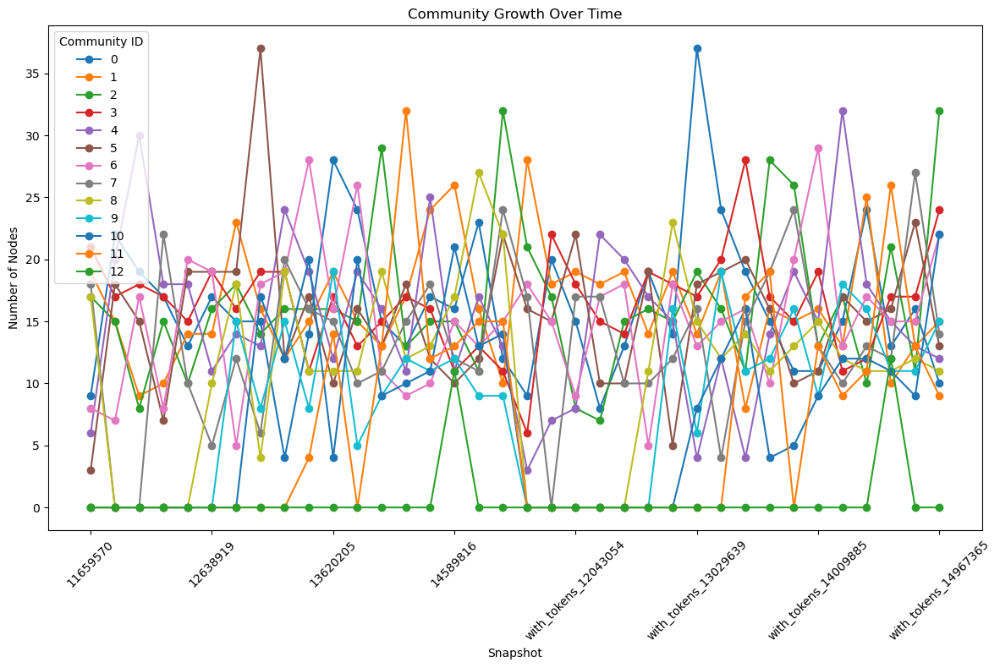

In [28]:
import os
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from os.path import join
from collections import defaultdict

def track_community_growth_over_time(graph_directory):
    community_growth = defaultdict(lambda: defaultdict(int))

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Count the number of nodes in each community
            community_sizes = defaultdict(int)
            for node, comm in partition.items():
                community_sizes[comm] += 1

            # Store the sizes of each community for this snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for comm, size in community_sizes.items():
                community_growth[comm][snapshot_time] = size

    # Convert the community growth data to a DataFrame for easier analysis
    community_growth_df = pd.DataFrame(community_growth).fillna(0).sort_index(axis=1)
    return community_growth_df

def visualize_community_growth(community_growth_df):
    # Plot the community growth over time
    community_growth_df.plot(figsize=(12, 8), marker='o')
    plt.title('Community Growth Over Time')
    plt.xlabel('Snapshot')
    plt.ylabel('Number of Nodes')
    plt.legend(title='Community ID')
    plt.xticks(rotation=45)  # Corrected line
    plt.tight_layout()
    plt.show()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')

# Track the community growth over time
community_growth_df = track_community_growth_over_time(graph_directory)

# Visualize the community growth over time
visualize_community_growth(community_growth_df)


# Splits

In [34]:
import os
import networkx as nx
import community as community_louvain
from os.path import join
from collections import defaultdict

def track_community_membership_over_time(graph_directory):
    community_membership = defaultdict(lambda: defaultdict(set))

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Track the nodes in each community for this snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, comm in partition.items():
                community_membership[snapshot_time][comm].add(node)

    return community_membership

def identify_community_splits(community_membership):
    community_splits = defaultdict(list)
    snapshots = sorted(community_membership.keys())

    # Compare consecutive snapshots
    for i in range(1, len(snapshots)):
        previous_snapshot = snapshots[i - 1]
        current_snapshot = snapshots[i]

        previous_communities = community_membership[previous_snapshot]
        current_communities = community_membership[current_snapshot]

        for prev_comm, prev_nodes in previous_communities.items():
            overlapping_communities = []

            for curr_comm, curr_nodes in current_communities.items():
                # Find the intersection of nodes between the previous community and current communities
                intersection = prev_nodes.intersection(curr_nodes)
                if intersection:
                    overlapping_communities.append((curr_comm, len(intersection)))

            # If the previous community's nodes split into multiple current communities
            if len(overlapping_communities) > 1:
                community_splits[previous_snapshot].append({
                    'Previous Community': prev_comm,
                    'Split Into': sorted(overlapping_communities, key=lambda x: x[1], reverse=True)
                })

    return community_splits

def print_community_splits(community_splits):
    print("Community Splits Detected Over Time:")
    for snapshot, splits in community_splits.items():
        print(f"Snapshot: {snapshot}")
        for split_info in splits:
            prev_comm = split_info['Previous Community']
            print(f"  Community {prev_comm} split into:")
            for curr_comm, intersection_size in split_info['Split Into']:
                print(f"    - Community {curr_comm} with {intersection_size} shared nodes")
        print()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')

# Track community membership over time
community_membership = track_community_membership_over_time(graph_directory)

# Identify community splits over time
community_splits = identify_community_splits(community_membership)

# Print the community splits
print_community_splits(community_splits)


Community Splits Detected Over Time:
Snapshot: 11659570
  Community 1 split into:
    - Community 2 with 16 shared nodes
    - Community 4 with 1 shared nodes

Snapshot: 11861210
  Community 4 split into:
    - Community 6 with 9 shared nodes
    - Community 5 with 5 shared nodes

Snapshot: 12043054
  Community 1 split into:
    - Community 5 with 17 shared nodes
    - Community 0 with 1 shared nodes

Snapshot: 12244515
  Community 0 split into:
    - Community 5 with 16 shared nodes
    - Community 0 with 8 shared nodes
    - Community 3 with 1 shared nodes
    - Community 6 with 1 shared nodes
  Community 6 split into:
    - Community 3 with 13 shared nodes
    - Community 6 with 2 shared nodes
    - Community 0 with 1 shared nodes

Snapshot: 12438842
  Community 3 split into:
    - Community 1 with 13 shared nodes
    - Community 6 with 1 shared nodes

Snapshot: 12638919
  Community 3 split into:
    - Community 4 with 15 shared nodes
    - Community 7 with 1 shared nodes
  Communit

In [35]:
import os
import networkx as nx
import community as community_louvain
from os.path import join
from collections import defaultdict

def track_community_membership_over_time(graph_directory):
    community_membership = defaultdict(lambda: defaultdict(set))

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Track the nodes in each community for this snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, comm in partition.items():
                community_membership[snapshot_time][comm].add(node)

    return community_membership

def identify_community_splits_and_deaths(community_membership):
    community_splits = defaultdict(list)
    community_deaths = defaultdict(list)
    snapshots = sorted(community_membership.keys())

    # Compare consecutive snapshots
    for i in range(1, len(snapshots)):
        previous_snapshot = snapshots[i - 1]
        current_snapshot = snapshots[i]

        previous_communities = community_membership[previous_snapshot]
        current_communities = community_membership[current_snapshot]

        for prev_comm, prev_nodes in previous_communities.items():
            overlapping_communities = []

            for curr_comm, curr_nodes in current_communities.items():
                # Find the intersection of nodes between the previous community and current communities
                intersection = prev_nodes.intersection(curr_nodes)
                if intersection:
                    overlapping_communities.append((curr_comm, len(intersection)))

            # If the previous community's nodes split into multiple current communities
            if len(overlapping_communities) > 1:
                community_splits[previous_snapshot].append({
                    'Previous Community': prev_comm,
                    'Split Into': sorted(overlapping_communities, key=lambda x: x[1], reverse=True)
                })
            # If the previous community has no overlap with any current communities, it "dies"
            elif len(overlapping_communities) == 0:
                community_deaths[previous_snapshot].append(prev_comm)

    return community_splits, community_deaths

def print_community_splits_and_deaths(community_splits, community_deaths):
    print("Community Splits Detected Over Time:")
    for snapshot, splits in community_splits.items():
        print(f"Snapshot: {snapshot}")
        for split_info in splits:
            prev_comm = split_info['Previous Community']
            print(f"  Community {prev_comm} split into:")
            for curr_comm, intersection_size in split_info['Split Into']:
                print(f"    - Community {curr_comm} with {intersection_size} shared nodes")
        print()
    
    print("Community Deaths Detected Over Time:")
    for snapshot, deaths in community_deaths.items():
        if deaths:
            print(f"Snapshot: {snapshot}")
            for dead_comm in deaths:
                print(f"  Community {dead_comm} ceased to exist in the next snapshot")
        print()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')

# Track community membership over time
community_membership = track_community_membership_over_time(graph_directory)

# Identify community splits and deaths over time
community_splits, community_deaths = identify_community_splits_and_deaths(community_membership)

# Print the community splits and deaths
print_community_splits_and_deaths(community_splits, community_deaths)


Community Splits Detected Over Time:
Snapshot: 11659570
  Community 1 split into:
    - Community 3 with 16 shared nodes
    - Community 4 with 1 shared nodes

Snapshot: 11861210
  Community 4 split into:
    - Community 6 with 9 shared nodes
    - Community 5 with 5 shared nodes

Snapshot: 12043054
  Community 1 split into:
    - Community 6 with 17 shared nodes
    - Community 0 with 1 shared nodes

Snapshot: 12244515
  Community 0 split into:
    - Community 5 with 16 shared nodes
    - Community 0 with 8 shared nodes
    - Community 3 with 1 shared nodes
    - Community 6 with 1 shared nodes
  Community 5 split into:
    - Community 3 with 13 shared nodes
    - Community 6 with 2 shared nodes
    - Community 0 with 1 shared nodes

Snapshot: 12438842
  Community 3 split into:
    - Community 1 with 13 shared nodes
    - Community 6 with 1 shared nodes

Snapshot: 12638919
  Community 2 split into:
    - Community 4 with 15 shared nodes
    - Community 7 with 1 shared nodes
  Communit

In [36]:
import os
import networkx as nx
import community as community_louvain
from os.path import join
from collections import defaultdict
import plotly.graph_objects as go

def track_community_membership_over_time(graph_directory):
    community_membership = defaultdict(lambda: defaultdict(set))

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Track the nodes in each community for this snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, comm in partition.items():
                community_membership[snapshot_time][comm].add(node)

    return community_membership

def identify_community_splits_and_deaths(community_membership):
    community_splits = defaultdict(list)
    community_deaths = defaultdict(list)
    snapshots = sorted(community_membership.keys())

    for i in range(1, len(snapshots)):
        previous_snapshot = snapshots[i - 1]
        current_snapshot = snapshots[i]

        previous_communities = community_membership[previous_snapshot]
        current_communities = community_membership[current_snapshot]

        for prev_comm, prev_nodes in previous_communities.items():
            overlapping_communities = []

            for curr_comm, curr_nodes in current_communities.items():
                intersection = prev_nodes.intersection(curr_nodes)
                if intersection:
                    overlapping_communities.append((curr_comm, len(intersection)))

            if len(overlapping_communities) > 1:
                community_splits[previous_snapshot].append({
                    'Previous Community': prev_comm,
                    'Split Into': sorted(overlapping_communities, key=lambda x: x[1], reverse=True)
                })
            elif len(overlapping_communities) == 0:
                community_deaths[previous_snapshot].append(prev_comm)

    return community_splits, community_deaths

def create_sankey_diagram_for_splits_and_deaths(community_splits, community_deaths):
    source = []
    target = []
    value = []
    labels = {}
    label_list = []

    def add_label(snapshot_comm):
        if snapshot_comm not in labels:
            labels[snapshot_comm] = len(labels)
            label_list.append(snapshot_comm)
        return labels[snapshot_comm]

    # Process splits
    for snapshot, splits in community_splits.items():
        for split_info in splits:
            prev_comm = split_info['Previous Community']
            prev_label = add_label(f"{snapshot}_Comm_{prev_comm}")
            for curr_comm, intersection_size in split_info['Split Into']:
                curr_label = add_label(f"Next_Comm_{curr_comm}")
                source.append(prev_label)
                target.append(curr_label)
                value.append(intersection_size)

    # Process deaths
    for snapshot, deaths in community_deaths.items():
        for dead_comm in deaths:
            dead_label = add_label(f"{snapshot}_Comm_{dead_comm}")
            source.append(dead_label)
            target.append(add_label("DEATH"))
            value.append(1)

    # Create the Sankey diagram
    fig = go.Figure(go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=label_list,
        ),
        link=dict(
            source=source,
            target=target,
            value=value,
        )
    ))

    fig.update_layout(title_text="Community Splits and Deaths Over Time", font_size=10)
    fig.show()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')

# Track community membership over time
community_membership = track_community_membership_over_time(graph_directory)

# Identify community splits and deaths over time
community_splits, community_deaths = identify_community_splits_and_deaths(community_membership)

# Create a Sankey diagram to visualize the splits and deaths
create_sankey_diagram_for_splits_and_deaths(community_splits, community_deaths)


In [37]:
import os
import networkx as nx
import community as community_louvain
from os.path import join
from collections import defaultdict
import plotly.graph_objects as go
import pandas as pd

def generate_snapshot_dates():
    """Generate monthly snapshot dates from June 2021 to December 2022."""
    return pd.date_range(start="2021-06-01", end="2022-12-01", freq='MS').strftime("%Y-%m").tolist()

def track_community_membership_over_time(graph_directory, snapshot_dates):
    community_membership = defaultdict(lambda: defaultdict(set))

    # Process each graph file in the directory
    for i, filename in enumerate(sorted(os.listdir(graph_directory))):  # Ensure files are processed in order
        if filename.endswith('.graphml') and i < len(snapshot_dates):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Track the nodes in each community for this snapshot
            snapshot_time = snapshot_dates[i]
            for node, comm in partition.items():
                community_membership[snapshot_time][comm].add(node)

    return community_membership

def identify_community_splits_and_deaths(community_membership):
    community_splits = defaultdict(list)
    community_deaths = defaultdict(list)
    snapshots = sorted(community_membership.keys())

    for i in range(1, len(snapshots)):
        previous_snapshot = snapshots[i - 1]
        current_snapshot = snapshots[i]

        previous_communities = community_membership[previous_snapshot]
        current_communities = community_membership[current_snapshot]

        for prev_comm, prev_nodes in previous_communities.items():
            overlapping_communities = []

            for curr_comm, curr_nodes in current_communities.items():
                intersection = prev_nodes.intersection(curr_nodes)
                if intersection:
                    overlapping_communities.append((curr_comm, len(intersection)))

            if len(overlapping_communities) > 1:
                community_splits[previous_snapshot].append({
                    'Previous Community': prev_comm,
                    'Split Into': sorted(overlapping_communities, key=lambda x: x[1], reverse=True)
                })
            elif len(overlapping_communities) == 0:
                community_deaths[previous_snapshot].append(prev_comm)

    return community_splits, community_deaths

def create_sankey_diagram_for_splits_and_deaths(community_splits, community_deaths):
    source = []
    target = []
    value = []
    labels = {}
    label_list = []

    def add_label(snapshot_comm):
        if snapshot_comm not in labels:
            labels[snapshot_comm] = len(labels)
            label_list.append(snapshot_comm)
        return labels[snapshot_comm]

    # Process splits
    for snapshot, splits in community_splits.items():
        for split_info in splits:
            prev_comm = split_info['Previous Community']
            prev_label = add_label(f"{snapshot}_Comm_{prev_comm}")
            for curr_comm, intersection_size in split_info['Split Into']:
                curr_label = add_label(f"Next_Comm_{curr_comm}")
                source.append(prev_label)
                target.append(curr_label)
                value.append(intersection_size)

    # Process deaths
    for snapshot, deaths in community_deaths.items():
        for dead_comm in deaths:
            dead_label = add_label(f"{snapshot}_Comm_{dead_comm}")
            source.append(dead_label)
            target.append(add_label("DEATH"))
            value.append(1)

    # Create the Sankey diagram
    fig = go.Figure(go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=label_list,
        ),
        link=dict(
            source=source,
            target=target,
            value=value,
        )
    ))

    fig.update_layout(title_text="Community Splits and Deaths Over Time (June 2021 - December 2022)", font_size=10)
    fig.show()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')

# Generate snapshot dates for the time period from June 2021 to December 2022
snapshot_dates = generate_snapshot_dates()

# Track community membership over time
community_membership = track_community_membership_over_time(graph_directory, snapshot_dates)

# Identify community splits and deaths over time
community_splits, community_deaths = identify_community_splits_and_deaths(community_membership)

# Create a Sankey diagram to visualize the splits and deaths
create_sankey_diagram_for_splits_and_deaths(community_splits, community_deaths)


# Merges

In [38]:
import os
import networkx as nx
from os.path import join
from collections import defaultdict

def track_community_membership_over_time(graph_directory):
    community_membership = defaultdict(lambda: defaultdict(set))

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Track the nodes in each community for this snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, comm in partition.items():
                community_membership[snapshot_time][comm].add(node)

    return community_membership

def identify_community_merges(community_membership):
    community_merges = defaultdict(list)
    snapshots = sorted(community_membership.keys())

    # Compare consecutive snapshots
    for i in range(1, len(snapshots)):
        previous_snapshot = snapshots[i - 1]
        current_snapshot = snapshots[i]

        previous_communities = community_membership[previous_snapshot]
        current_communities = community_membership[current_snapshot]

        for curr_comm, curr_nodes in current_communities.items():
            contributing_communities = []

            for prev_comm, prev_nodes in previous_communities.items():
                # Find the intersection of nodes between the current community and previous communities
                intersection = curr_nodes.intersection(prev_nodes)
                if intersection:
                    contributing_communities.append((prev_comm, len(intersection)))

            # If the current community is formed by nodes from multiple previous communities
            if len(contributing_communities) > 1:
                community_merges[current_snapshot].append({
                    'Current Community': curr_comm,
                    'Merged From': sorted(contributing_communities, key=lambda x: x[1], reverse=True)
                })

    return community_merges

def print_community_merges(community_merges):
    print("Community Merges Detected Over Time:")
    for snapshot, merges in community_merges.items():
        print(f"Snapshot: {snapshot}")
        for merge_info in merges:
            curr_comm = merge_info['Current Community']
            print(f"  Community {curr_comm} was formed by merging:")
            for prev_comm, intersection_size in merge_info['Merged From']:
                print(f"    - Community {prev_comm} with {intersection_size} shared nodes")
        print()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')

# Track community membership over time
community_membership = track_community_membership_over_time(graph_directory)

# Identify community merges over time
community_merges = identify_community_merges(community_membership)

# Print the community merges
print_community_merges(community_merges)


Community Merges Detected Over Time:
Snapshot: 11861210
  Community 1 was formed by merging:
    - Community 3 with 14 shared nodes
    - Community 4 with 3 shared nodes
  Community 4 was formed by merging:
    - Community 8 with 8 shared nodes
    - Community 7 with 4 shared nodes
    - Community 1 with 1 shared nodes

Snapshot: 12244515
  Community 4 was formed by merging:
    - Community 7 with 17 shared nodes
    - Community 1 with 1 shared nodes
    - Community 6 with 1 shared nodes

Snapshot: 12438842
  Community 0 was formed by merging:
    - Community 5 with 8 shared nodes
    - Community 6 with 1 shared nodes
  Community 3 was formed by merging:
    - Community 6 with 13 shared nodes
    - Community 4 with 1 shared nodes
  Community 6 was formed by merging:
    - Community 7 with 14 shared nodes
    - Community 6 with 2 shared nodes
    - Community 4 with 1 shared nodes

Snapshot: 12638919
  Community 3 was formed by merging:
    - Community 5 with 15 shared nodes
    - Commun

In [39]:
import os
import networkx as nx
import community as community_louvain
from os.path import join
from collections import defaultdict
import plotly.graph_objects as go
import pandas as pd

# Mapping of snapshots to dates (example mapping)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

def track_community_membership_over_time(graph_directory):
    community_membership = defaultdict(lambda: defaultdict(set))

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Track the nodes in each community for this snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, comm in partition.items():
                community_membership[snapshot_time][comm].add(node)

    return community_membership

def identify_community_merges(community_membership):
    community_merges = defaultdict(list)
    snapshots = sorted(community_membership.keys())

    # Compare consecutive snapshots
    for i in range(1, len(snapshots)):
        previous_snapshot = snapshots[i - 1]
        current_snapshot = snapshots[i]

        previous_communities = community_membership[previous_snapshot]
        current_communities = community_membership[current_snapshot]

        for curr_comm, curr_nodes in current_communities.items():
            overlapping_communities = []

            for prev_comm, prev_nodes in previous_communities.items():
                # Find the intersection of nodes between current community and previous communities
                intersection = curr_nodes.intersection(prev_nodes)
                if intersection:
                    overlapping_communities.append((prev_comm, len(intersection)))

            # If multiple previous communities merged into the current community
            if len(overlapping_communities) > 1:
                community_merges[current_snapshot].append({
                    'Current Community': curr_comm,
                    'Merged From': sorted(overlapping_communities, key=lambda x: x[1], reverse=True)
                })

    return community_merges

def print_community_merges(community_merges):
    print("Community Merges Detected Over Time:")
    for snapshot, merges in community_merges.items():
        print(f"Snapshot: {snapshot_dates[snapshot]} ({snapshot})")
        for merge_info in merges:
            curr_comm = merge_info['Current Community']
            print(f"  Community {curr_comm} formed from the merge of:")
            for prev_comm, intersection_size in merge_info['Merged From']:
                print(f"    - Community {prev_comm} with {intersection_size} shared nodes")
        print()

def visualize_community_merges(community_merges):
    merge_edges = []
    labels = []
    label_index = {}
    index = 0

    for snapshot, merges in community_merges.items():
        for merge_info in merges:
            curr_comm = merge_info['Current Community']
            for prev_comm, intersection_size in merge_info['Merged From']:
                source_label = f"{snapshot_dates[snapshot]}: Community {prev_comm}"
                target_label = f"{snapshot_dates[snapshot]}: Community {curr_comm}"

                if source_label not in label_index:
                    label_index[source_label] = index
                    labels.append(source_label)
                    index += 1
                if target_label not in label_index:
                    label_index[target_label] = index
                    labels.append(target_label)
                    index += 1

                merge_edges.append({
                    'Source': label_index[source_label],
                    'Target': label_index[target_label],
                    'Value': intersection_size
                })

    # Create a DataFrame for better handling and visualization
    merge_df = pd.DataFrame(merge_edges)

    # Create a Sankey diagram for community merges
    fig = go.Figure(go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=labels,
        ),
        link=dict(
            source=merge_df['Source'],
            target=merge_df['Target'],
            value=merge_df['Value']
        )
    ))

    fig.update_layout(title_text="Community Merges Over Time", font_size=10)
    fig.show()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')

# Track community membership over time
community_membership = track_community_membership_over_time(graph_directory)

# Identify community merges over time
community_merges = identify_community_merges(community_membership)

# Print the community merges
print_community_merges(community_merges)

# Visualize community merges over time
visualize_community_merges(community_merges)



Community Merges Detected Over Time:
Snapshot: 2021-07 (11861210)
  Community 1 formed from the merge of:
    - Community 3 with 14 shared nodes
    - Community 4 with 3 shared nodes
  Community 6 formed from the merge of:
    - Community 8 with 8 shared nodes
    - Community 7 with 4 shared nodes
    - Community 1 with 1 shared nodes

Snapshot: 2021-09 (12244515)
  Community 4 formed from the merge of:
    - Community 2 with 17 shared nodes
    - Community 1 with 1 shared nodes
    - Community 6 with 1 shared nodes

Snapshot: 2021-10 (12438842)
  Community 0 formed from the merge of:
    - Community 5 with 8 shared nodes
    - Community 6 with 1 shared nodes
  Community 3 formed from the merge of:
    - Community 6 with 13 shared nodes
    - Community 4 with 1 shared nodes
  Community 6 formed from the merge of:
    - Community 7 with 14 shared nodes
    - Community 6 with 2 shared nodes
    - Community 4 with 1 shared nodes

Snapshot: 2021-11 (12638919)
  Community 6 formed from the 

In [40]:
import os
import networkx as nx
import community as community_louvain
from os.path import join
from collections import defaultdict
import plotly.graph_objects as go
import pandas as pd

# Mapping of snapshots to dates (example mapping)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

def track_community_membership_over_time(graph_directory):
    community_membership = defaultdict(lambda: defaultdict(set))

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Track the nodes in each community for this snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, comm in partition.items():
                community_membership[snapshot_time][comm].add(node)

    return community_membership

def identify_community_merges(community_membership):
    community_merges = defaultdict(list)
    snapshots = sorted(community_membership.keys())

    # Compare consecutive snapshots
    for i in range(1, len(snapshots)):
        previous_snapshot = snapshots[i - 1]
        current_snapshot = snapshots[i]

        previous_communities = community_membership[previous_snapshot]
        current_communities = community_membership[current_snapshot]

        for curr_comm, curr_nodes in current_communities.items():
            overlapping_communities = []

            for prev_comm, prev_nodes in previous_communities.items():
                # Find the intersection of nodes between current community and previous communities
                intersection = curr_nodes.intersection(prev_nodes)
                if intersection:
                    overlapping_communities.append((prev_comm, len(intersection)))

            # If multiple previous communities merged into the current community
            if len(overlapping_communities) > 1:
                community_merges[current_snapshot].append({
                    'Current Community': curr_comm,
                    'Merged From': sorted(overlapping_communities, key=lambda x: x[1], reverse=True)
                })

    return community_merges

def create_sankey_diagram_for_merges(community_merges):
    merge_edges = []
    labels = []
    label_index = {}
    index = 0

    for snapshot, merges in community_merges.items():
        for merge_info in merges:
            curr_comm = merge_info['Current Community']
            for prev_comm, intersection_size in merge_info['Merged From']:
                source_label = f"{snapshot_dates[snapshot]}: Community {prev_comm}"
                target_label = f"{snapshot_dates[snapshot]}: Community {curr_comm}"

                if source_label not in label_index:
                    label_index[source_label] = index
                    labels.append(source_label)
                    index += 1
                if target_label not in label_index:
                    label_index[target_label] = index
                    labels.append(target_label)
                    index += 1

                merge_edges.append({
                    'Source': label_index[source_label],
                    'Target': label_index[target_label],
                    'Value': intersection_size
                })

    # Create a DataFrame for better handling and visualization
    merge_df = pd.DataFrame(merge_edges)

    # Create a larger Sankey diagram for community merges
    fig = go.Figure(go.Sankey(
        node=dict(
            pad=30,  # Increase the padding between nodes
            thickness=30,  # Increase the node thickness
            line=dict(color="black", width=0.5),
            label=labels,
            color="blue"
        ),
        link=dict(
            source=merge_df['Source'],
            target=merge_df['Target'],
            value=merge_df['Value']
        )
    ))

    fig.update_layout(
        title_text="Community Merges Over Time",
        font_size=12,
        width=1500,  # Increase the width of the figure
        height=900   # Increase the height of the figure
    )
    fig.show()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')

# Track community membership over time
community_membership = track_community_membership_over_time(graph_directory)

# Identify community merges over time
community_merges = identify_community_merges(community_membership)

# Create a Sankey diagram to visualize the community merges over time
create_sankey_diagram_for_merges(community_merges)


In [41]:
import os
import networkx as nx
import community as community_louvain
from os.path import join
from collections import defaultdict
import plotly.graph_objects as go

# Mapping of snapshots to dates (example mapping)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

def track_community_membership_over_time(graph_directory):
    community_membership = defaultdict(lambda: defaultdict(set))

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Track the nodes in each community for this snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, comm in partition.items():
                community_membership[snapshot_time][comm].add(node)

    return community_membership

def identify_community_merges(community_membership):
    community_merges = []
    snapshots = sorted(community_membership.keys())

    # Compare consecutive snapshots
    for i in range(1, len(snapshots)):
        previous_snapshot = snapshots[i - 1]
        current_snapshot = snapshots[i]

        previous_communities = community_membership[previous_snapshot]
        current_communities = community_membership[current_snapshot]

        for curr_comm, curr_nodes in current_communities.items():
            overlapping_communities = []

            for prev_comm, prev_nodes in previous_communities.items():
                # Find the intersection of nodes between previous and current communities
                intersection = curr_nodes.intersection(prev_nodes)
                if intersection:
                    overlapping_communities.append((prev_comm, len(intersection)))

            # Record merges (only if more than one previous community merges into a current one)
            if len(overlapping_communities) > 1:
                community_merges.append({
                    'Current Community': curr_comm,
                    'Merged From': sorted(overlapping_communities, key=lambda x: x[1], reverse=True),
                    'Current Snapshot': current_snapshot,
                    'Previous Snapshot': previous_snapshot
                })

    return community_merges

def create_sankey_diagram_for_merges(community_merges):
    source = []
    target = []
    value = []
    labels = {}
    label_list = []

    # Prepare data for the Sankey diagram
    for merge_info in community_merges:
        curr_snapshot_label = snapshot_dates[merge_info['Current Snapshot']]
        prev_snapshot_label = snapshot_dates[merge_info['Previous Snapshot']]

        curr_comm_label = f"{curr_snapshot_label}: Community {merge_info['Current Community']}"

        for prev_comm, intersection_size in merge_info['Merged From']:
            prev_comm_label = f"{prev_snapshot_label}: Community {prev_comm}"

            if prev_comm_label not in labels:
                labels[prev_comm_label] = len(labels)
                label_list.append(prev_comm_label)

            if curr_comm_label not in labels:
                labels[curr_comm_label] = len(labels)
                label_list.append(curr_comm_label)

            source.append(labels[prev_comm_label])
            target.append(labels[curr_comm_label])
            value.append(intersection_size)

    # Create Sankey diagram
    fig = go.Figure(go.Sankey(
        node=dict(
            pad=30,
            thickness=30,
            line=dict(color="black", width=0.5),
            label=label_list,
        ),
        link=dict(
            source=source,
            target=target,
            value=value,
        )
    ))

    fig.update_layout(
        title_text="Community Merges Over Time",
        font_size=12,
        width=1500,
        height=900
    )
    fig.show()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')

# Track community membership over time
community_membership = track_community_membership_over_time(graph_directory)

# Identify community merges over time
community_merges = identify_community_merges(community_membership)

# Create a Sankey diagram to visualize the community merges over time
create_sankey_diagram_for_merges(community_merges)


In [42]:
import os
import networkx as nx
import community as community_louvain
from os.path import join
from collections import defaultdict
import plotly.graph_objects as go

def track_community_membership_over_time(graph_directory):
    community_membership = defaultdict(lambda: defaultdict(set))

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Track the nodes in each community for this snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, comm in partition.items():
                community_membership[snapshot_time][comm].add(node)

    return community_membership

def identify_splits_and_merges(community_membership):
    splits_and_merges = []
    snapshots = sorted(community_membership.keys())

    # Compare consecutive snapshots
    for i in range(1, len(snapshots)):
        previous_snapshot = snapshots[i - 1]
        current_snapshot = snapshots[i]

        previous_communities = community_membership[previous_snapshot]
        current_communities = community_membership[current_snapshot]

        for prev_comm, prev_nodes in previous_communities.items():
            overlapping_communities = []

            for curr_comm, curr_nodes in current_communities.items():
                # Find the intersection of nodes between previous and current communities
                intersection = prev_nodes.intersection(curr_nodes)
                if intersection:
                    overlapping_communities.append((curr_comm, len(intersection)))

            # Record splits and merges
            if len(overlapping_communities) > 1:
                for curr_comm, intersection_size in overlapping_communities:
                    splits_and_merges.append((f"{previous_snapshot}_{prev_comm}", f"{current_snapshot}_{curr_comm}", intersection_size))
            elif overlapping_communities:
                curr_comm, intersection_size = overlapping_communities[0]
                splits_and_merges.append((f"{previous_snapshot}_{prev_comm}", f"{current_snapshot}_{curr_comm}", intersection_size))

    return splits_and_merges

def create_sankey_diagram(splits_and_merges):
    source = []
    target = []
    value = []
    labels = {}
    label_list = []

    # Prepare data for the Sankey diagram
    for src, tgt, val in splits_and_merges:
        if src not in labels:
            labels[src] = len(labels)
            label_list.append(src)
        if tgt not in labels:
            labels[tgt] = len(labels)
            label_list.append(tgt)
        source.append(labels[src])
        target.append(labels[tgt])
        value.append(val)

    # Create Sankey diagram
    fig = go.Figure(go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=label_list,
        ),
        link=dict(
            source=source,
            target=target,
            value=value,
        )
    ))

    fig.update_layout(title_text="Community Splits and Merges Over Time", font_size=10)
    fig.show()

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')

# Track community membership over time
community_membership = track_community_membership_over_time(graph_directory)

# Identify community splits and merges over time
splits_and_merges = identify_splits_and_merges(community_membership)

# Create a Sankey diagram to visualize the splits and merges
create_sankey_diagram(splits_and_merges)
